In [1]:
import pandas as pd
import numpy as np
import os
import warnings
import datetime
import ast
import statistics
import sys
from timeit import default_timer as timer
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from scipy.interpolate import griddata
from scipy.stats import mannwhitneyu
from scipy.stats import skew
from scipy.stats import kruskal

## Merging all data

In [2]:
# Reading all the files and concatenating

csv_file_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Data\CAHR Data\CAHR Combined - Physiology Data"
files = os.listdir(csv_file_directory)

df_all = pd.DataFrame()

parameter_list = ['DateTime', 'RAP', 'ICP', 'AMP', 'MAP', 'CPP', 'PRx', 'PAx', 'RAC', \
                      'RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R', 'PbtO2']

for file in files:
    df_individual= pd.read_csv(os.path.join(csv_file_directory, file))
    df_individual_cleaned = df_individual.reindex(columns = parameter_list)
    
    filter_condition = (df_individual_cleaned['ICP'] > 100) | (df_individual_cleaned['ICP'] < 0) | \
                       (df_individual_cleaned['MAP'] > 200) | (df_individual_cleaned['MAP'] < 0) | \
                       (df_individual_cleaned['AMP'] > 40)
    df_individual_cleaned = df_individual_cleaned[~filter_condition] 
    
    df_all = pd.concat([df_all, df_individual_cleaned], axis=0, ignore_index=True)

## Converting to different resolution

In [3]:
def excel_serial_to_datetime(serial):
    
    return datetime.datetime(1899, 12, 30) + datetime.timedelta(days=serial)

In [4]:
def convert_parameter_resolution(df_main, resolution):
    
    df_all_process = df_main.copy()
    
    df_all_process['datetime'] = df_all_process['DateTime'].apply(excel_serial_to_datetime)
    data_resampled = df_all_process.set_index('datetime')
    data_resampled = data_resampled.resample(resolution).mean()
    
    return data_resampled

## Refining the data with respect to rSO2 artifacts

In [5]:
def timestamps_with_rso2_artifacts(df_all):
    
    filter_condition = (df_all['RSO2_L'] < 20) | (df_all['RSO2_R'] < 20)
    filtered_timestamps = df_all[filter_condition]['DateTime']
    
    return filtered_timestamps

In [6]:
filtered_timestamps = timestamps_with_rso2_artifacts(df_all)

df_pair = df_all[['DateTime', 'RAP', 'RSO2_R']]
df_pair = df_pair[~df_pair['DateTime'].isin(filtered_timestamps)]

In [7]:
def cleaning_NIRS_measures_parameters(df_nirs_measures):
    
    filter_condition = (df_nirs_measures['RSO2_L'] < 20) | (df_nirs_measures['RSO2_R'] < 20)
    df_nirs_measures = df_nirs_measures[~filter_condition]
    
    NIRS_measures_list = ['RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R']

    for param in NIRS_measures_list:
        df_nirs_measures = df_nirs_measures.loc[df_nirs_measures[param] != 0]

    return df_nirs_measures

In [69]:
def cleaning_NIRS_measures_parameters_v2(df_nirs_measures, parameter):

    filter_condition = (df_nirs_measures['RSO2_L'] < 20) | (df_nirs_measures['RSO2_R'] < 20)
    df_nirs_measures = df_nirs_measures[~filter_condition]
    df_nirs_measures = df_nirs_measures.loc[df_nirs_measures[parameter] != 0]

    return df_nirs_measures

## Scatterplots (piece-wise linear regression)

In [8]:
def scatter_plot_with_piece_wise_linear_regression(df_all, dependent_param, resolution, filtered_timestamps):
    
    warnings.filterwarnings('ignore')
     
    # Separating the columns that would be plotted
    df_pair = df_all[['DateTime', 'RAP', dependent_param]]
    
    # Declaring the NIRS measures
    NIRS_measures_list = ['RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R']
    # Checking if it's a NIRS measure and if yes, dropping the rows according to the threshold
    if dependent_param in NIRS_measures_list:
        df_pair = df_pair[~df_pair['DateTime'].isin(filtered_timestamps)]
        df_pair = df_pair.loc[df_pair[dependent_param] != 0]
        
    # Dropping the Nan values
    df_pair = df_pair.dropna()
    # Converting the resolution
    if resolution == 'M':
        df_pair_resolution = df_pair
    else:   
        df_pair_resolution = convert_parameter_resolution(df_pair, resolution)
    
    # Segmenting the data with respect to RAP thresholds
    breakpoints = [0, 0.4]

    segment1 = df_pair_resolution[df_pair_resolution['RAP'] < breakpoints[0]]
    segment2 = df_pair_resolution[(df_pair_resolution['RAP'] >= breakpoints[0]) & (df_pair_resolution['RAP'] <= breakpoints[1])]
    segment3 = df_pair_resolution[df_pair_resolution['RAP'] > breakpoints[1]]
    
    # Fitting linear regression models for each segment
    model1 = LinearRegression().fit(segment1[['RAP']], segment1[dependent_param])
    model2 = LinearRegression().fit(segment2[['RAP']], segment2[dependent_param])
    model3 = LinearRegression().fit(segment3[['RAP']], segment3[dependent_param])

    # Predict values for plotting
    x_range1 = np.linspace(segment1['RAP'].min(), segment1['RAP'].max(), 100).reshape(-1, 1)
    x_range2 = np.linspace(segment2['RAP'].min(), segment2['RAP'].max(), 100).reshape(-1, 1)
    x_range3 = np.linspace(segment3['RAP'].min(), segment3['RAP'].max(), 100).reshape(-1, 1)

    y_pred1 = model1.predict(x_range1)
    y_pred2 = model2.predict(x_range2)
    y_pred3 = model3.predict(x_range3)
    
    plt.figure(figsize=(10, 8))
    
    plt.scatter(df_pair_resolution['RAP'], df_pair_resolution[dependent_param], s=5, alpha=0.6)
    
    # Plot fitted lines
    plt.plot(x_range1, y_pred1, color='darkred', label='RAP < 0 Fit')
    plt.plot(x_range2, y_pred2, color='darkgreen', label='0 ≤ RAP ≤ 0.4 Fit')
    plt.plot(x_range3, y_pred3, color='#CCCC00', label='RAP > 0.4 Fit')

    # Add titles and labels
    title = 'Piece-wise Linear Regression with Two Thresholds Between RAP and ' + dependent_param
    plt.title(title)
    plt.xlabel('RAP')
    plt.ylabel(dependent_param)
    plt.legend(loc='upper left')
    
    save_image_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Plots\Piece_wise_linear_regression\RAP_independent"
    save_image_name = resolution + ' RAP and ' + dependent_param
    plt.savefig(os.path.join(save_image_directory, save_image_name))
    
    plt.show()

    # Print slopes and intercepts
    print(f"RAP < 0 Fit: Slope = {model1.coef_[0]:.2f}, Intercept = {model1.intercept_:.2f}")
    print(f"0 ≤ RAP ≤ 0.4 Fit: Slope = {model2.coef_[0]:.2f}, Intercept = {model2.intercept_:.2f}")
    print(f"RAP > 0.4 Fit: Slope = {model3.coef_[0]:.2f}, Intercept = {model3.intercept_:.2f}")
    
    return round(model1.coef_[0], 2), round(model2.coef_[0], 2), round(model3.coef_[0], 2)

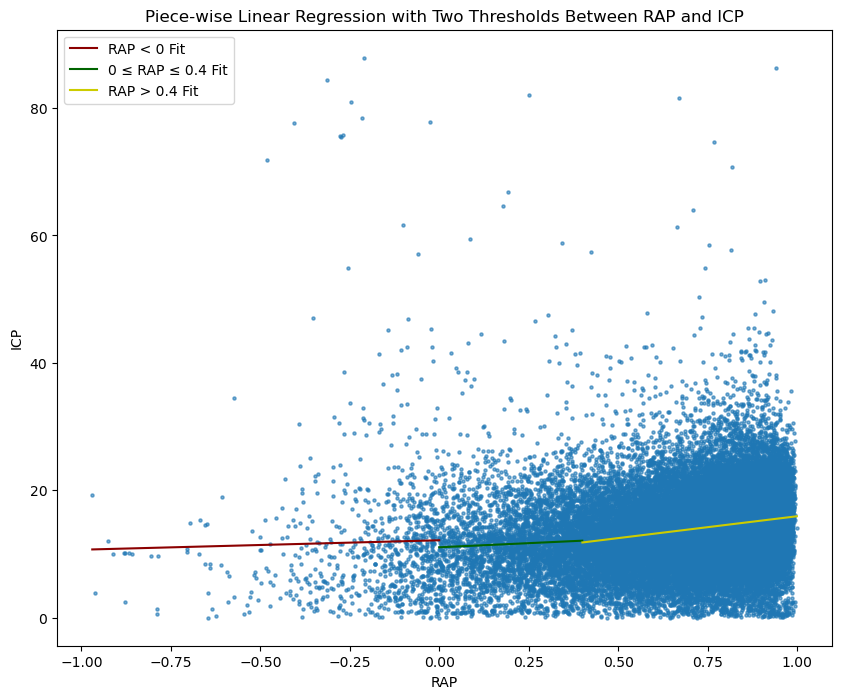

RAP < 0 Fit: Slope = 1.48, Intercept = 12.16
0 ≤ RAP ≤ 0.4 Fit: Slope = 2.59, Intercept = 11.06
RAP > 0.4 Fit: Slope = 6.86, Intercept = 9.06


In [88]:
# For a single parameter
dependent_param = 'ICP'
resolution = 'H'
slope_1, slope_2, slope_3 = scatter_plot_with_piece_wise_linear_regression(df_all, dependent_param, resolution, filtered_timestamps)

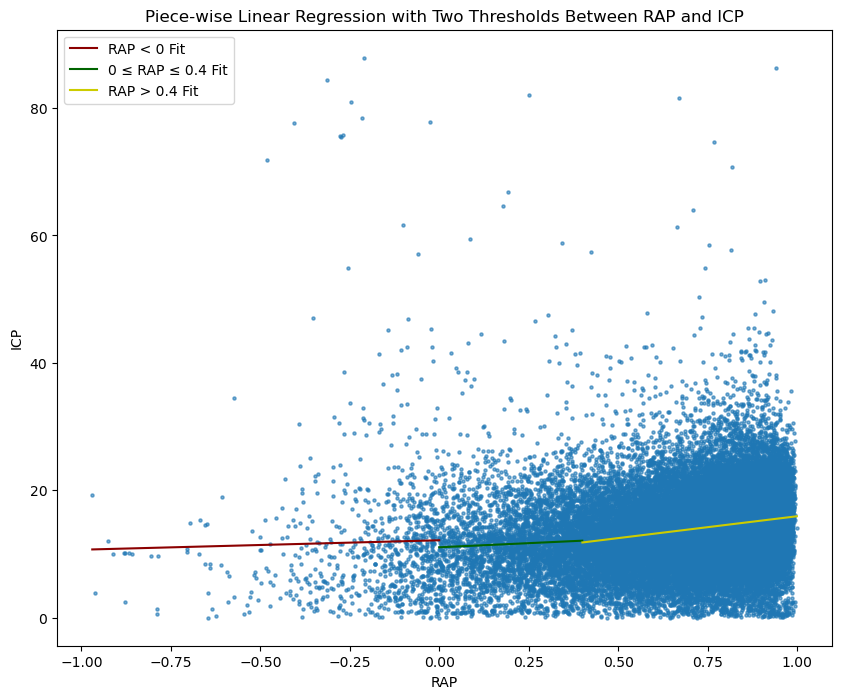

RAP < 0 Fit: Slope = 1.48, Intercept = 12.16
0 ≤ RAP ≤ 0.4 Fit: Slope = 2.59, Intercept = 11.06
RAP > 0.4 Fit: Slope = 6.86, Intercept = 9.06


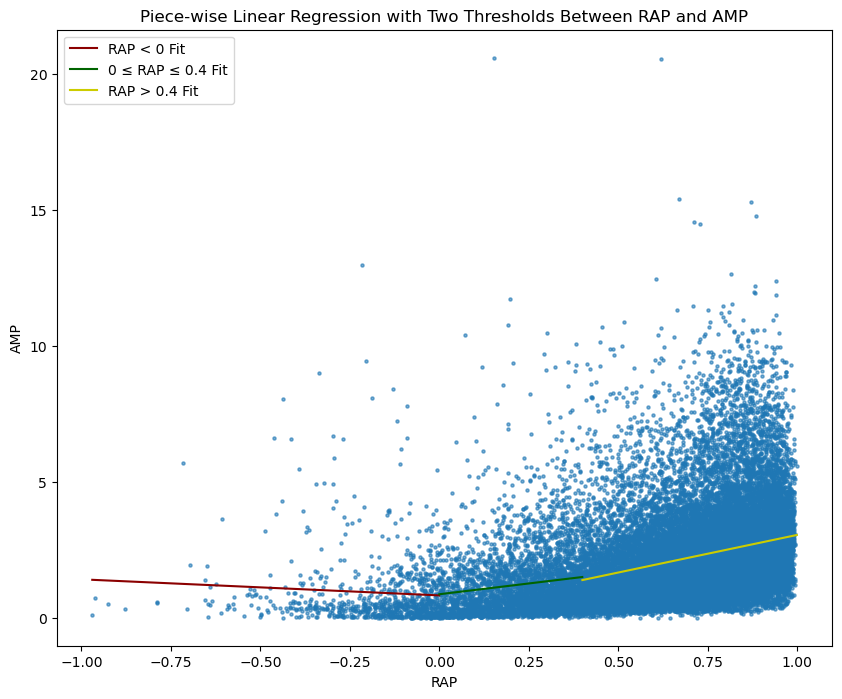

RAP < 0 Fit: Slope = -0.59, Intercept = 0.82
0 ≤ RAP ≤ 0.4 Fit: Slope = 1.59, Intercept = 0.86
RAP > 0.4 Fit: Slope = 2.77, Intercept = 0.28


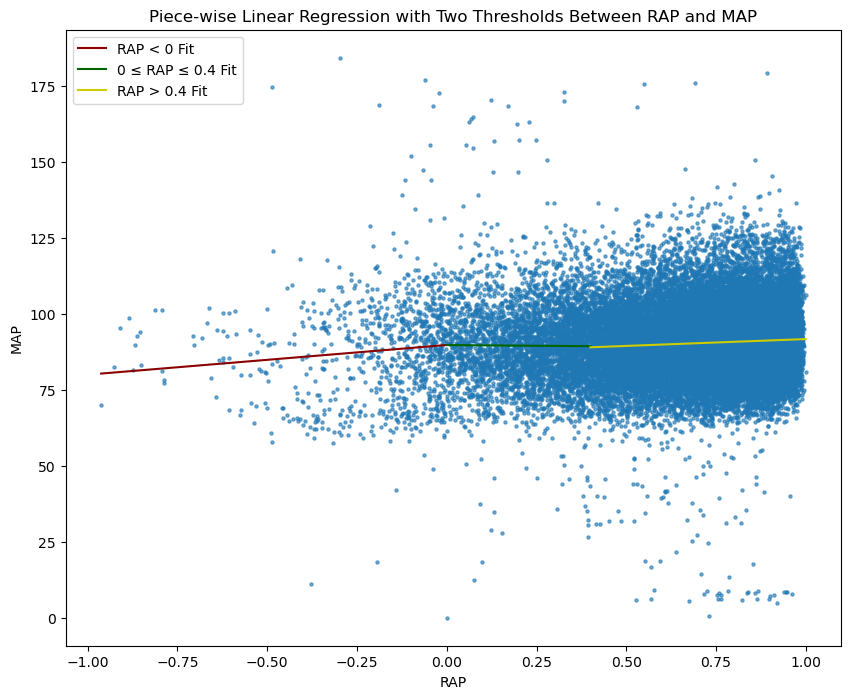

RAP < 0 Fit: Slope = 9.78, Intercept = 89.79
0 ≤ RAP ≤ 0.4 Fit: Slope = -0.91, Intercept = 89.75
RAP > 0.4 Fit: Slope = 4.50, Intercept = 87.22


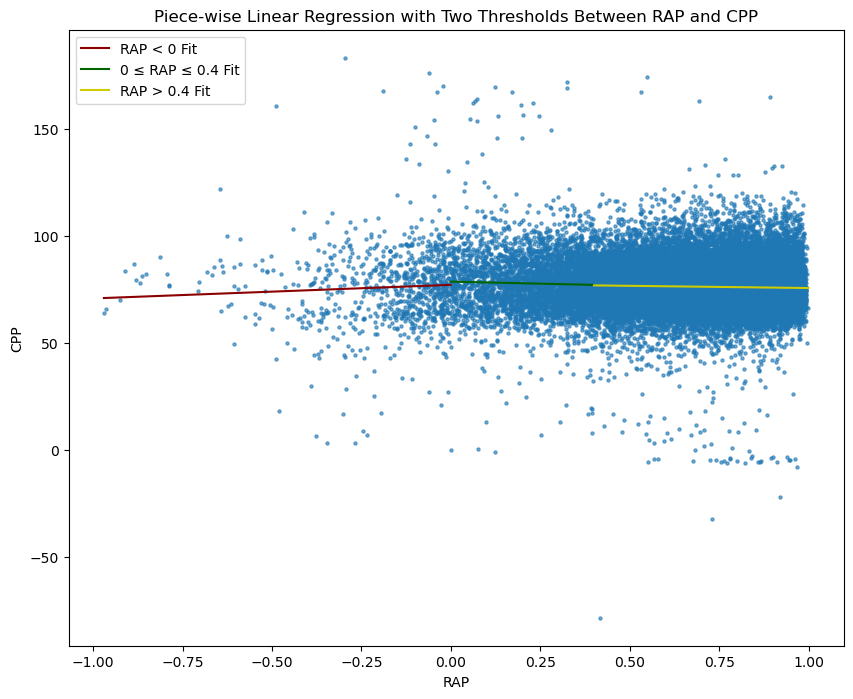

RAP < 0 Fit: Slope = 6.36, Intercept = 77.31
0 ≤ RAP ≤ 0.4 Fit: Slope = -3.79, Intercept = 78.81
RAP > 0.4 Fit: Slope = -2.05, Intercept = 77.87


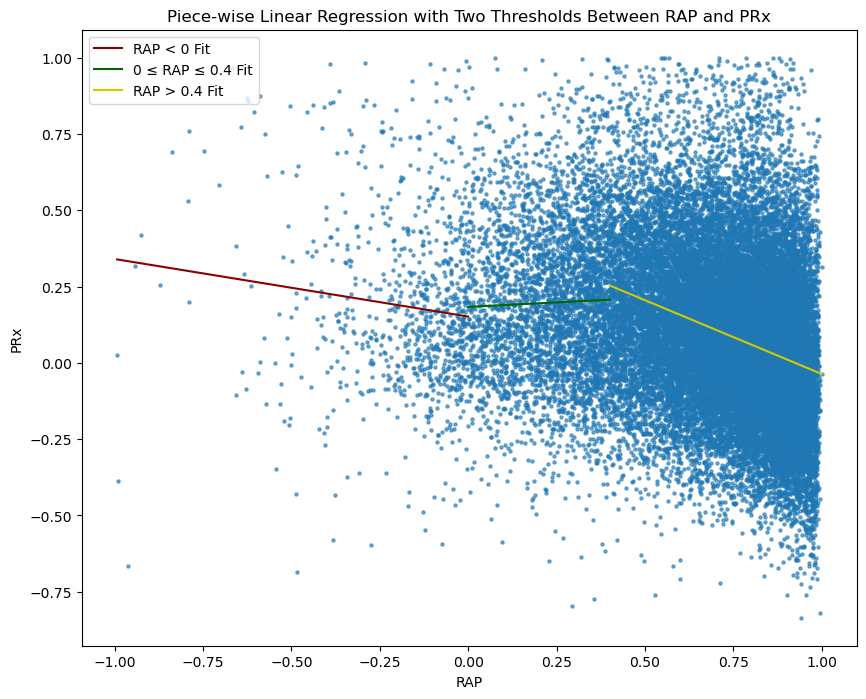

RAP < 0 Fit: Slope = -0.19, Intercept = 0.15
0 ≤ RAP ≤ 0.4 Fit: Slope = 0.06, Intercept = 0.18
RAP > 0.4 Fit: Slope = -0.48, Intercept = 0.45


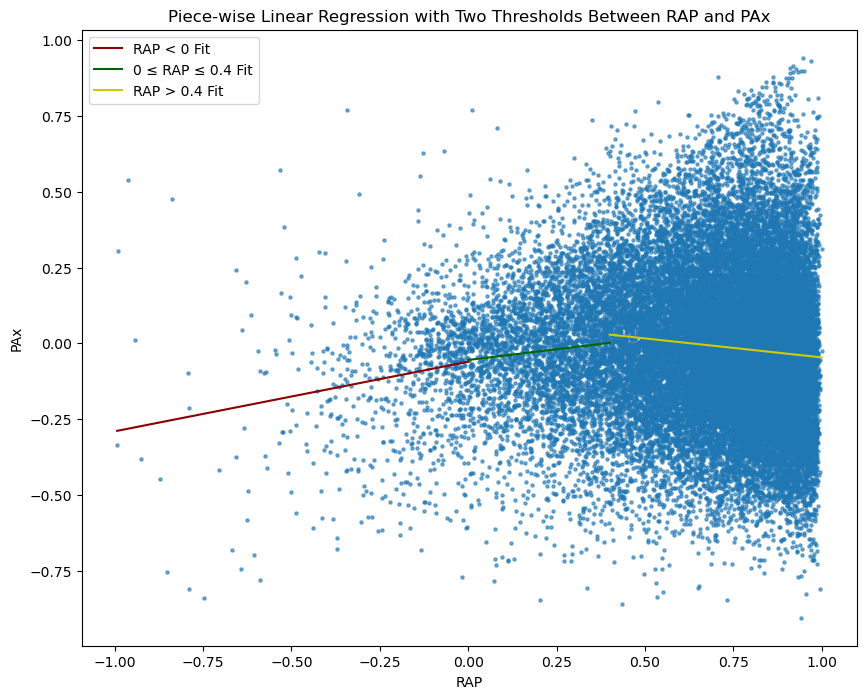

RAP < 0 Fit: Slope = 0.23, Intercept = -0.06
0 ≤ RAP ≤ 0.4 Fit: Slope = 0.14, Intercept = -0.05
RAP > 0.4 Fit: Slope = -0.13, Intercept = 0.08


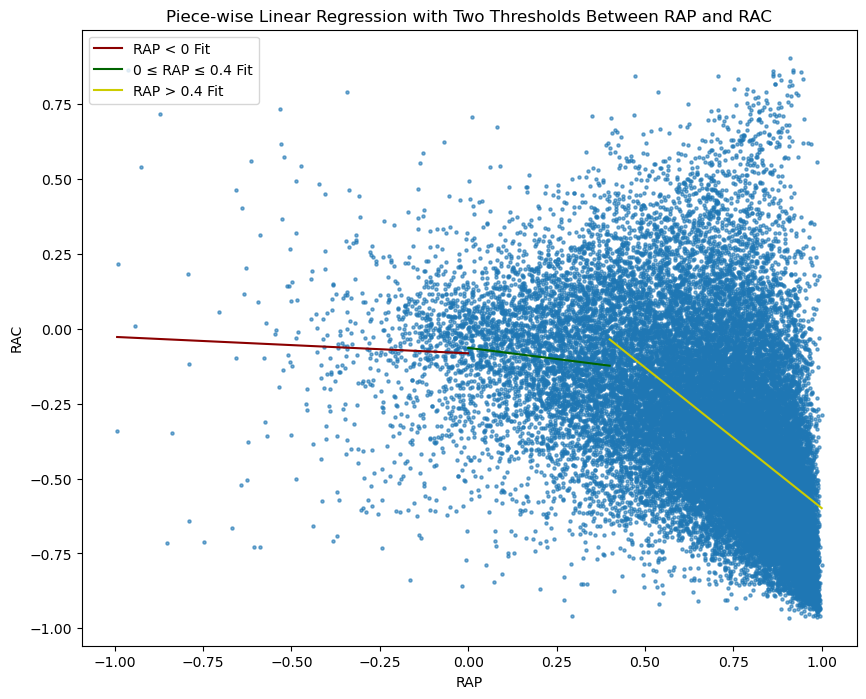

RAP < 0 Fit: Slope = -0.05, Intercept = -0.08
0 ≤ RAP ≤ 0.4 Fit: Slope = -0.15, Intercept = -0.06
RAP > 0.4 Fit: Slope = -0.94, Intercept = 0.34


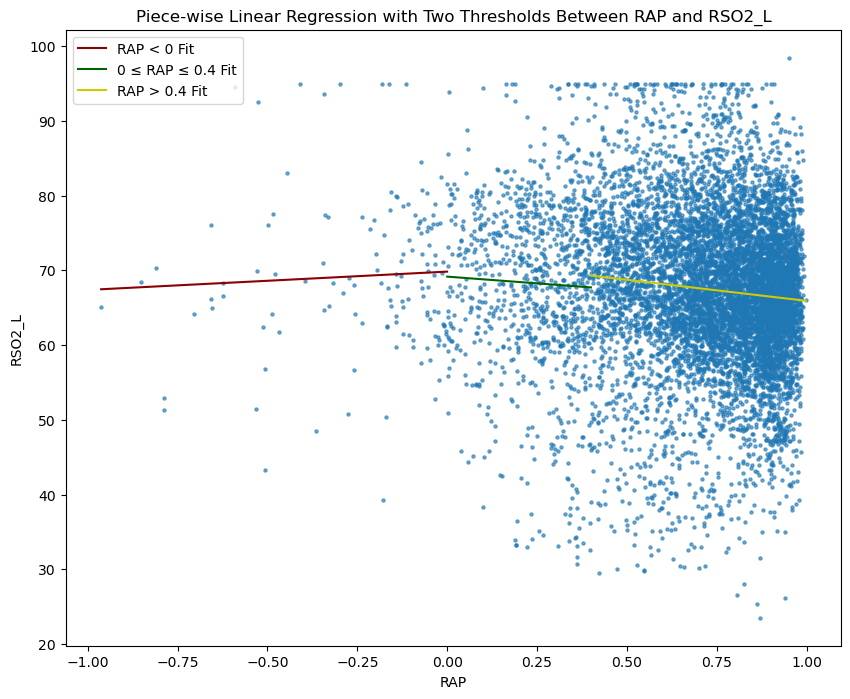

RAP < 0 Fit: Slope = 2.45, Intercept = 69.83
0 ≤ RAP ≤ 0.4 Fit: Slope = -3.61, Intercept = 69.16
RAP > 0.4 Fit: Slope = -5.63, Intercept = 71.54


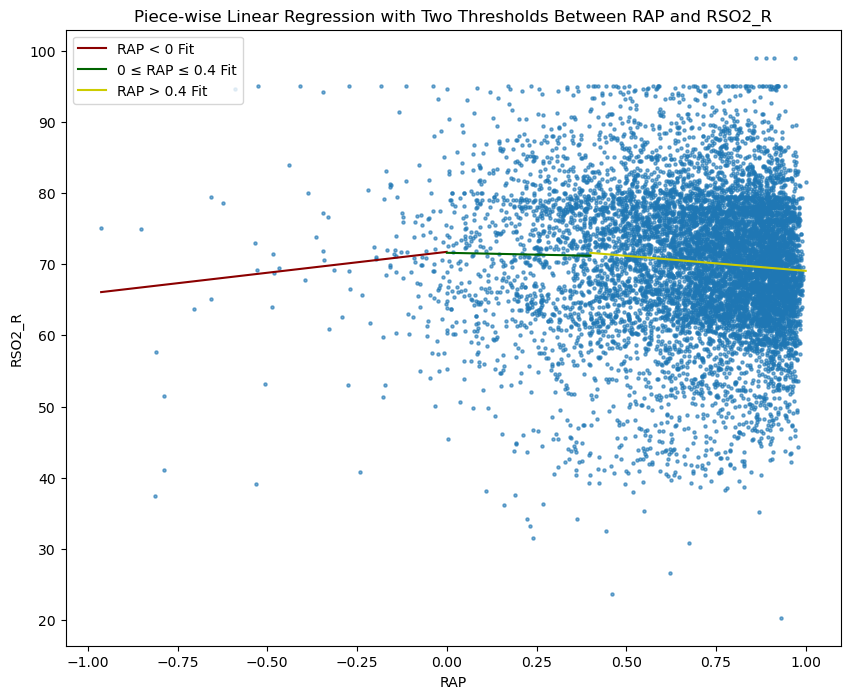

RAP < 0 Fit: Slope = 5.87, Intercept = 71.72
0 ≤ RAP ≤ 0.4 Fit: Slope = -1.04, Intercept = 71.59
RAP > 0.4 Fit: Slope = -4.22, Intercept = 73.27


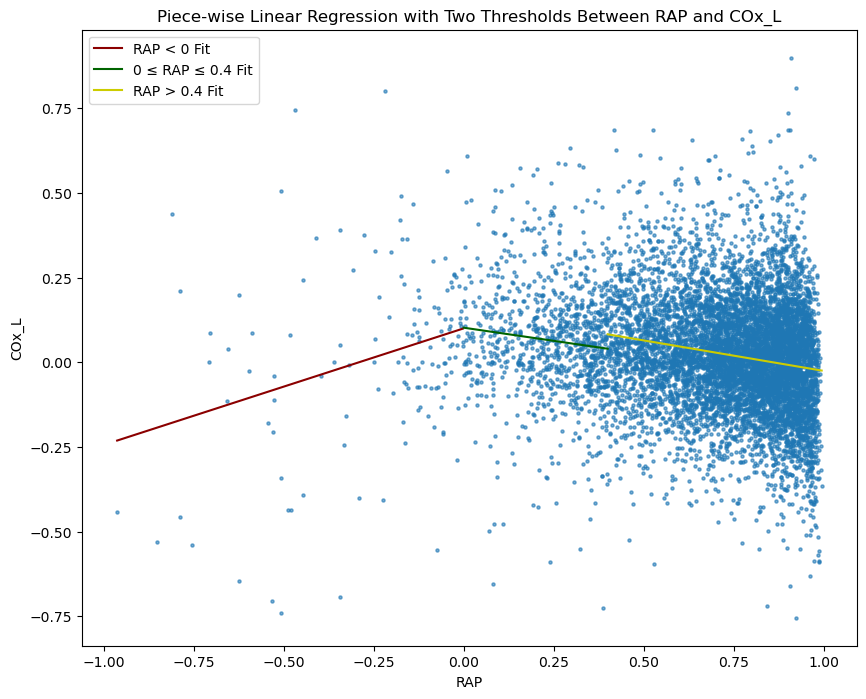

RAP < 0 Fit: Slope = 0.34, Intercept = 0.10
0 ≤ RAP ≤ 0.4 Fit: Slope = -0.16, Intercept = 0.10
RAP > 0.4 Fit: Slope = -0.18, Intercept = 0.15


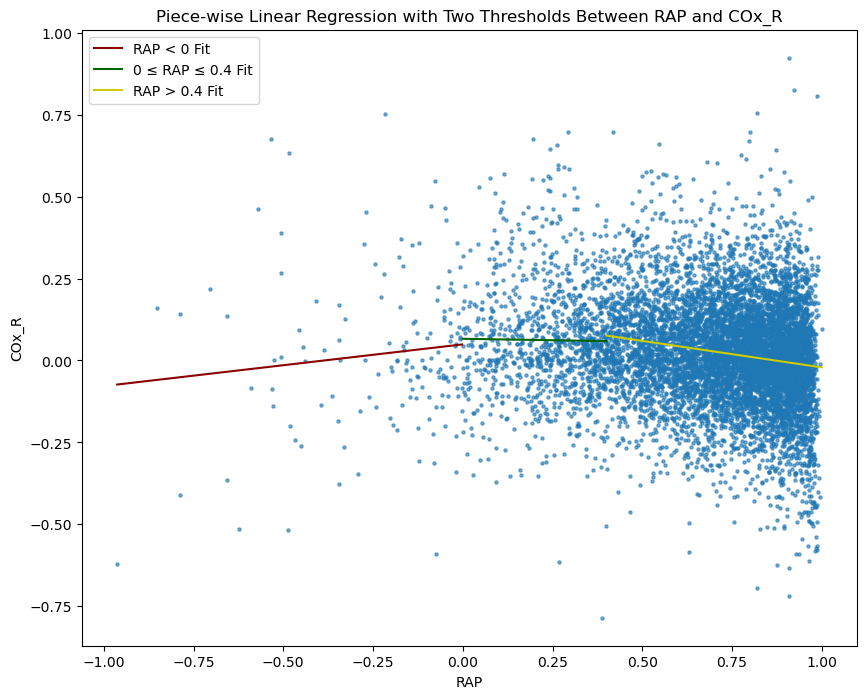

RAP < 0 Fit: Slope = 0.13, Intercept = 0.05
0 ≤ RAP ≤ 0.4 Fit: Slope = -0.02, Intercept = 0.07
RAP > 0.4 Fit: Slope = -0.16, Intercept = 0.14


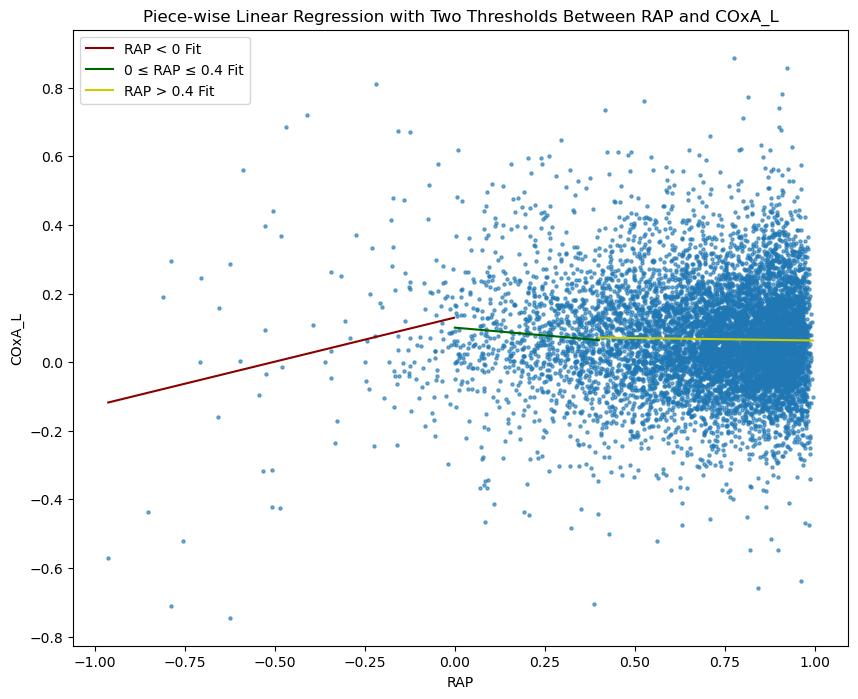

RAP < 0 Fit: Slope = 0.26, Intercept = 0.13
0 ≤ RAP ≤ 0.4 Fit: Slope = -0.09, Intercept = 0.10
RAP > 0.4 Fit: Slope = -0.01, Intercept = 0.08


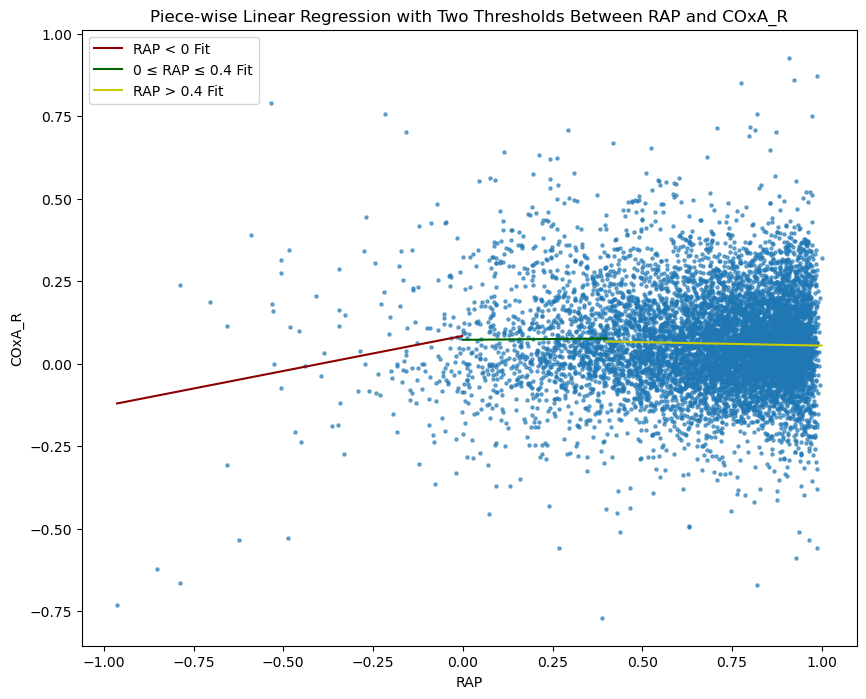

RAP < 0 Fit: Slope = 0.21, Intercept = 0.08
0 ≤ RAP ≤ 0.4 Fit: Slope = 0.01, Intercept = 0.07
RAP > 0.4 Fit: Slope = -0.02, Intercept = 0.08


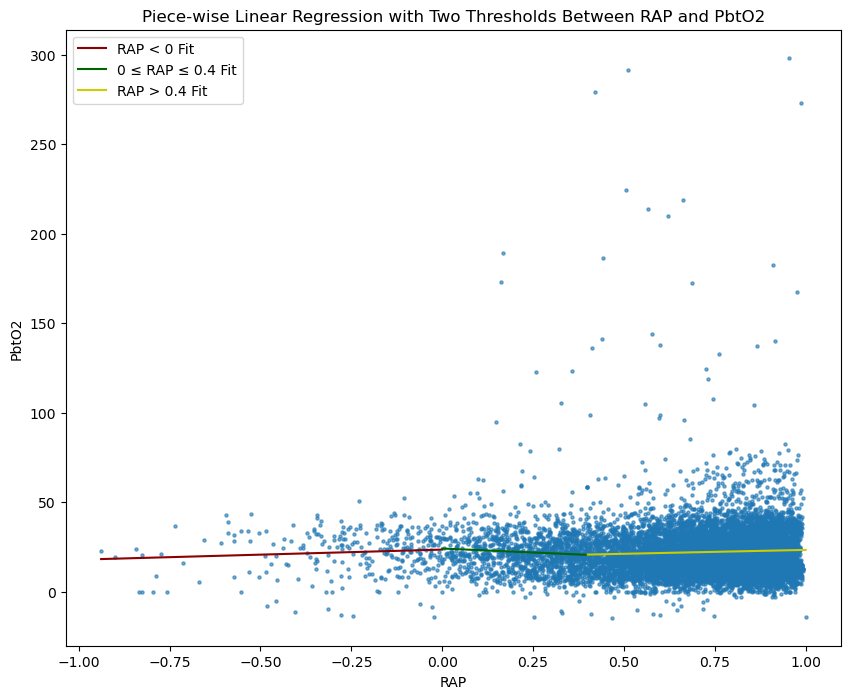

RAP < 0 Fit: Slope = 5.64, Intercept = 23.53
0 ≤ RAP ≤ 0.4 Fit: Slope = -8.84, Intercept = 24.13
RAP > 0.4 Fit: Slope = 4.36, Intercept = 19.01


In [92]:
resolution = 'H'
labels = ['RAP < 0', '0 ≤ RAP ≤ 0.4', 'RAP > 0.4']
columns = df_all.columns.to_list()
columns.remove('RAP')
columns.remove('DateTime')
df_slope = pd.DataFrame(index=range(len(columns)), columns=labels)

for index, parameter in enumerate(columns):
    slope_1, slope_2, slope_3 = scatter_plot_with_piece_wise_linear_regression(df_all, parameter, resolution, filtered_timestamps)

    df_slope.at[index, labels[0]] = slope_1
    df_slope.at[index, labels[1]] = slope_2
    df_slope.at[index, labels[2]] = slope_3
    
df_slope.index = columns

In [93]:
df_slope

,RAP < 0,0 ≤ RAP ≤ 0.4,RAP > 0.4
ICP,1.48,2.59,6.86
AMP,-0.59,1.59,2.77
MAP,9.78,-0.91,4.5
CPP,6.36,-3.79,-2.05
PRx,-0.19,0.06,-0.48
PAx,0.23,0.14,-0.13
RAC,-0.05,-0.15,-0.94
RSO2_L,2.45,-3.61,-5.63
RSO2_R,5.87,-1.04,-4.22
COx_L,0.34,-0.16,-0.18


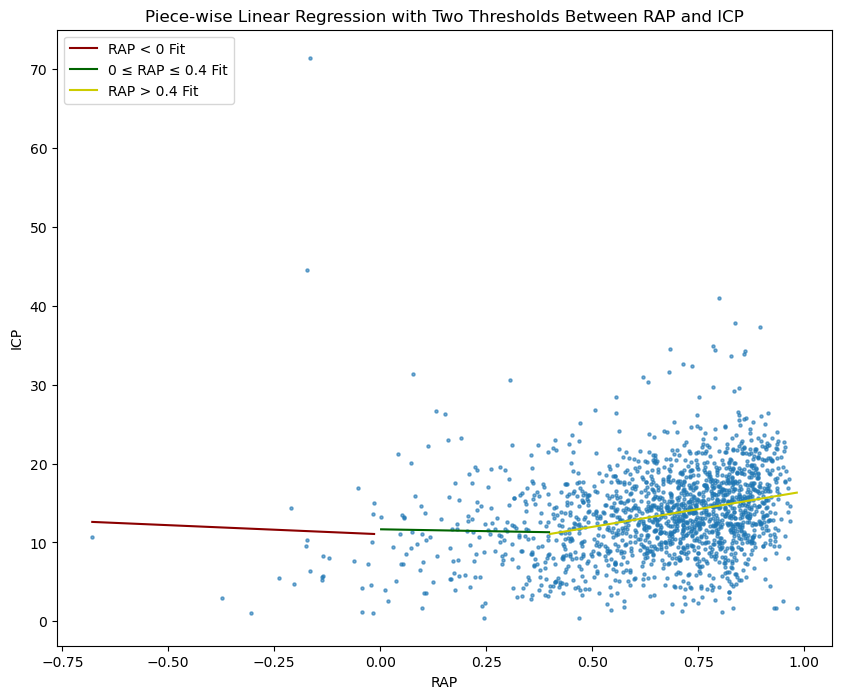

RAP < 0 Fit: Slope = -2.30, Intercept = 11.04
0 ≤ RAP ≤ 0.4 Fit: Slope = -0.93, Intercept = 11.67
RAP > 0.4 Fit: Slope = 8.99, Intercept = 7.48


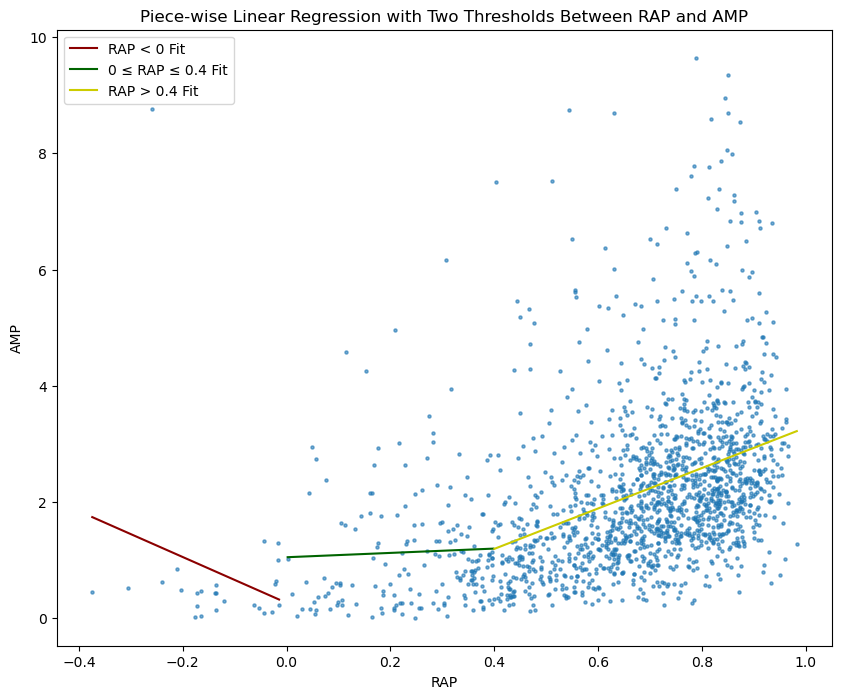

RAP < 0 Fit: Slope = -3.94, Intercept = 0.26
0 ≤ RAP ≤ 0.4 Fit: Slope = 0.37, Intercept = 1.05
RAP > 0.4 Fit: Slope = 3.48, Intercept = -0.20


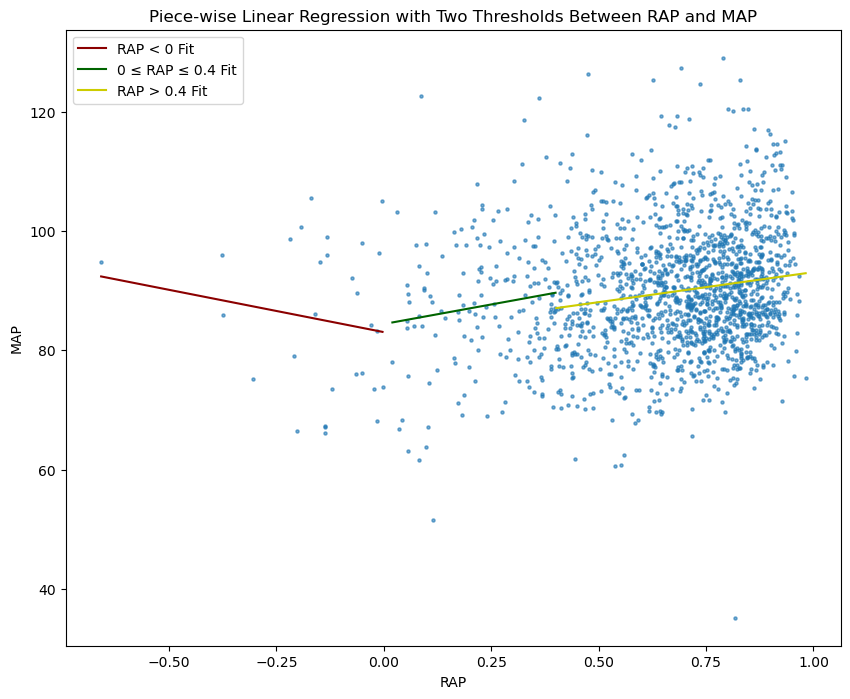

RAP < 0 Fit: Slope = -14.18, Intercept = 83.06
0 ≤ RAP ≤ 0.4 Fit: Slope = 13.10, Intercept = 84.42
RAP > 0.4 Fit: Slope = 10.06, Intercept = 83.05


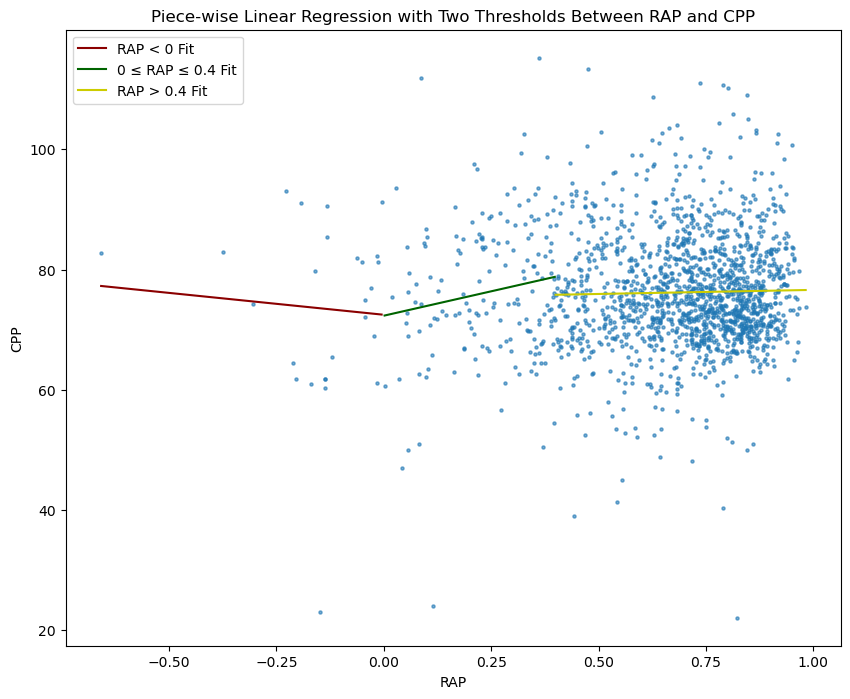

RAP < 0 Fit: Slope = -7.28, Intercept = 72.49
0 ≤ RAP ≤ 0.4 Fit: Slope = 16.22, Intercept = 72.33
RAP > 0.4 Fit: Slope = 1.36, Intercept = 75.27


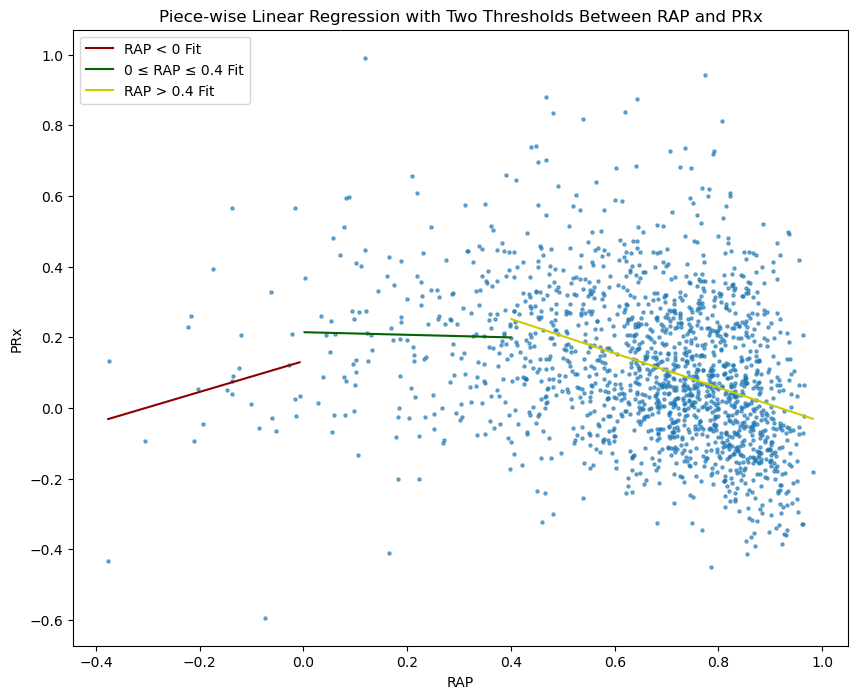

RAP < 0 Fit: Slope = 0.44, Intercept = 0.13
0 ≤ RAP ≤ 0.4 Fit: Slope = -0.04, Intercept = 0.21
RAP > 0.4 Fit: Slope = -0.49, Intercept = 0.45


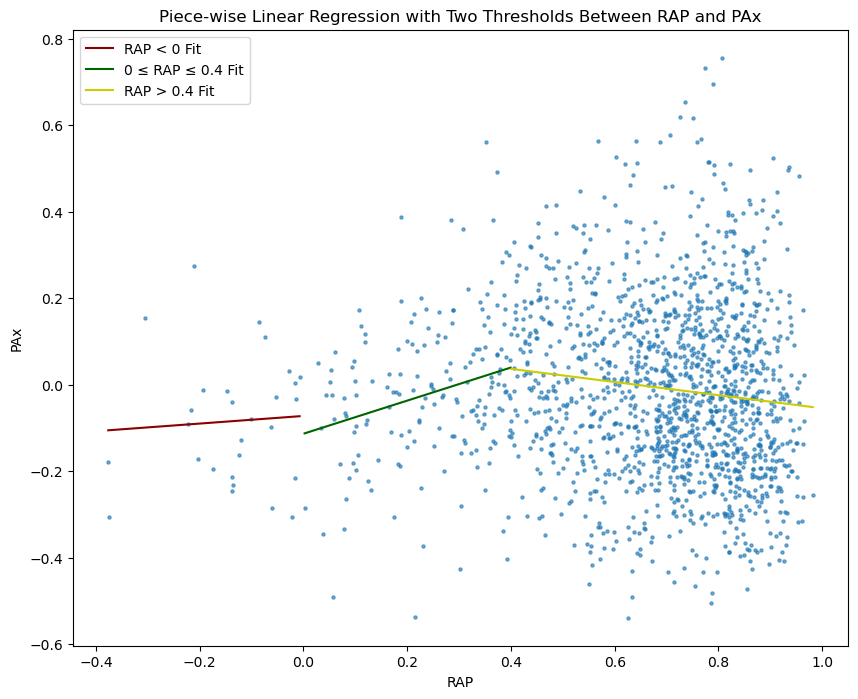

RAP < 0 Fit: Slope = 0.09, Intercept = -0.07
0 ≤ RAP ≤ 0.4 Fit: Slope = 0.38, Intercept = -0.11
RAP > 0.4 Fit: Slope = -0.15, Intercept = 0.10


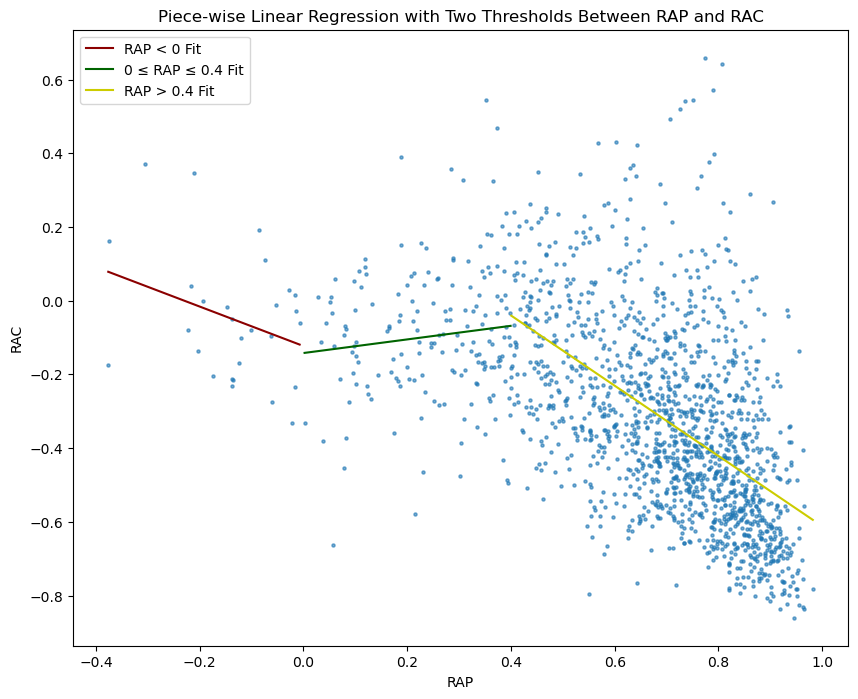

RAP < 0 Fit: Slope = -0.54, Intercept = -0.12
0 ≤ RAP ≤ 0.4 Fit: Slope = 0.18, Intercept = -0.14
RAP > 0.4 Fit: Slope = -0.95, Intercept = 0.34


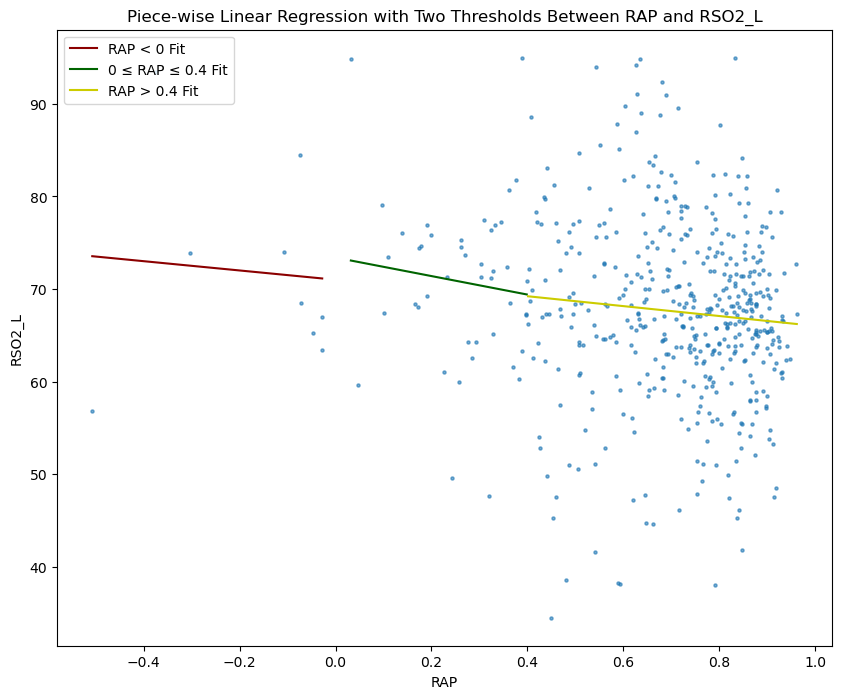

RAP < 0 Fit: Slope = -5.01, Intercept = 71.01
0 ≤ RAP ≤ 0.4 Fit: Slope = -9.99, Intercept = 73.40
RAP > 0.4 Fit: Slope = -5.35, Intercept = 71.37


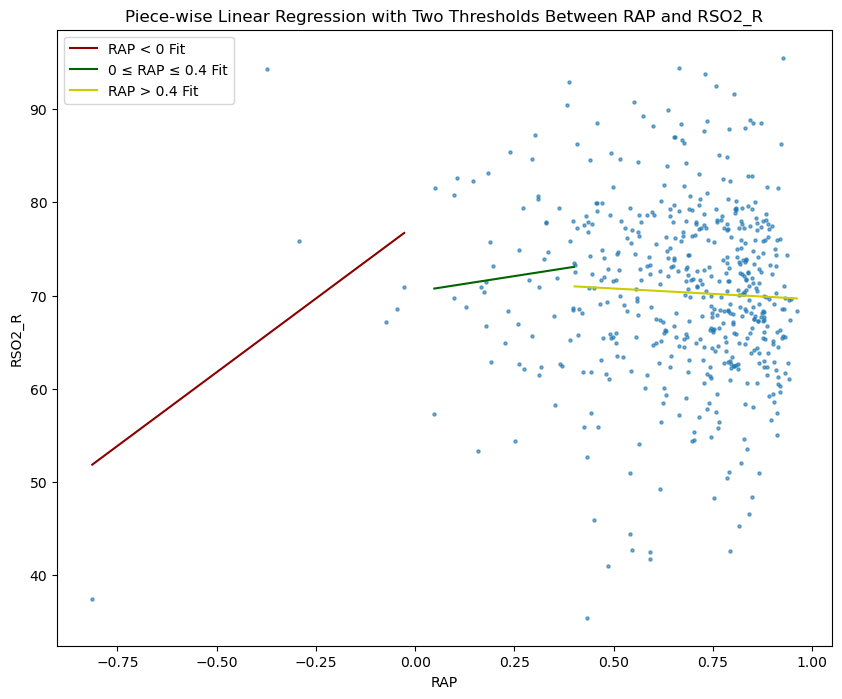

RAP < 0 Fit: Slope = 31.64, Intercept = 77.60
0 ≤ RAP ≤ 0.4 Fit: Slope = 6.62, Intercept = 70.44
RAP > 0.4 Fit: Slope = -2.30, Intercept = 71.91


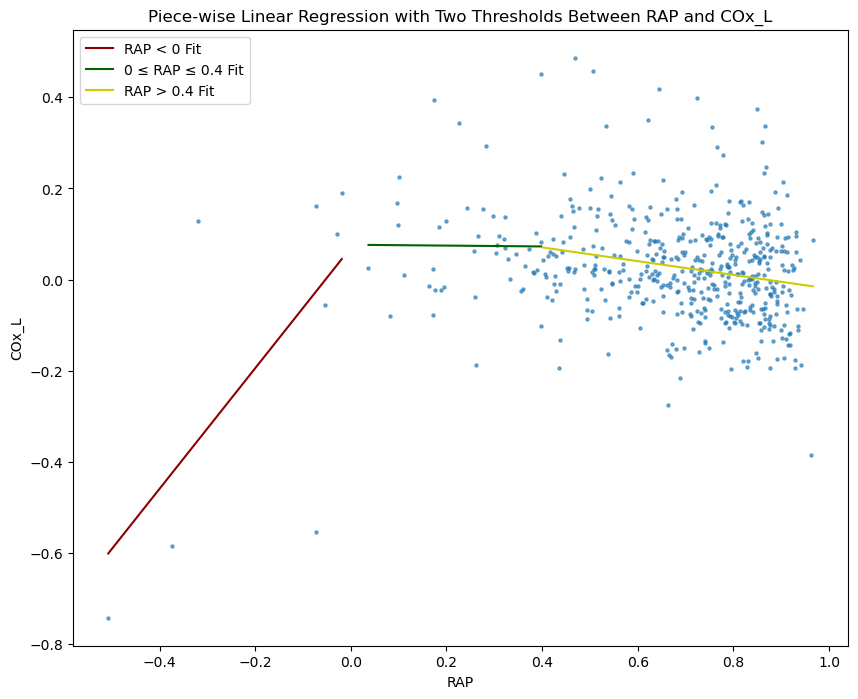

RAP < 0 Fit: Slope = 1.32, Intercept = 0.07
0 ≤ RAP ≤ 0.4 Fit: Slope = -0.01, Intercept = 0.08
RAP > 0.4 Fit: Slope = -0.15, Intercept = 0.13


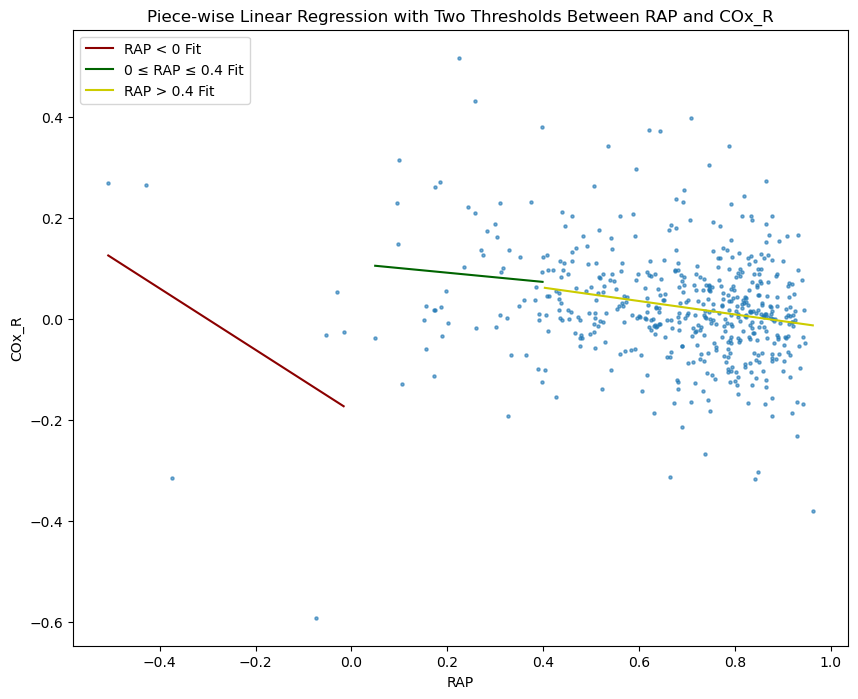

RAP < 0 Fit: Slope = -0.61, Intercept = -0.18
0 ≤ RAP ≤ 0.4 Fit: Slope = -0.09, Intercept = 0.11
RAP > 0.4 Fit: Slope = -0.13, Intercept = 0.11


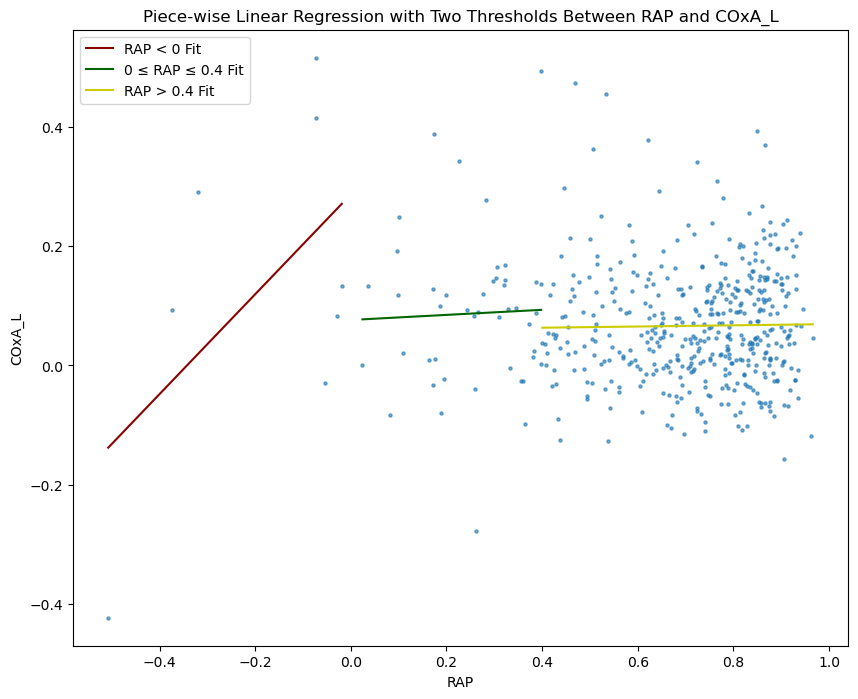

RAP < 0 Fit: Slope = 0.84, Intercept = 0.29
0 ≤ RAP ≤ 0.4 Fit: Slope = 0.04, Intercept = 0.08
RAP > 0.4 Fit: Slope = 0.01, Intercept = 0.06


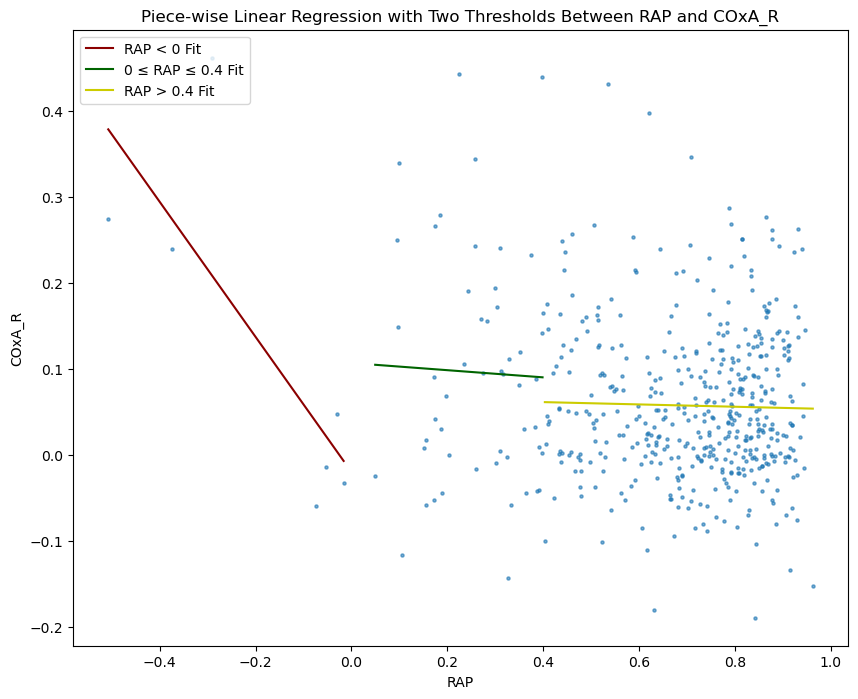

RAP < 0 Fit: Slope = -0.79, Intercept = -0.02
0 ≤ RAP ≤ 0.4 Fit: Slope = -0.04, Intercept = 0.11
RAP > 0.4 Fit: Slope = -0.01, Intercept = 0.07


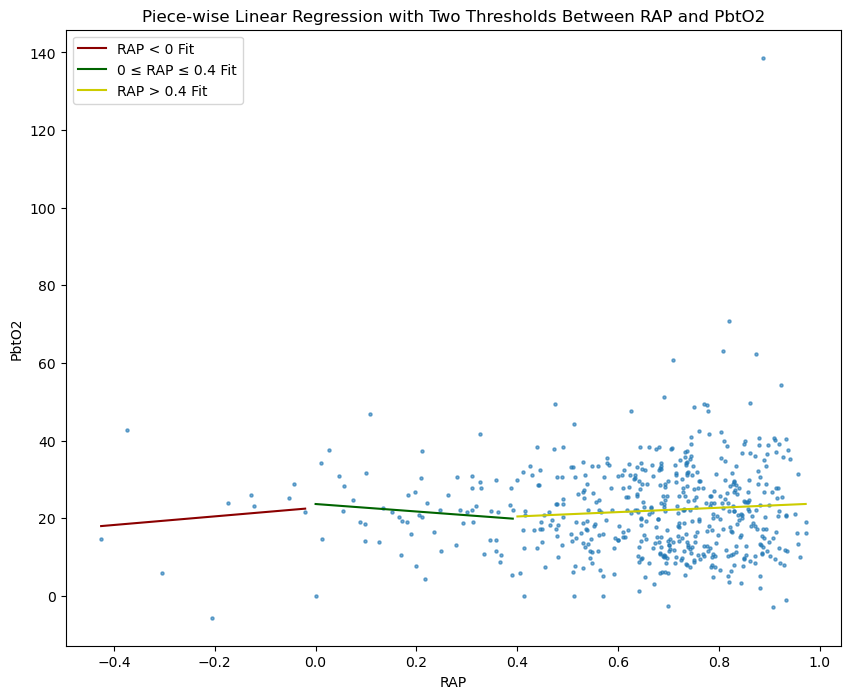

RAP < 0 Fit: Slope = 11.10, Intercept = 22.67
0 ≤ RAP ≤ 0.4 Fit: Slope = -9.64, Intercept = 23.64
RAP > 0.4 Fit: Slope = 5.63, Intercept = 18.17


In [94]:
resolution = 'D'
labels = ['RAP < 0', '0 ≤ RAP ≤ 0.4', 'RAP > 0.4']
columns = df_all.columns.to_list()
columns.remove('RAP')
columns.remove('DateTime')
df_slope = pd.DataFrame(index=range(len(columns)), columns=labels)

for index, parameter in enumerate(columns):
    slope_1, slope_2, slope_3 = scatter_plot_with_piece_wise_linear_regression(df_all, parameter, resolution, filtered_timestamps)

    df_slope.at[index, labels[0]] = slope_1
    df_slope.at[index, labels[1]] = slope_2
    df_slope.at[index, labels[2]] = slope_3
    
df_slope.index = columns

In [95]:
df_slope

,RAP < 0,0 ≤ RAP ≤ 0.4,RAP > 0.4
ICP,-2.3,-0.93,8.99
AMP,-3.94,0.37,3.48
MAP,-14.18,13.1,10.06
CPP,-7.28,16.22,1.36
PRx,0.44,-0.04,-0.49
PAx,0.09,0.38,-0.15
RAC,-0.54,0.18,-0.95
RSO2_L,-5.01,-9.99,-5.35
RSO2_R,31.64,6.62,-2.3
COx_L,1.32,-0.01,-0.15


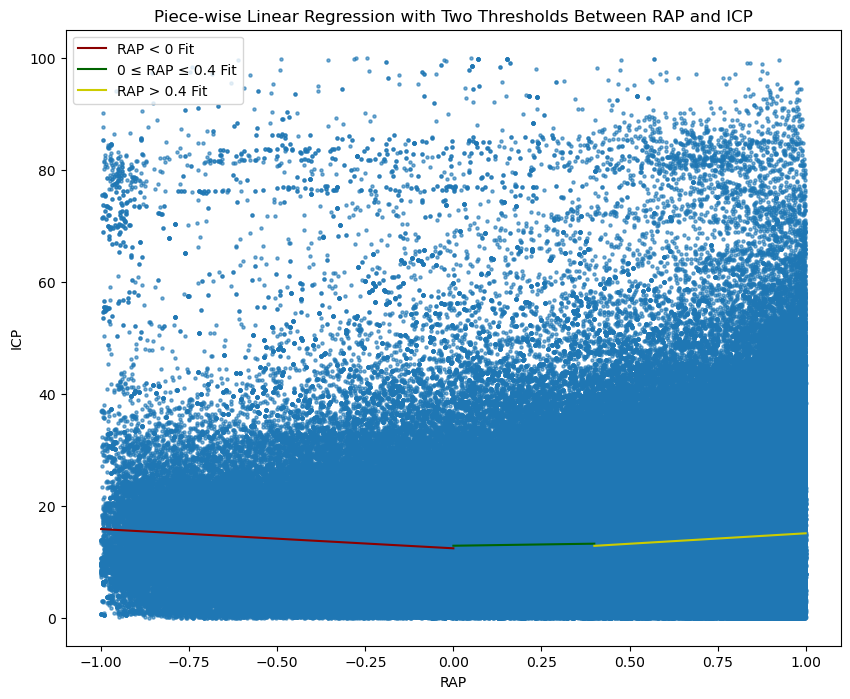

RAP < 0 Fit: Slope = -3.43, Intercept = 12.39
0 ≤ RAP ≤ 0.4 Fit: Slope = 0.92, Intercept = 12.85
RAP > 0.4 Fit: Slope = 3.73, Intercept = 11.34


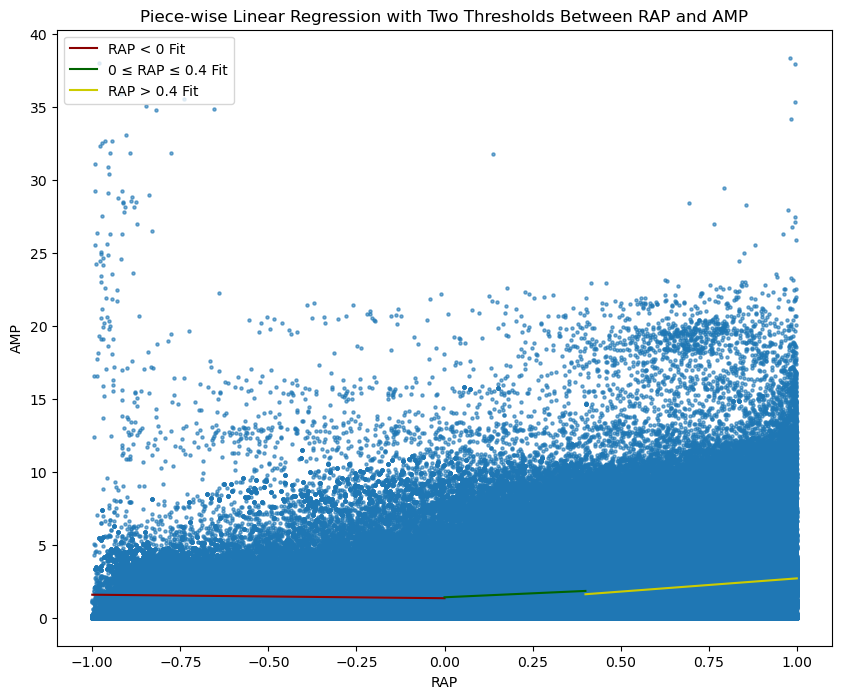

RAP < 0 Fit: Slope = -0.24, Intercept = 1.34
0 ≤ RAP ≤ 0.4 Fit: Slope = 1.09, Intercept = 1.40
RAP > 0.4 Fit: Slope = 1.81, Intercept = 0.89


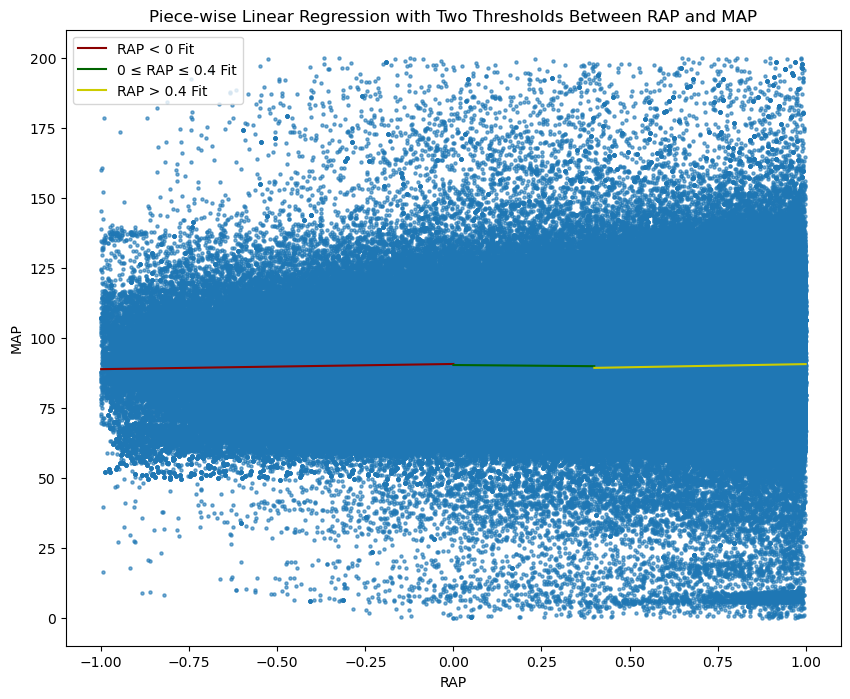

RAP < 0 Fit: Slope = 1.85, Intercept = 90.62
0 ≤ RAP ≤ 0.4 Fit: Slope = -1.05, Intercept = 90.25
RAP > 0.4 Fit: Slope = 2.25, Intercept = 88.34


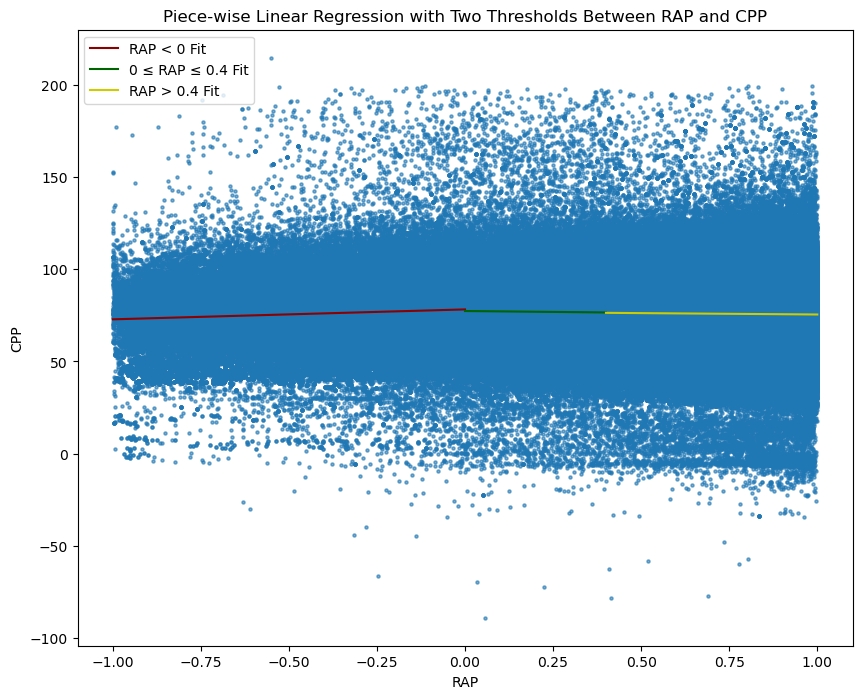

RAP < 0 Fit: Slope = 5.38, Intercept = 78.22
0 ≤ RAP ≤ 0.4 Fit: Slope = -1.95, Intercept = 77.36
RAP > 0.4 Fit: Slope = -1.50, Intercept = 76.97


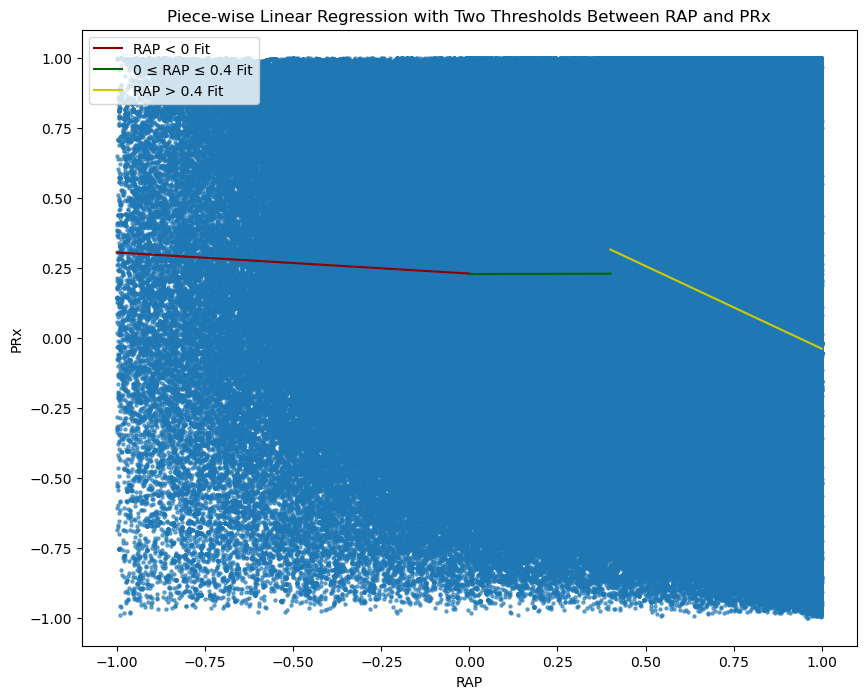

RAP < 0 Fit: Slope = -0.08, Intercept = 0.23
0 ≤ RAP ≤ 0.4 Fit: Slope = 0.00, Intercept = 0.23
RAP > 0.4 Fit: Slope = -0.59, Intercept = 0.55


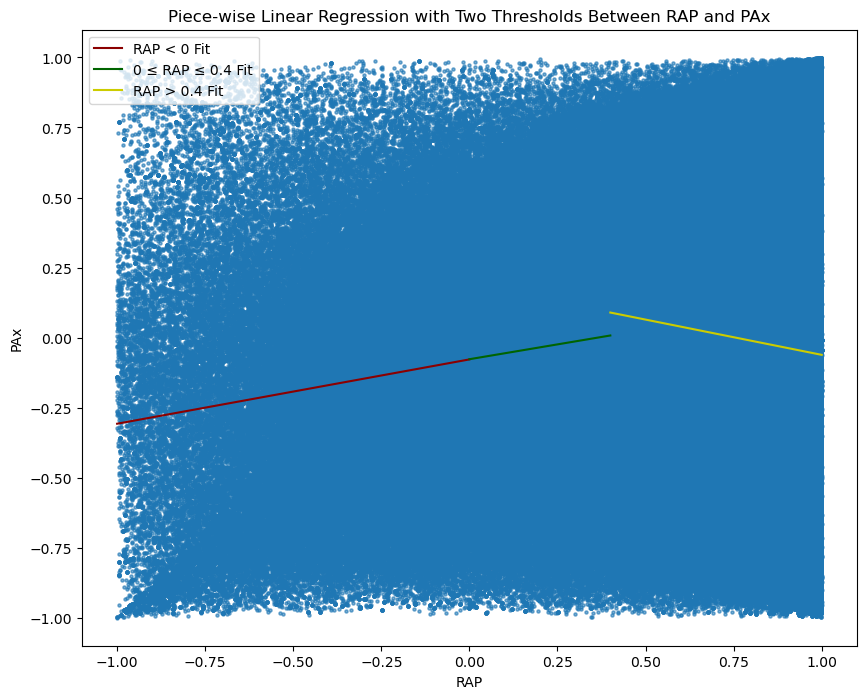

RAP < 0 Fit: Slope = 0.23, Intercept = -0.08
0 ≤ RAP ≤ 0.4 Fit: Slope = 0.21, Intercept = -0.08
RAP > 0.4 Fit: Slope = -0.25, Intercept = 0.19


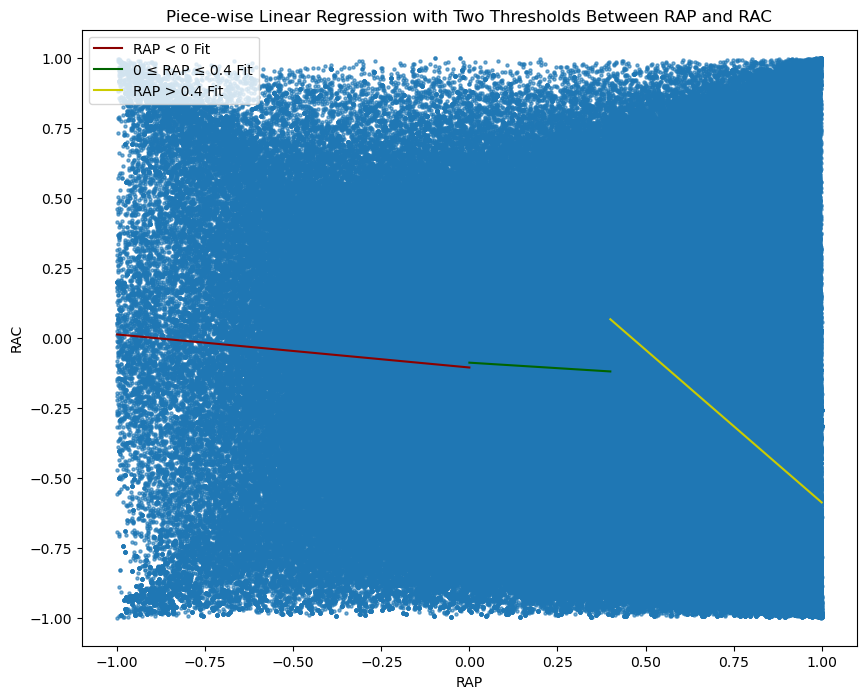

RAP < 0 Fit: Slope = -0.12, Intercept = -0.11
0 ≤ RAP ≤ 0.4 Fit: Slope = -0.08, Intercept = -0.09
RAP > 0.4 Fit: Slope = -1.09, Intercept = 0.50


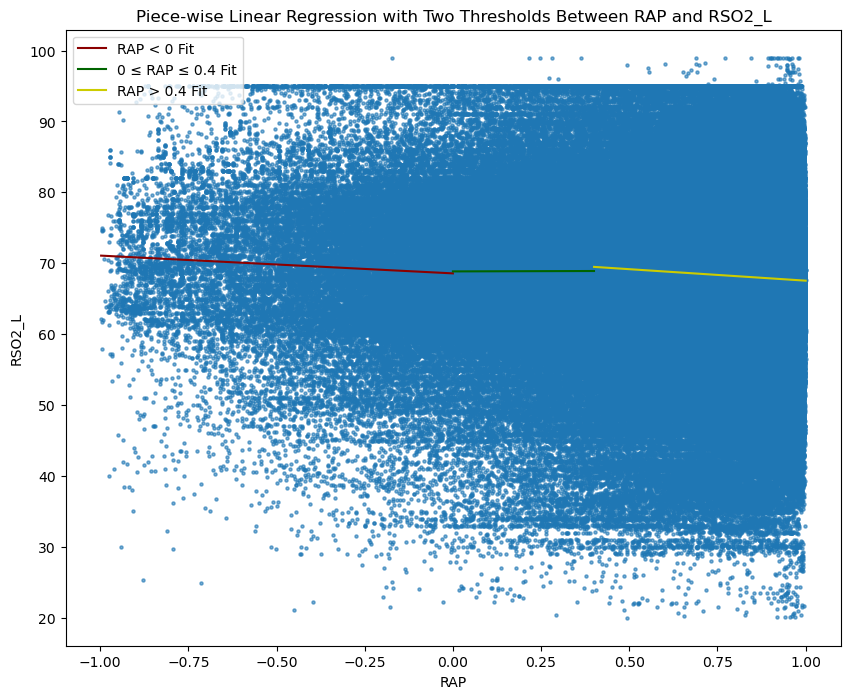

RAP < 0 Fit: Slope = -2.51, Intercept = 68.57
0 ≤ RAP ≤ 0.4 Fit: Slope = 0.14, Intercept = 68.85
RAP > 0.4 Fit: Slope = -3.24, Intercept = 70.79


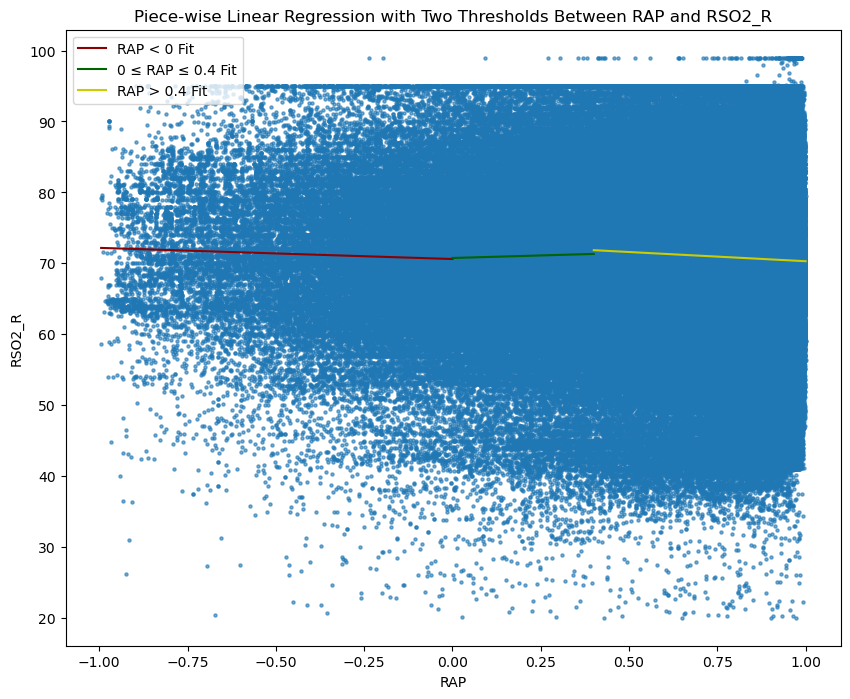

RAP < 0 Fit: Slope = -1.57, Intercept = 70.61
0 ≤ RAP ≤ 0.4 Fit: Slope = 1.44, Intercept = 70.75
RAP > 0.4 Fit: Slope = -2.59, Intercept = 72.89


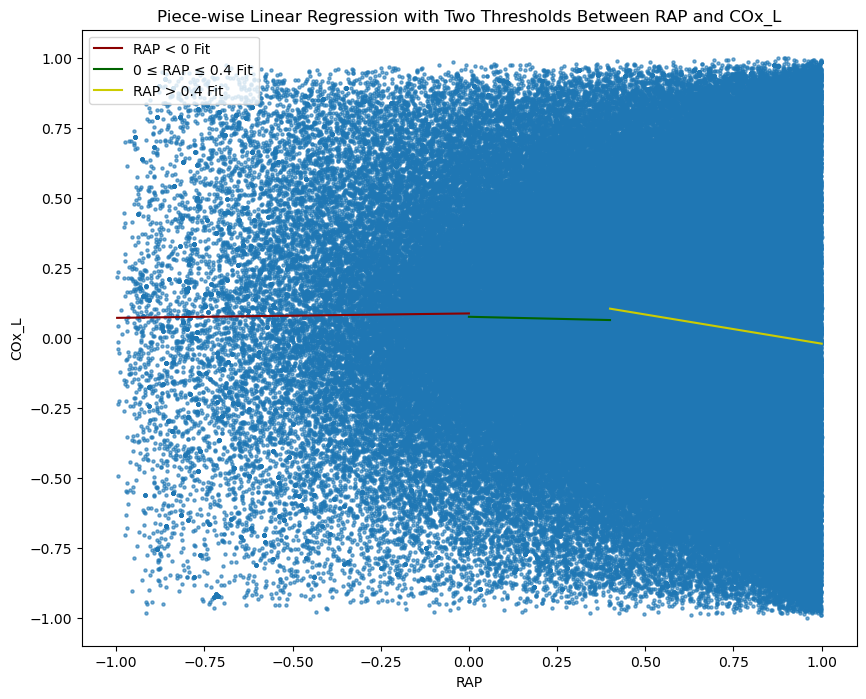

RAP < 0 Fit: Slope = 0.02, Intercept = 0.09
0 ≤ RAP ≤ 0.4 Fit: Slope = -0.03, Intercept = 0.07
RAP > 0.4 Fit: Slope = -0.21, Intercept = 0.19


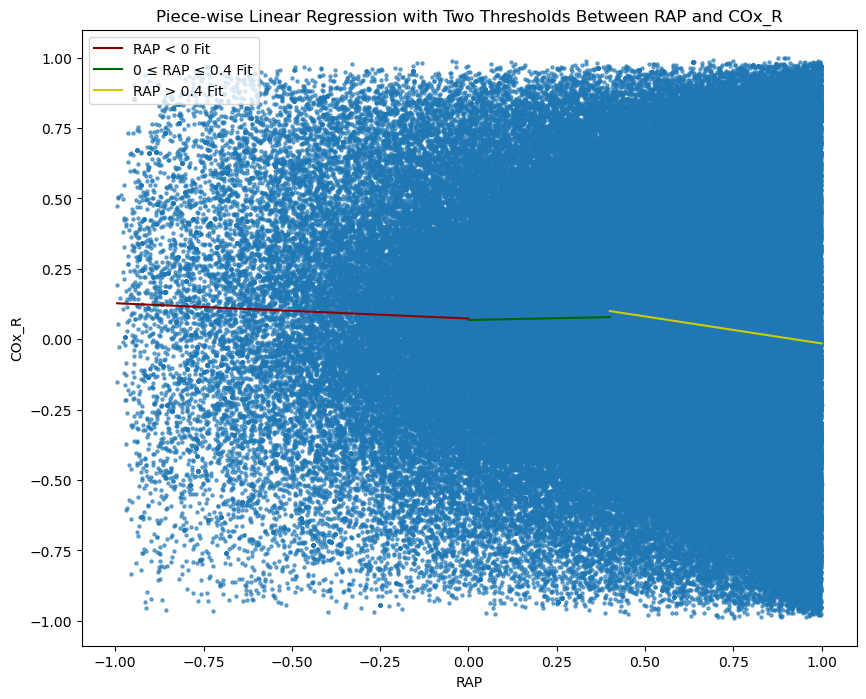

RAP < 0 Fit: Slope = -0.05, Intercept = 0.07
0 ≤ RAP ≤ 0.4 Fit: Slope = 0.03, Intercept = 0.07
RAP > 0.4 Fit: Slope = -0.19, Intercept = 0.18


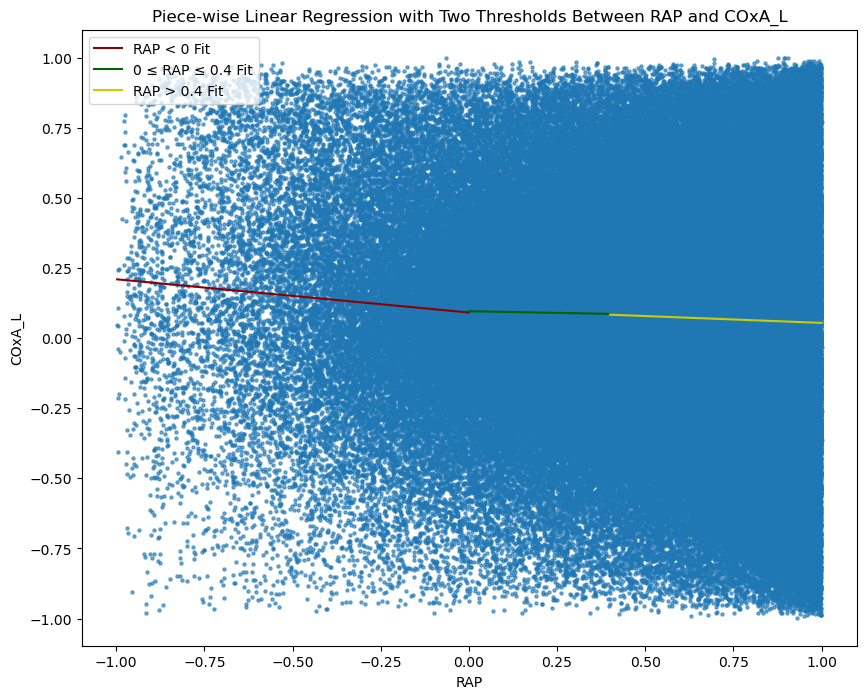

RAP < 0 Fit: Slope = -0.12, Intercept = 0.09
0 ≤ RAP ≤ 0.4 Fit: Slope = -0.02, Intercept = 0.10
RAP > 0.4 Fit: Slope = -0.05, Intercept = 0.10


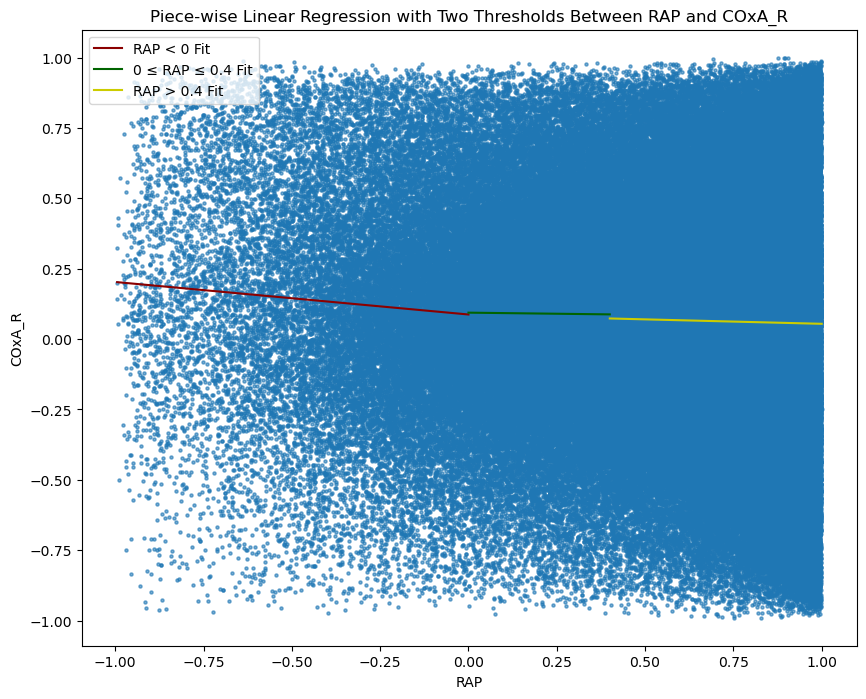

RAP < 0 Fit: Slope = -0.12, Intercept = 0.09
0 ≤ RAP ≤ 0.4 Fit: Slope = -0.02, Intercept = 0.09
RAP > 0.4 Fit: Slope = -0.03, Intercept = 0.09


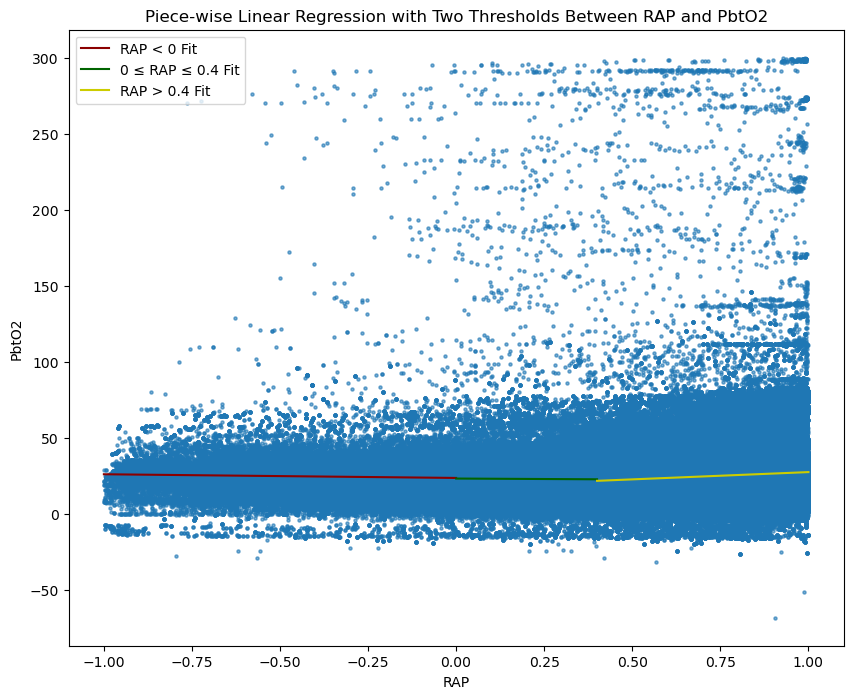

RAP < 0 Fit: Slope = -2.43, Intercept = 23.58
0 ≤ RAP ≤ 0.4 Fit: Slope = -1.22, Intercept = 23.18
RAP > 0.4 Fit: Slope = 9.58, Intercept = 17.84


In [59]:
resolution = 'M'
labels = ['RAP < 0', '0 ≤ RAP ≤ 0.4', 'RAP > 0.4']
columns = df_all.columns.to_list()
columns.remove('RAP')
columns.remove('DateTime')
df_slope = pd.DataFrame(index=range(len(columns)), columns=labels)

for index, parameter in enumerate(columns):
    slope_1, slope_2, slope_3 = scatter_plot_with_piece_wise_linear_regression(df_all, parameter, resolution, filtered_timestamps)

    df_slope.at[index, labels[0]] = slope_1
    df_slope.at[index, labels[1]] = slope_2
    df_slope.at[index, labels[2]] = slope_3
    
df_slope.index = columns

In [60]:
df_slope

,RAP < 0,0 ≤ RAP ≤ 0.4,RAP > 0.4
ICP,-3.43,0.92,3.73
AMP,-0.24,1.09,1.81
MAP,1.85,-1.05,2.25
CPP,5.38,-1.95,-1.5
PRx,-0.08,0.0,-0.59
PAx,0.23,0.21,-0.25
RAC,-0.12,-0.08,-1.09
RSO2_L,-2.51,0.14,-3.24
RSO2_R,-1.57,1.44,-2.59
COx_L,0.02,-0.03,-0.21


## Boxplots

In [61]:
def boxplots_with_values(df_all, dependent_param, values, resolution, filtered_timestamps):
    
    warnings.filterwarnings('ignore')
     
    # Separating the columns that would be plotted
    df_pair = df_all[['DateTime', 'RAP', dependent_param]]
    
    # Declaring the NIRS measures
    NIRS_measures_list = ['RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R']
    # Checking if it's a NIRS measure and if yes, dropping the rows according to the threshold
    if dependent_param in NIRS_measures_list:
        df_pair = df_pair[~df_pair['DateTime'].isin(filtered_timestamps)]
        df_pair = df_pair.loc[df_pair[dependent_param] != 0]
        
    # Dropping the Nan values
    df_pair = df_pair.dropna()
    # Converting the resolution
    if resolution == 'M':
        df_pair_resolution = df_pair
    else:   
        df_pair_resolution = convert_parameter_resolution(df_pair, resolution)
        
    labels = []
    segments = []
    
    for index in range(len(values)-1):
        label = "[" + str(values[index]) + "," + str(values[index+1]) + ")"
        labels.append(label)
        segment = df_pair_resolution[(df_pair_resolution['RAP'] >= values[index]) & (df_pair_resolution['RAP'] < values[index+1])]
        segments.append(segment[dependent_param].dropna())
    
    plt.figure(figsize=(10, 8))
    plt.boxplot(segments, labels=labels, showfliers=False)
    
    title = dependent_param + ' Measures at Different RAP Values'
    plt.title(title)
    plt.xticks(fontsize=8)
    plt.xlabel("RAP")
    plt.ylabel(dependent_param)
    plt.axvline(x=5.5, color='black', linestyle='--', linewidth=1)  # Approx middle of 0 and 0.2
    plt.axvline(x=7.5, color='black', linestyle='--', linewidth=1)  # Approx middle of 0.4 and 0.6

    plt.tight_layout()
    
    save_image_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Plots\Boxplots_v2\RAP_independent"
    save_image_name = resolution + ' RAP and ' + dependent_param
    plt.savefig(os.path.join(save_image_directory, save_image_name))
    
    plt.show()

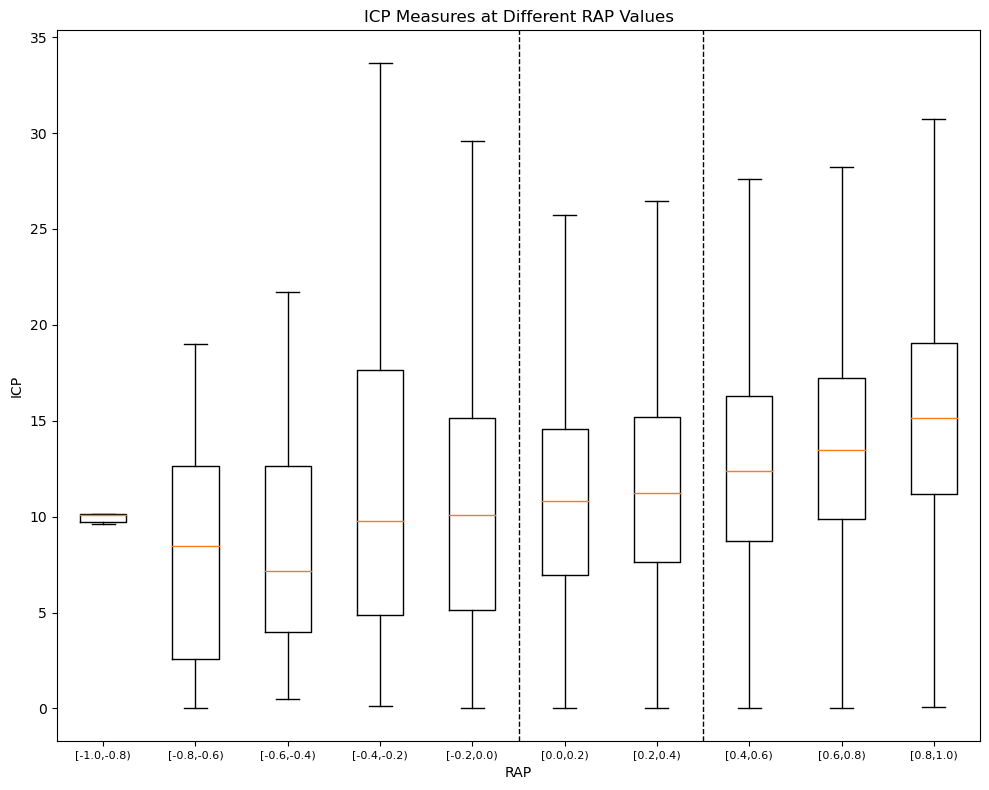

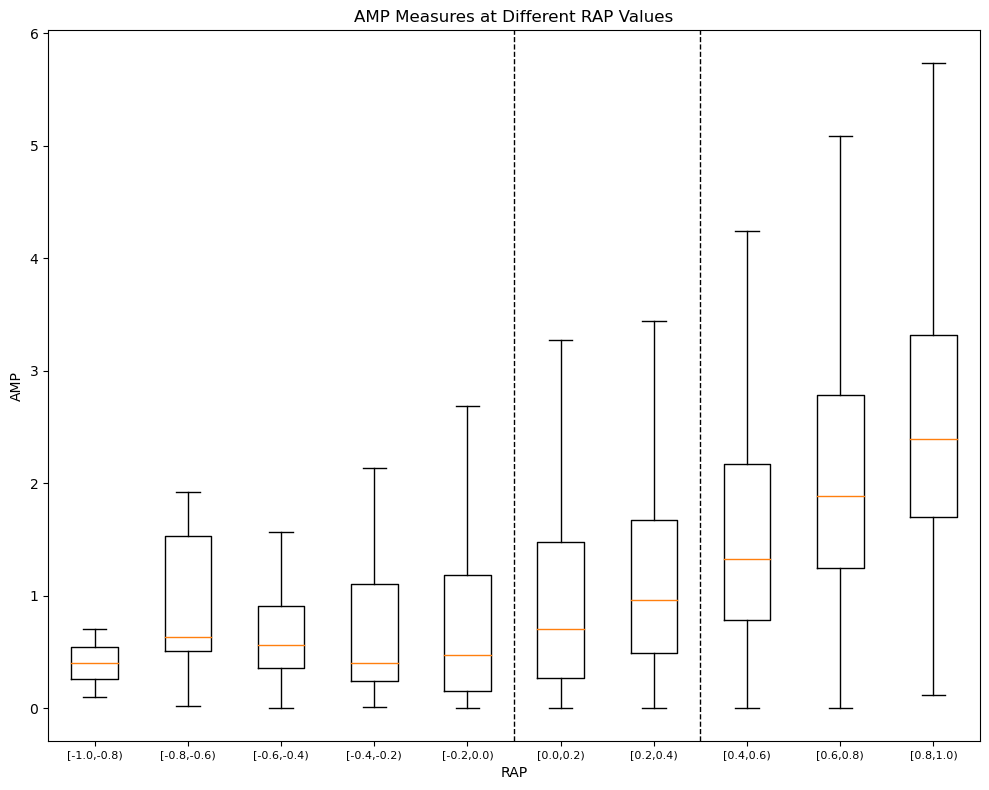

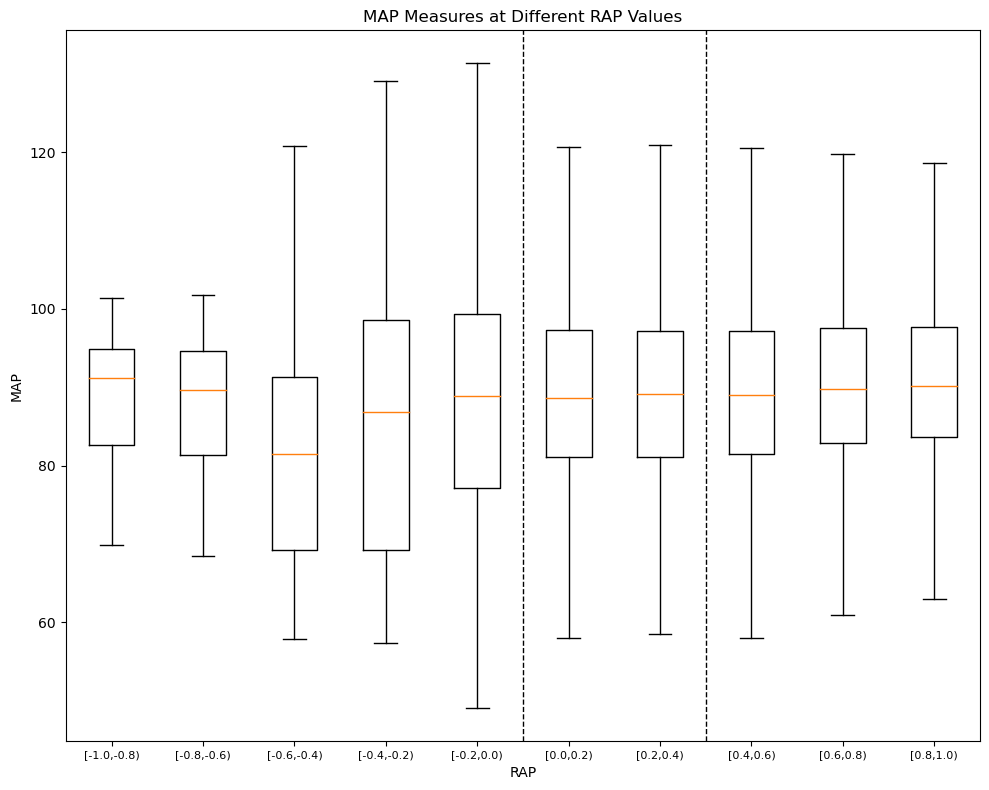

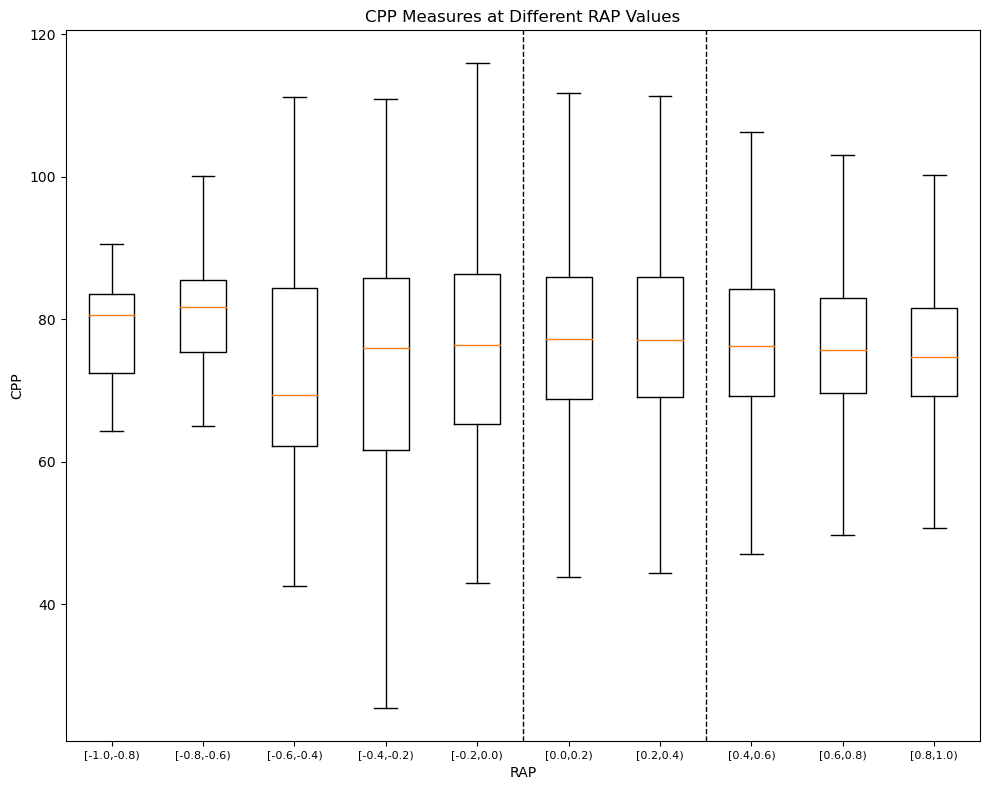

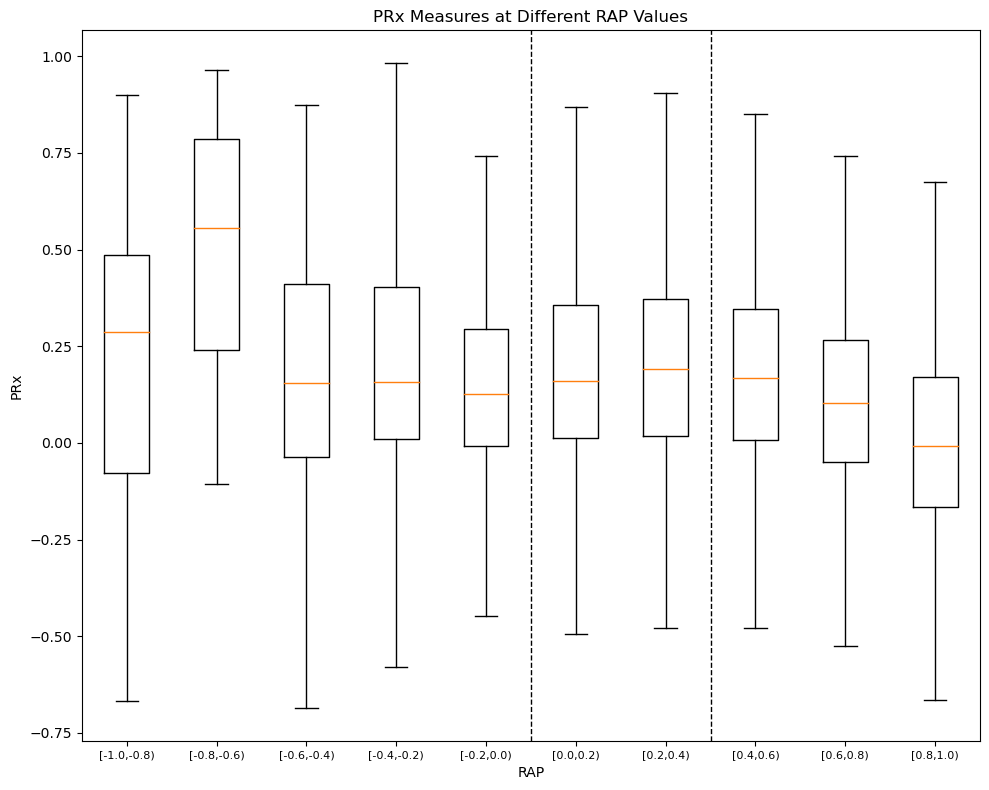

...

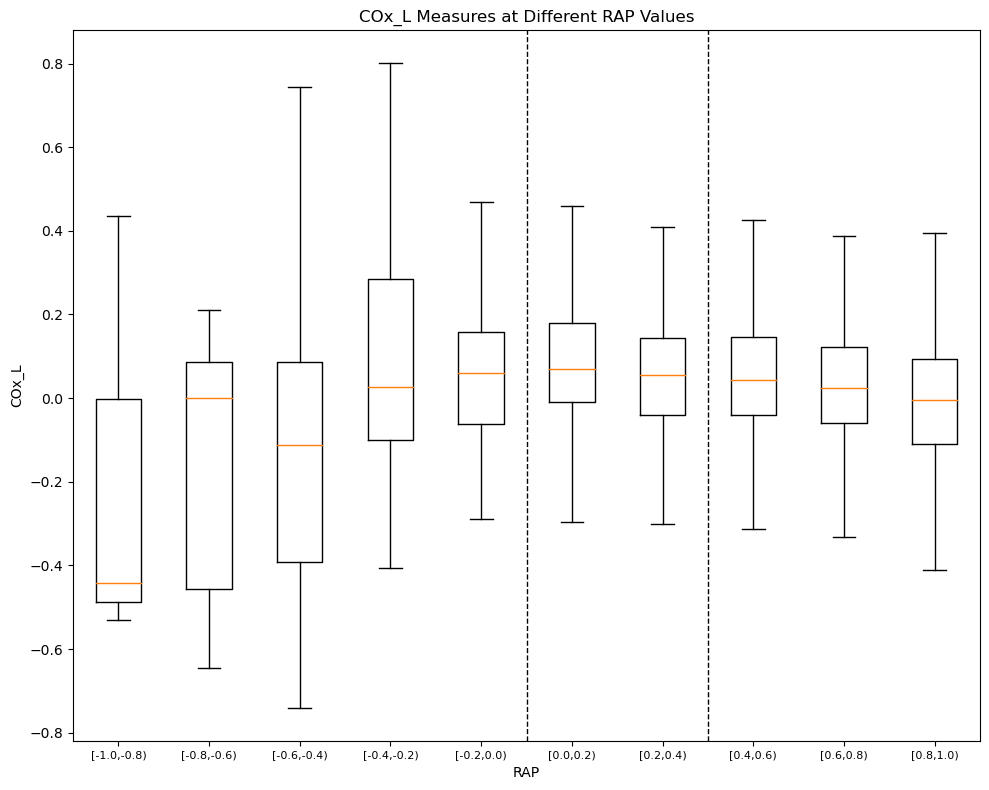

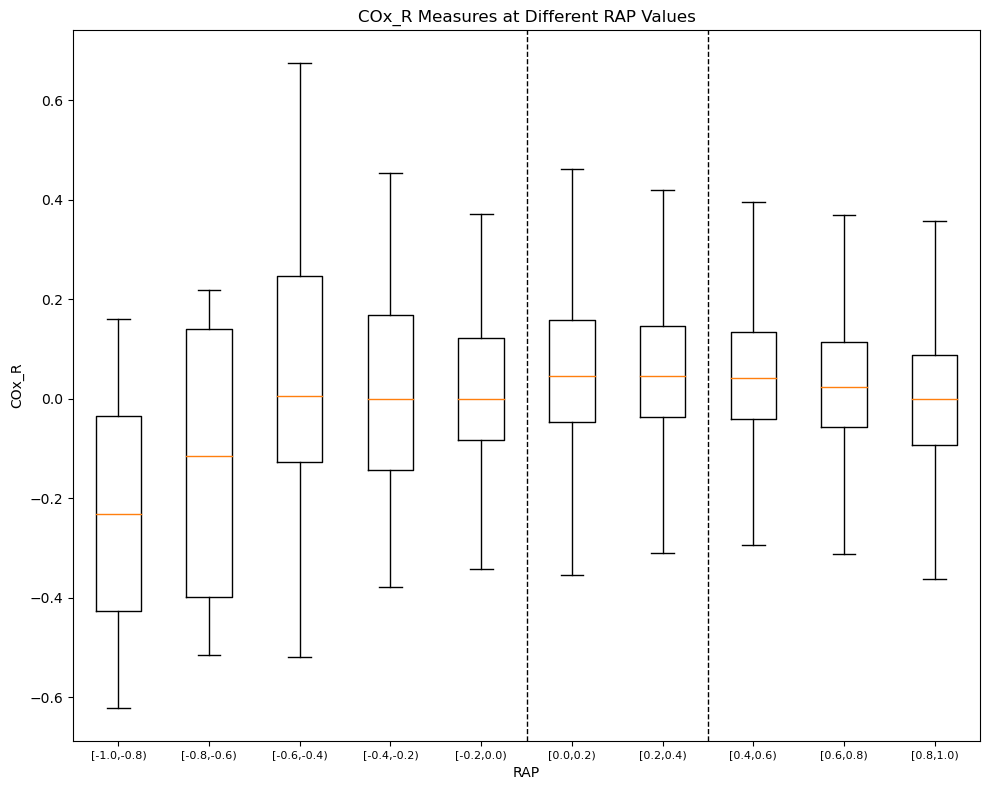

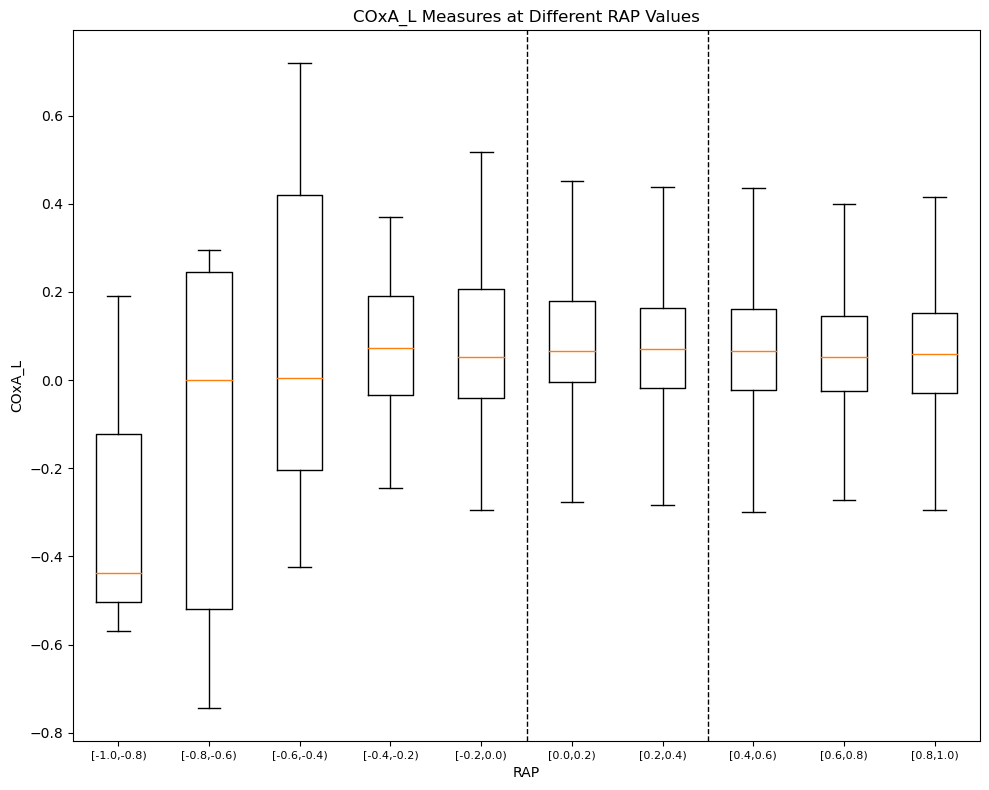

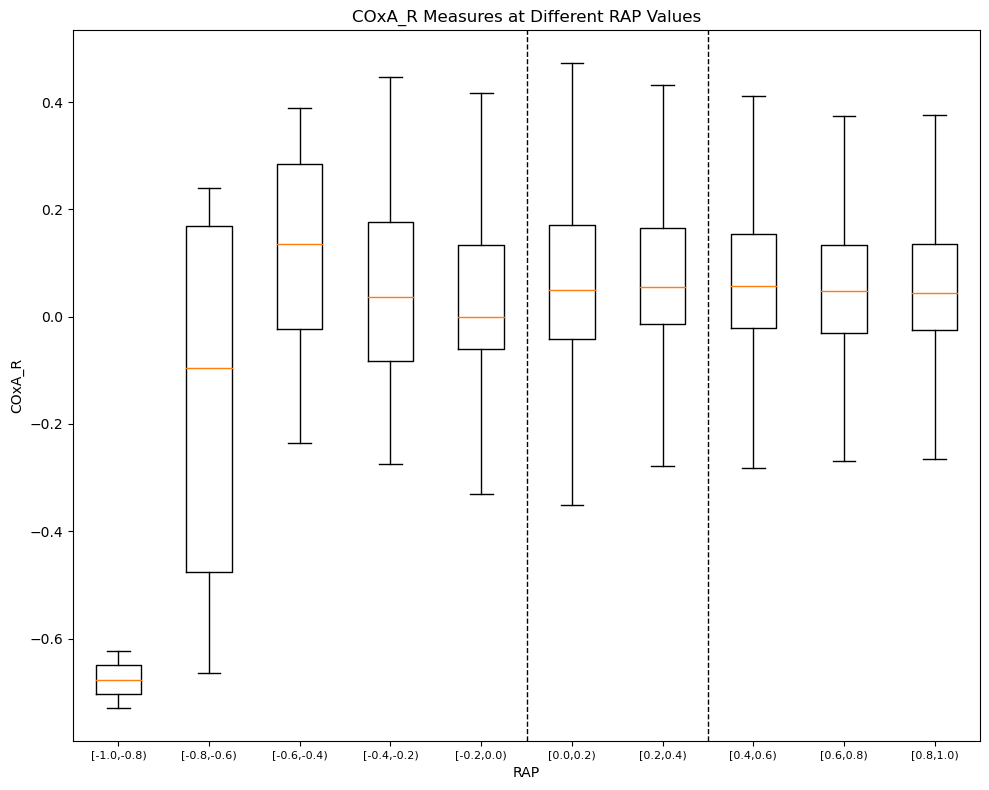

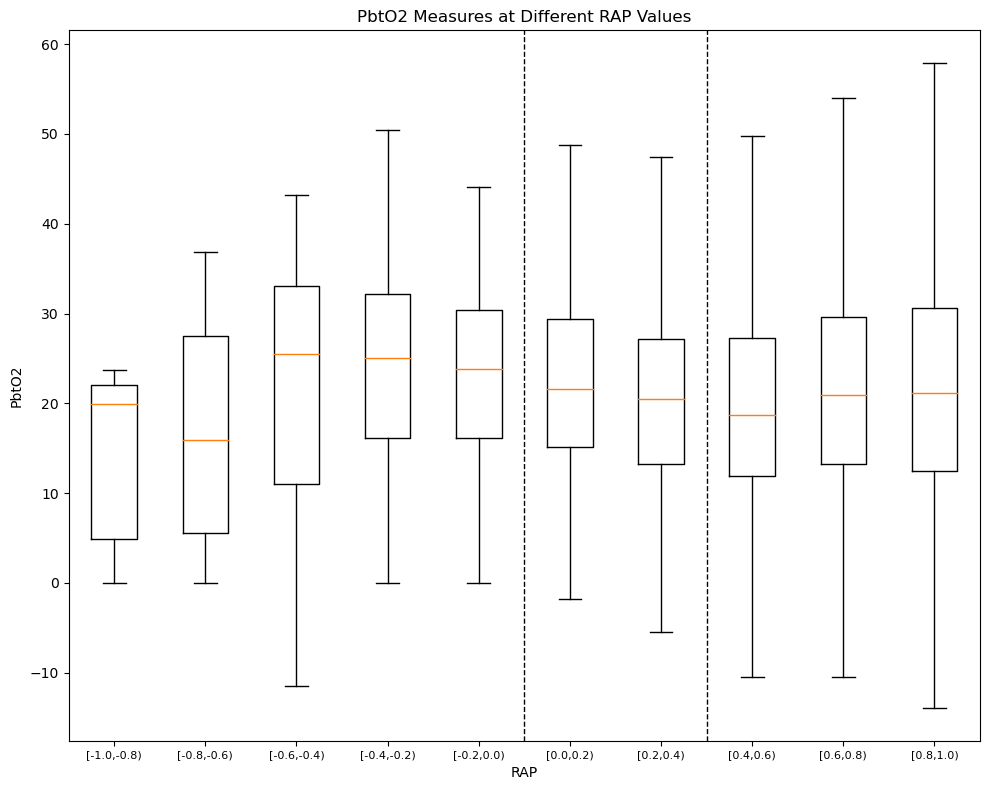

In [101]:
values = np.round(np.arange(-1, 1.1, 0.2), 1)
values = np.where(values == -0.0, 0.0, values)

columns = df_all.columns.to_list()
columns.remove('RAP')
columns.remove('DateTime')

resolution = "H"

for index, parameter in enumerate(columns):
    boxplots_with_values(df_all, parameter, values, resolution, filtered_timestamps)

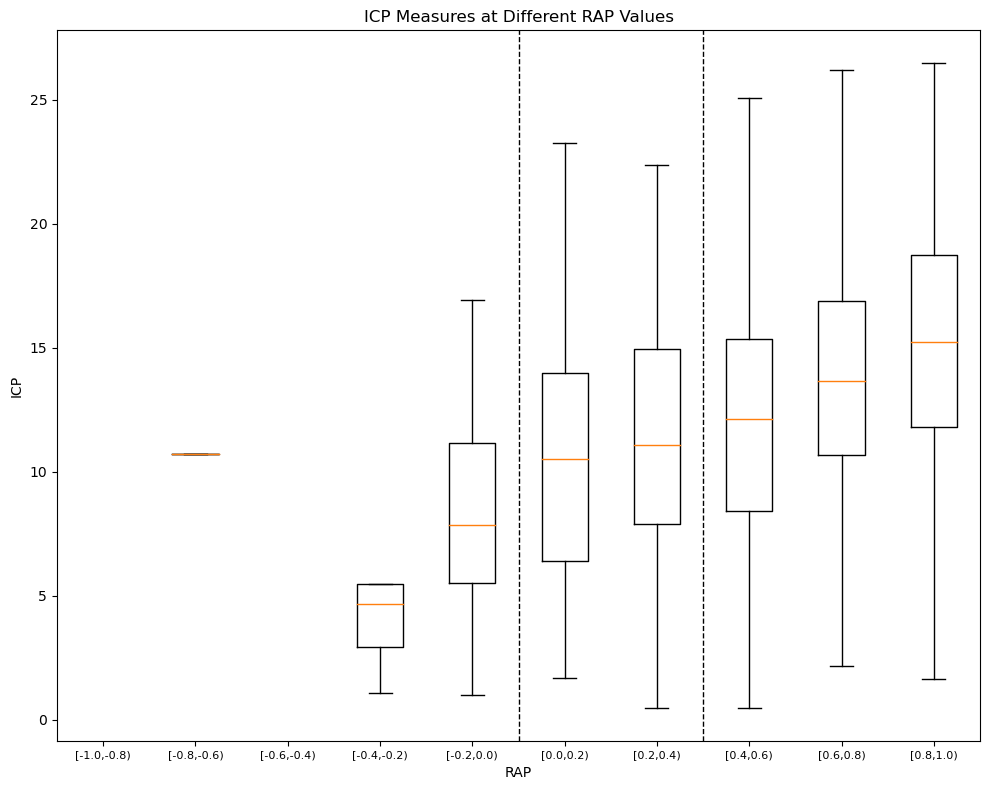

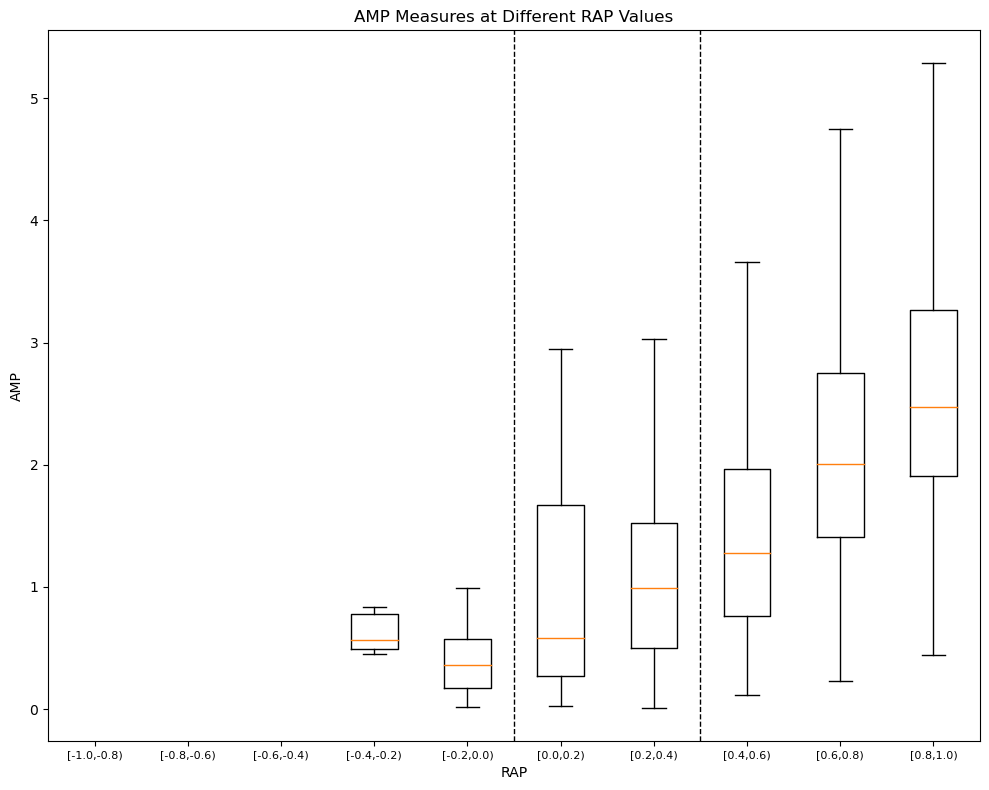

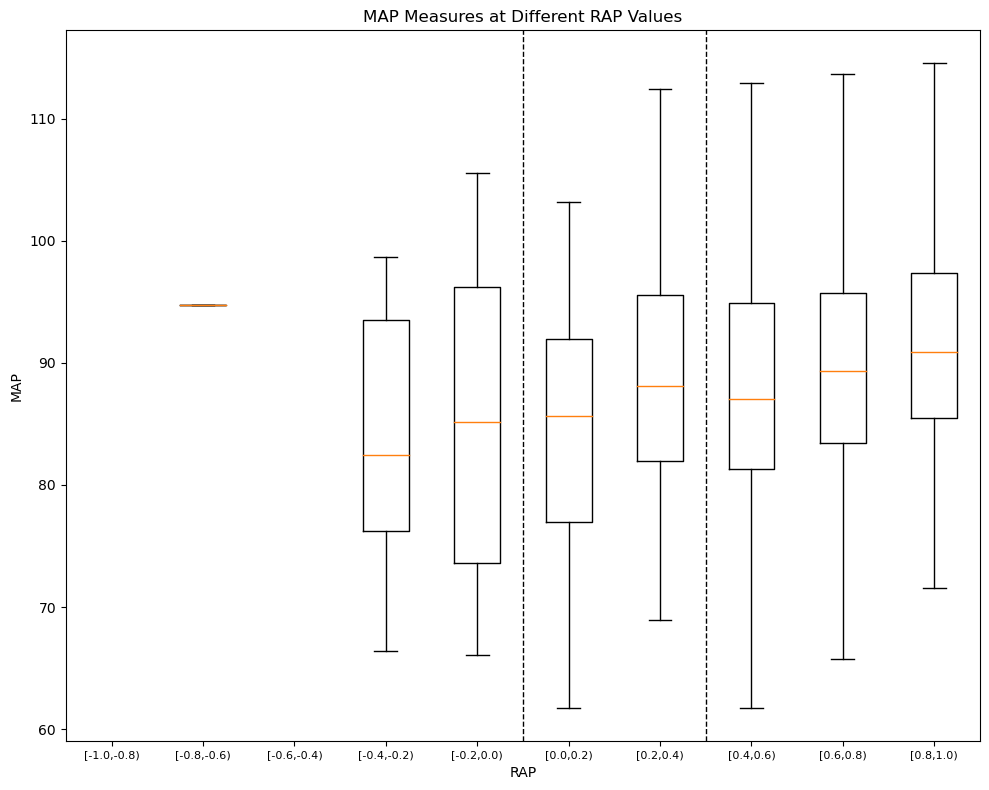

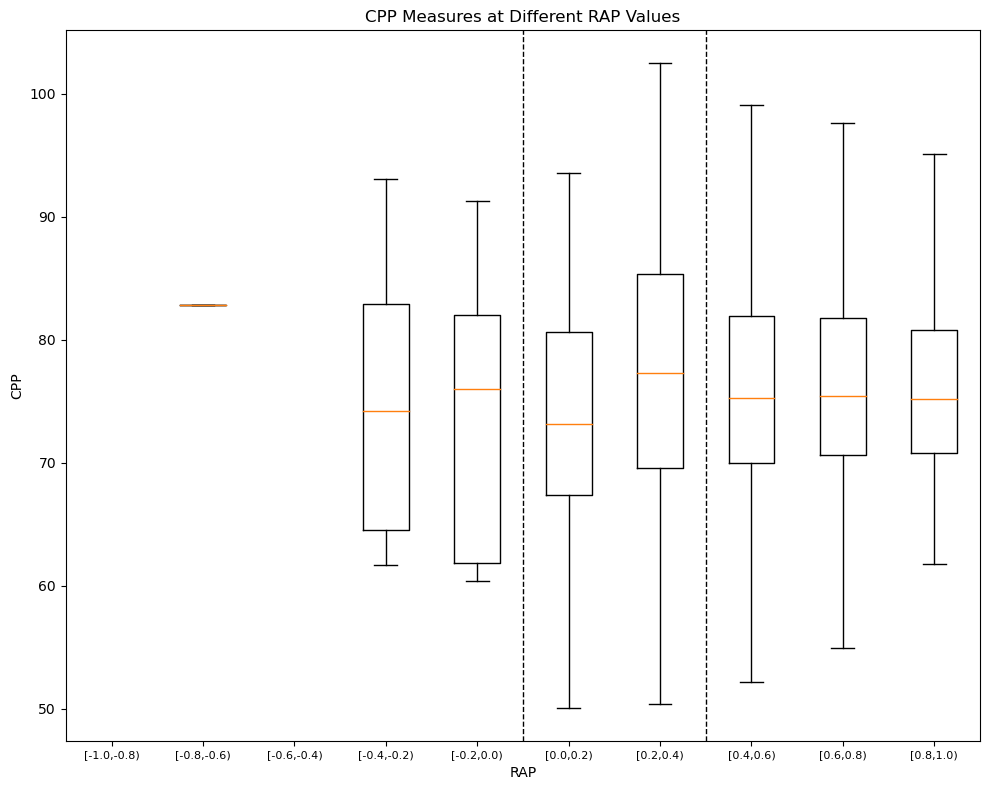

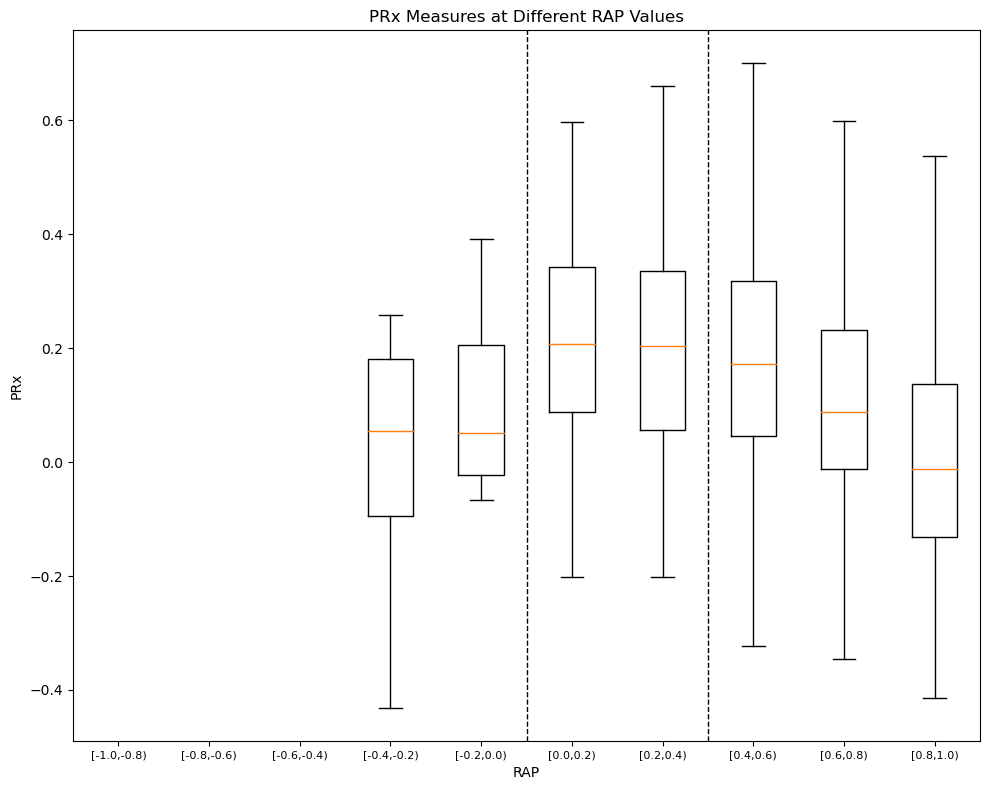

...

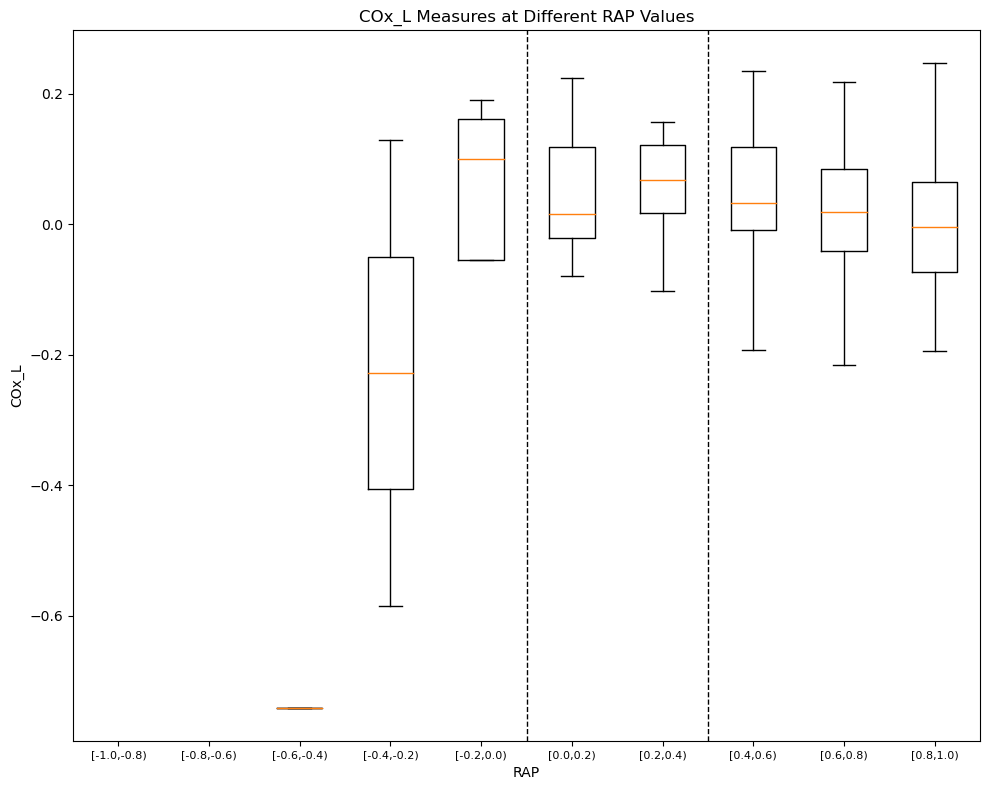

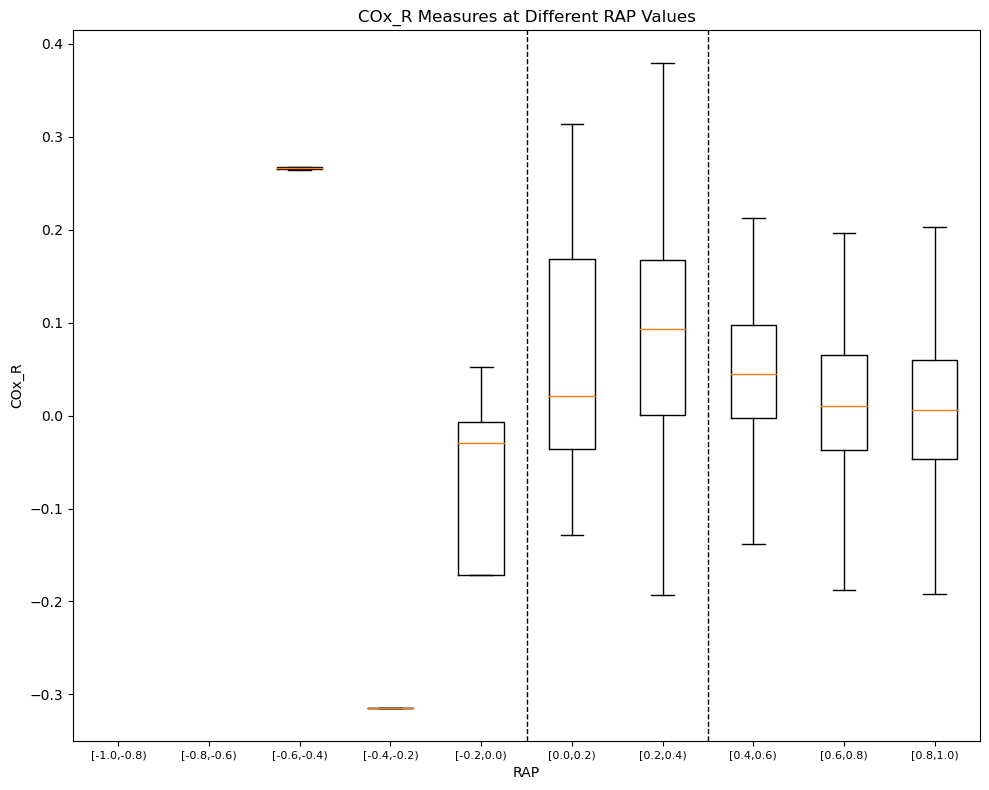

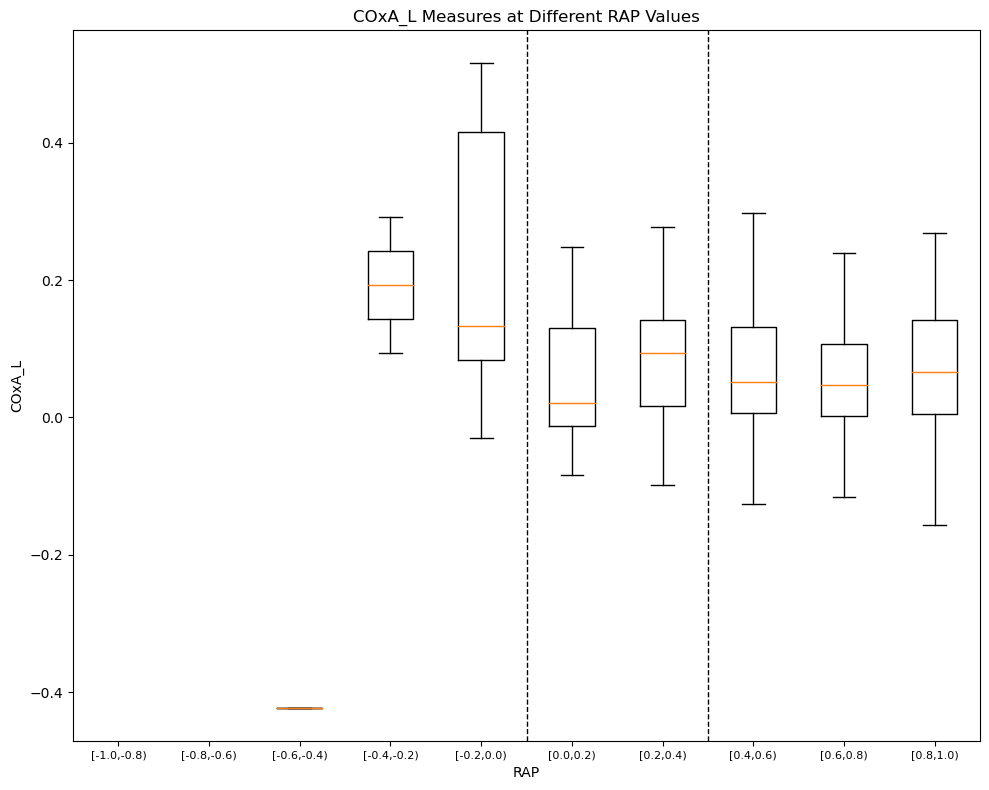

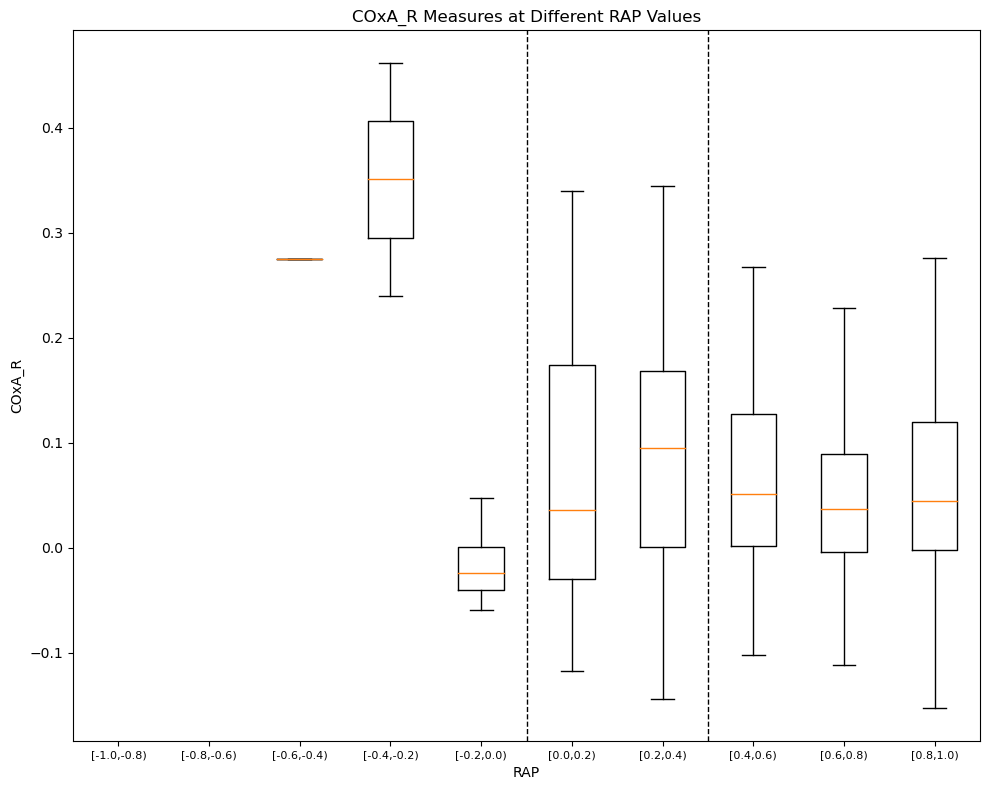

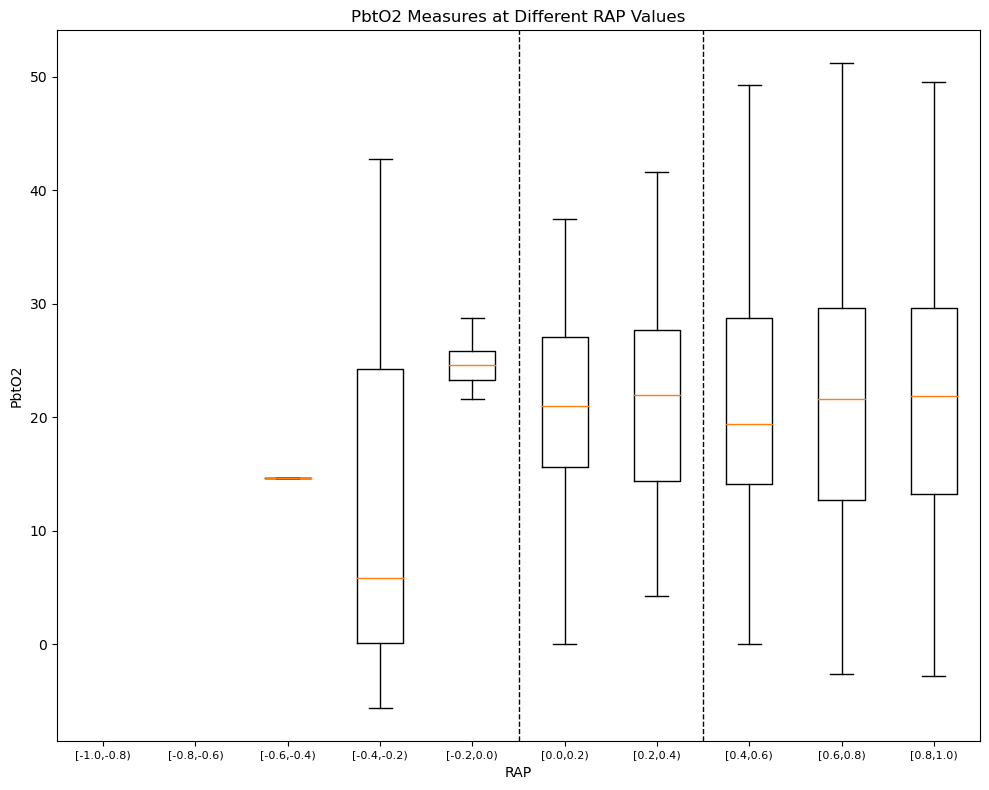

In [102]:
values = np.round(np.arange(-1, 1.1, 0.2), 1)
values = np.where(values == -0.0, 0.0, values)

columns = df_all.columns.to_list()
columns.remove('RAP')
columns.remove('DateTime')

resolution = "D"

for index, parameter in enumerate(columns):
    boxplots_with_values(df_all, parameter, values, resolution, filtered_timestamps)

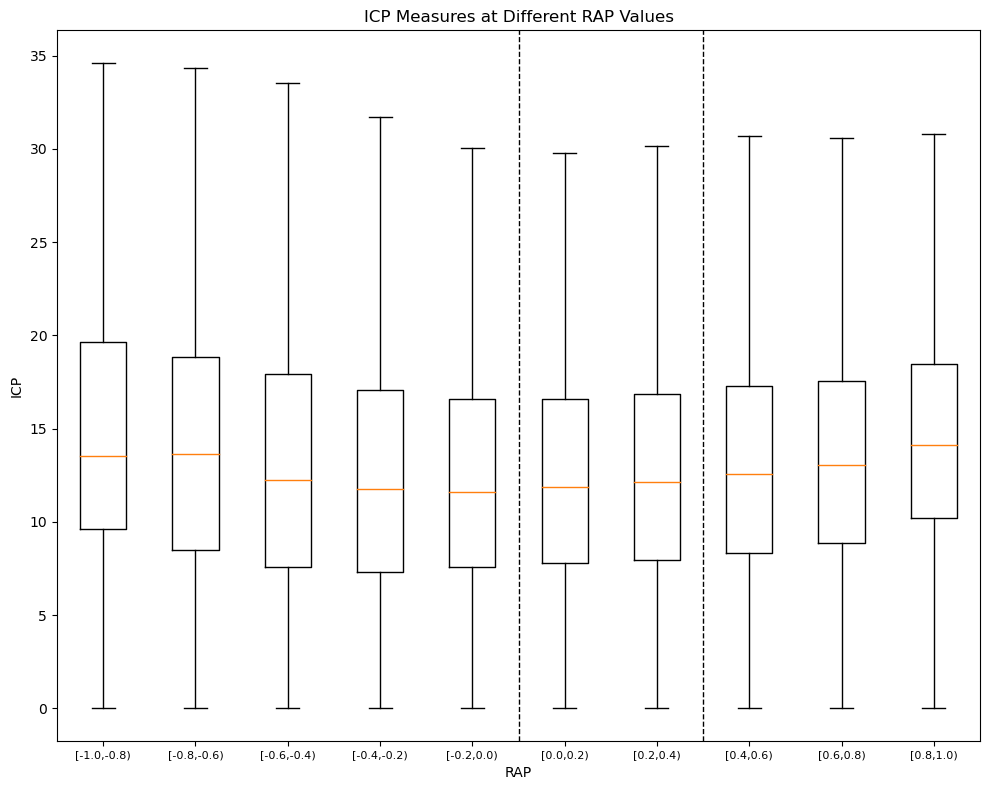

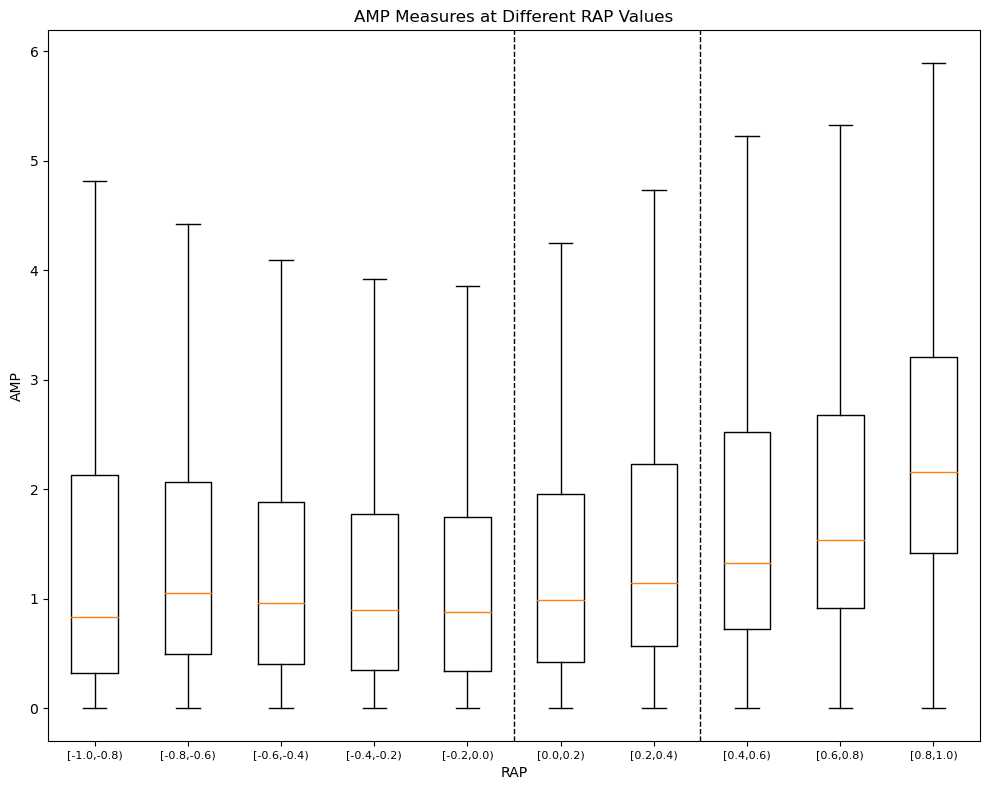

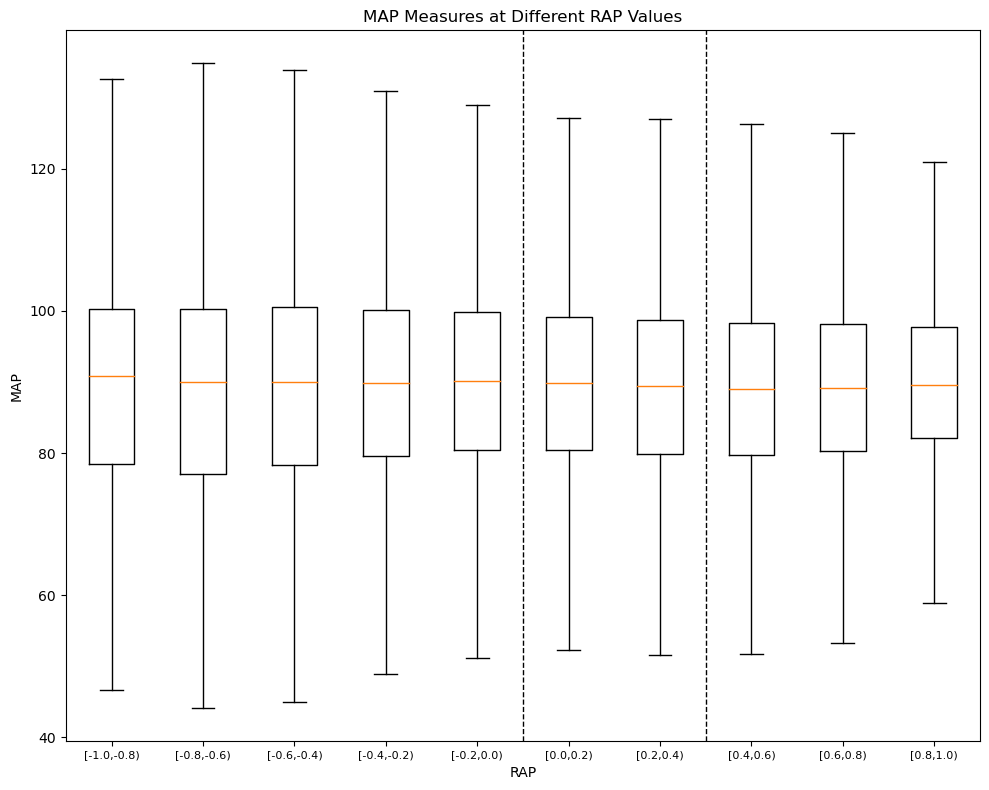

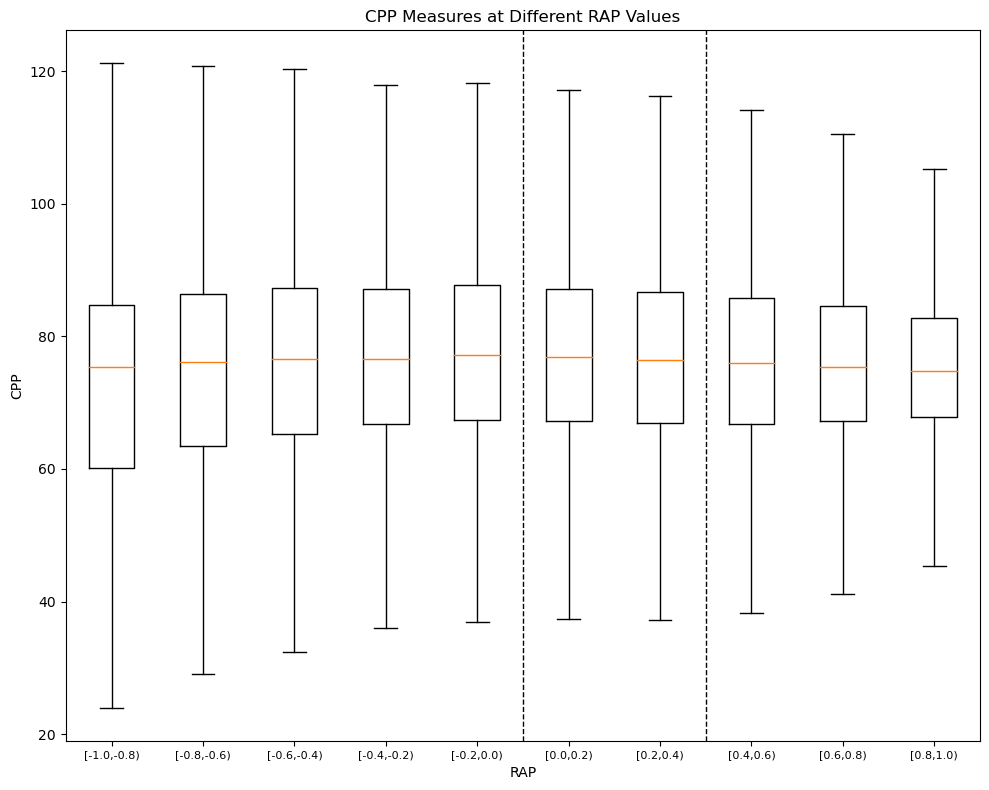

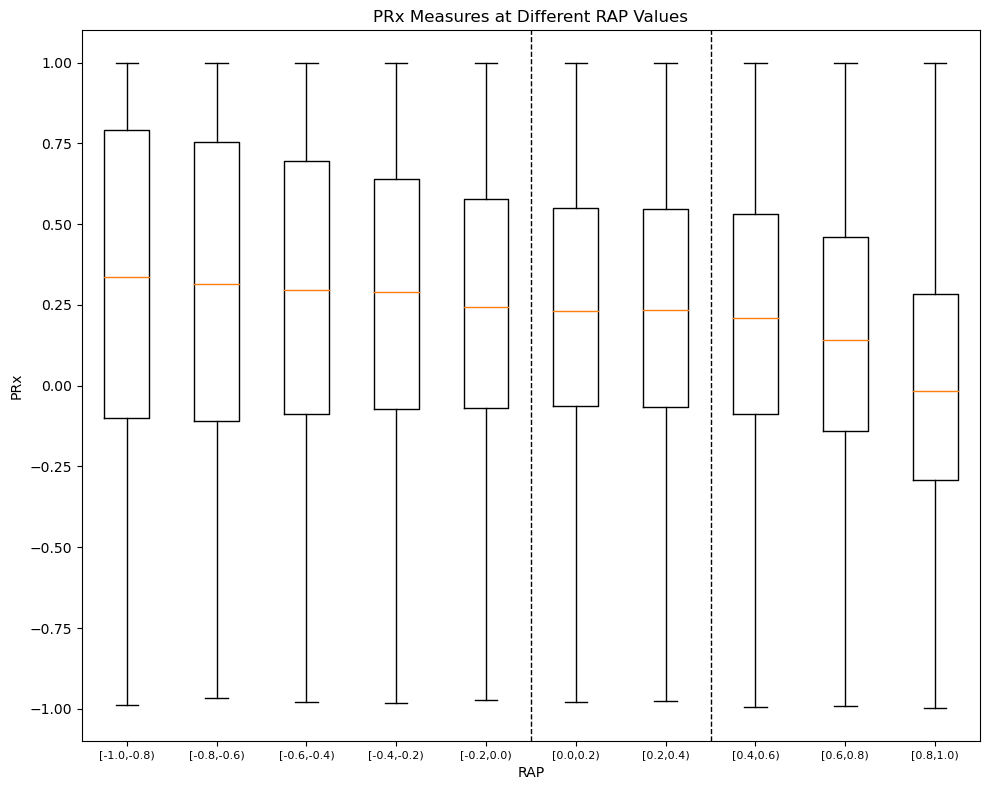

...

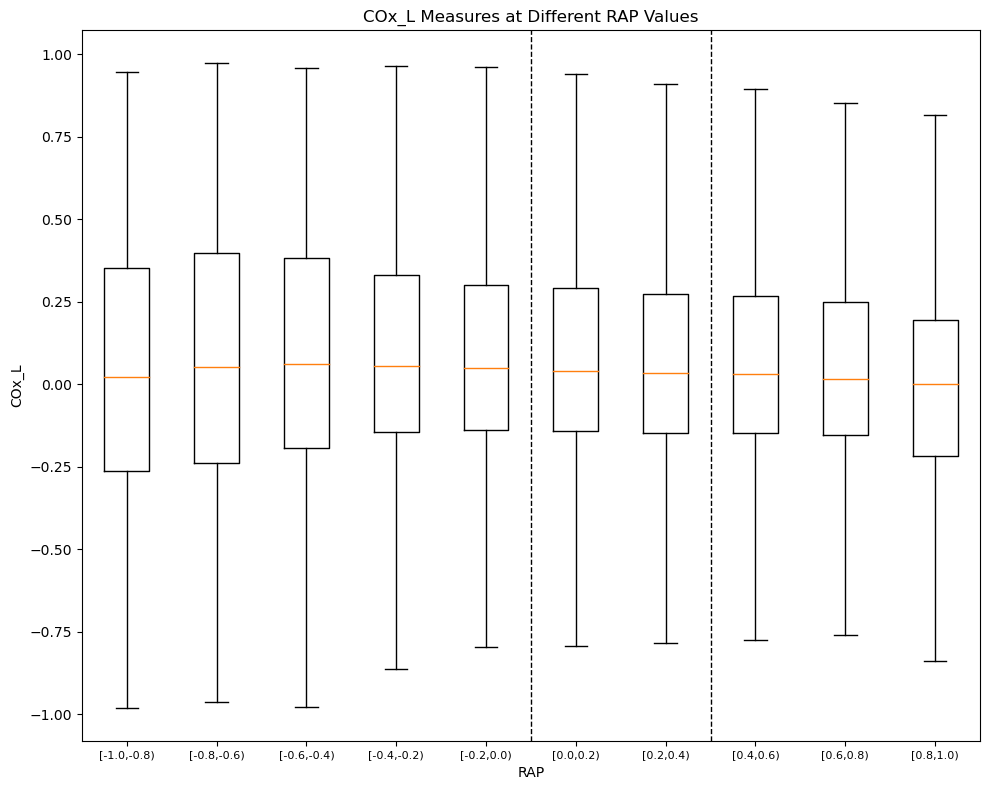

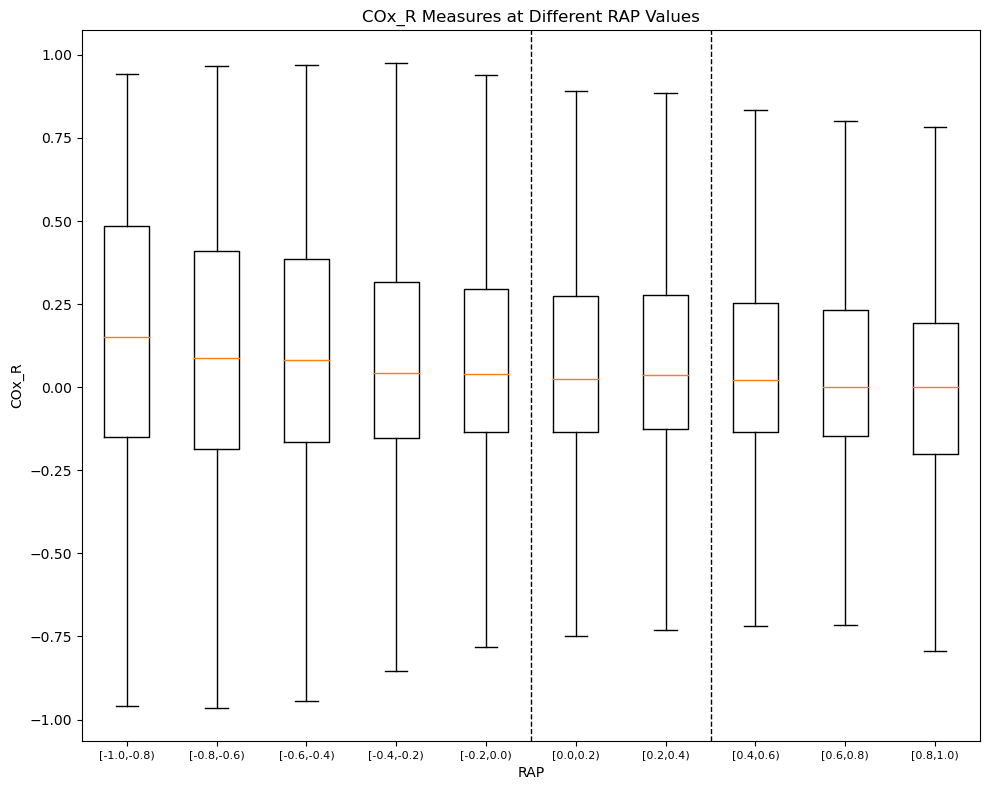

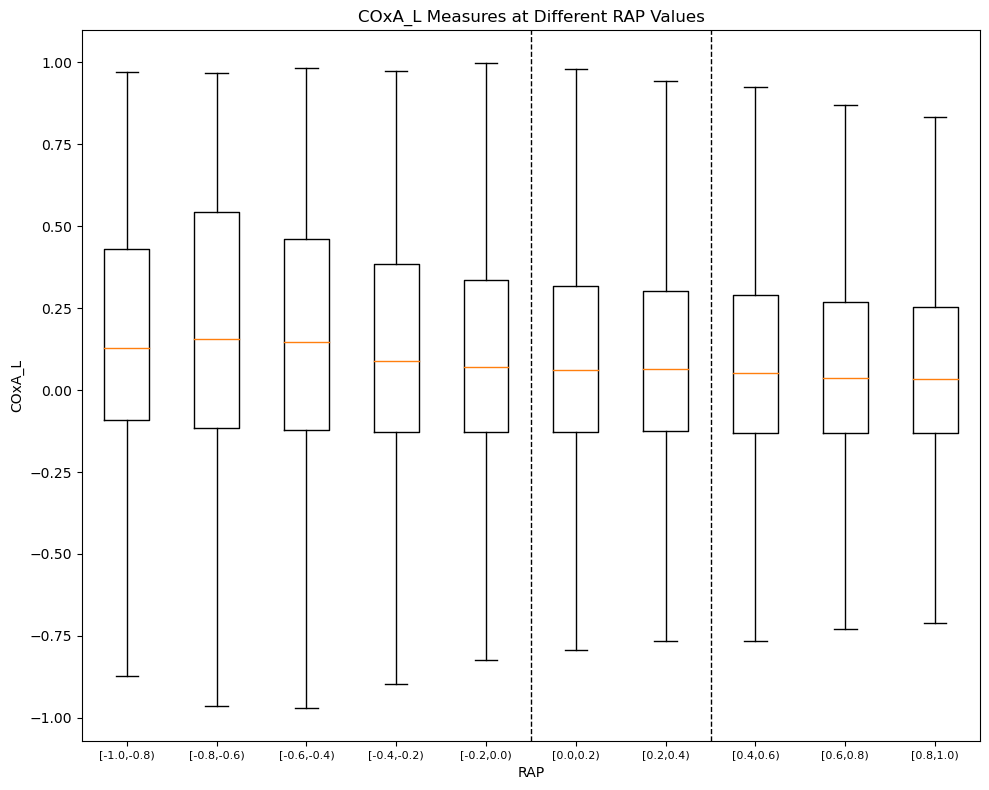

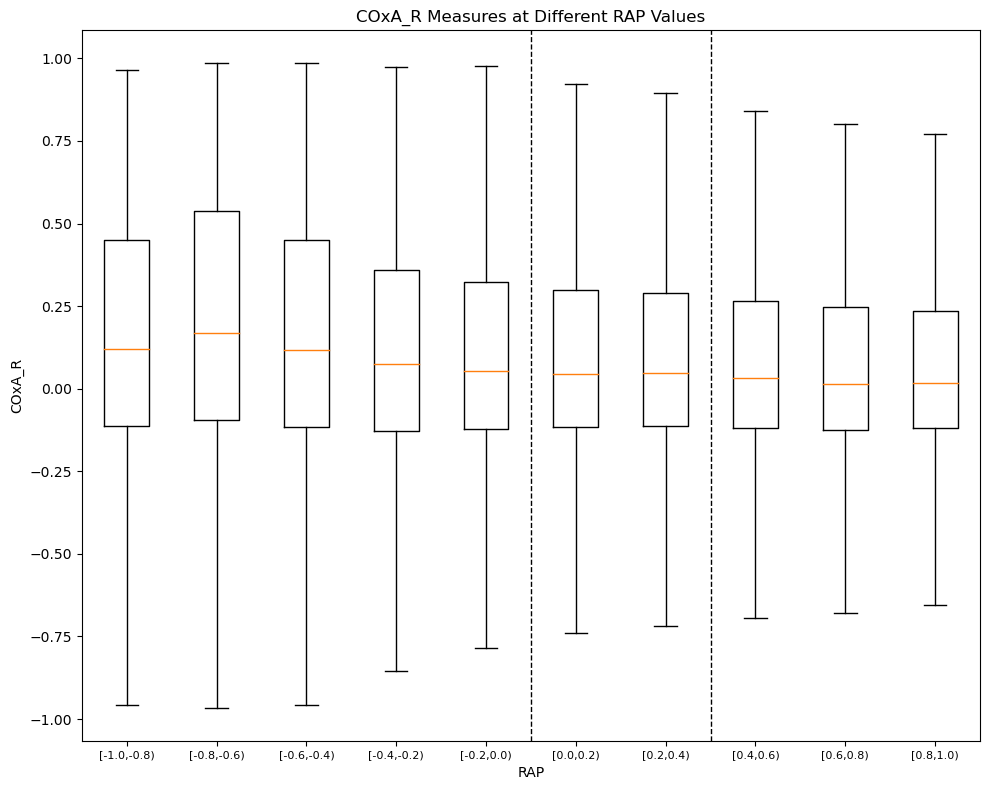

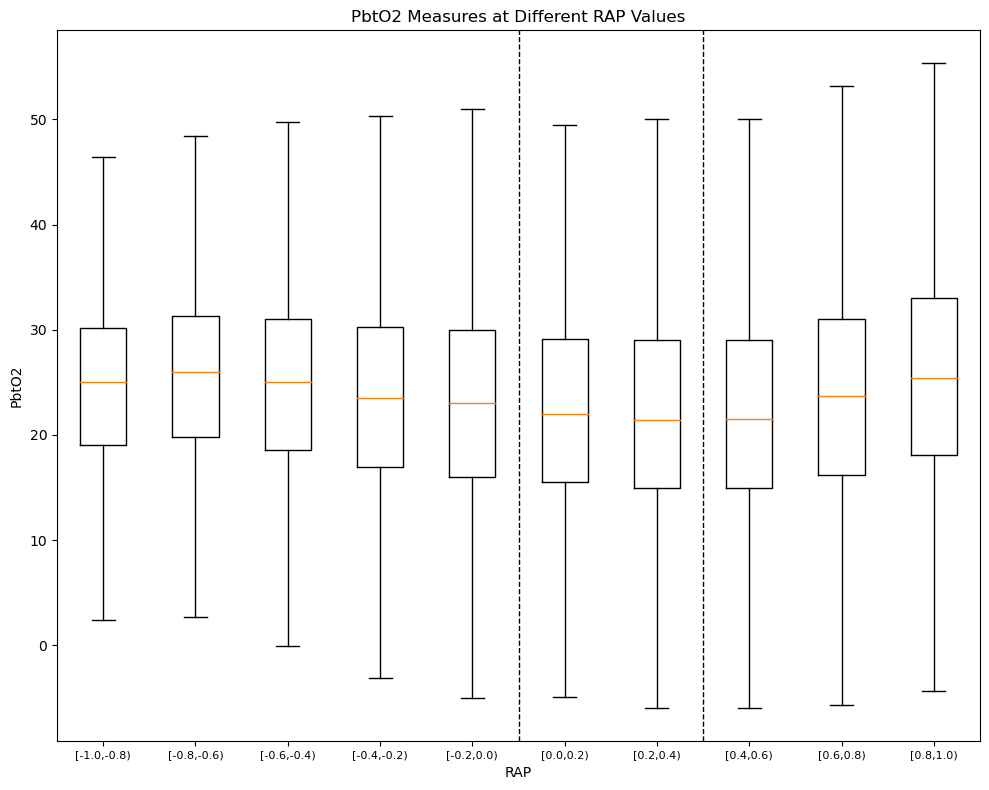

In [103]:
values = np.round(np.arange(-1, 1.1, 0.2), 1)
values = np.where(values == -0.0, 0.0, values)

columns = df_all.columns.to_list()
columns.remove('RAP')
columns.remove('DateTime')

resolution = "M"

for index, parameter in enumerate(columns):
    boxplots_with_values(df_all, parameter, values, resolution, filtered_timestamps)

## Contour Plots

In [89]:
def contour_plot_across_full_spectrum(breakpoints, dependent_param):
    
    tic = timer()
    warnings.filterwarnings('ignore')
    
    segment = df_all[['RAP', 'ICP', dependent_param]].dropna()
    
    # Extract X, Y, and Z columns
    x = segment['RAP']
    y = segment['ICP']
    z = segment[dependent_param]
    
    # Create grid data for contour plot
    grid_x, grid_y = np.meshgrid(
        np.linspace(x.min(), x.max(), 100),
        np.linspace(y.min(), y.max(), 100)
    )

    # Interpolate Z values on the grid
    grid_z = griddata((x, y), z, (grid_x, grid_y), method='linear')

    # Plot the contour
    plt.figure(figsize=(8, 6))
    contour = plt.contourf(grid_x, grid_y, grid_z, levels=20, cmap='viridis')
    plt.colorbar(contour, label=dependent_param)
    
    plt.axvline(x=breakpoints[0], color='black', linestyle='--', linewidth=2)  
    plt.axvline(x=breakpoints[1], color='black', linestyle='--', linewidth=2)
    
    title = 'Contour Plot of ' + dependent_param
    plt.title(title)
    plt.xlabel('RAP')
    plt.ylabel('ICP')

    save_image_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Plots\Contour_plots\RAP_independent"
    save_image_name = 'RAP and ' + dependent_param
    plt.savefig(os.path.join(save_image_directory, save_image_name))

    plt.show()
    
    tac = timer()
    print("Execution time:", round(tac-tic, 2), "seconds")

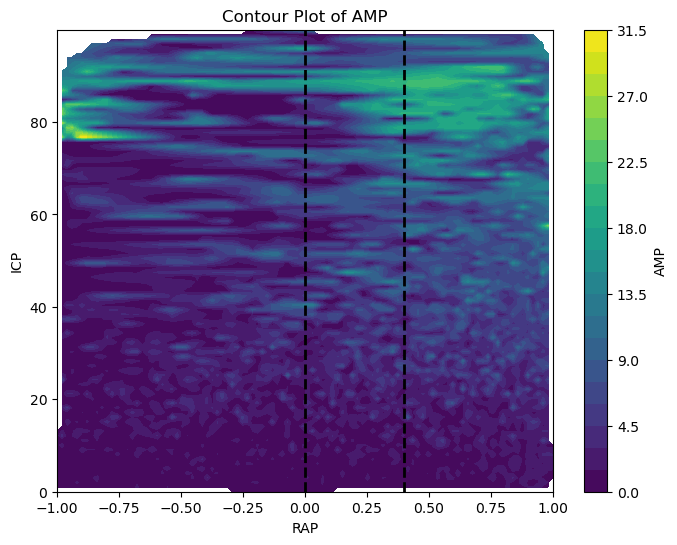

Execution time: 60.02 seconds


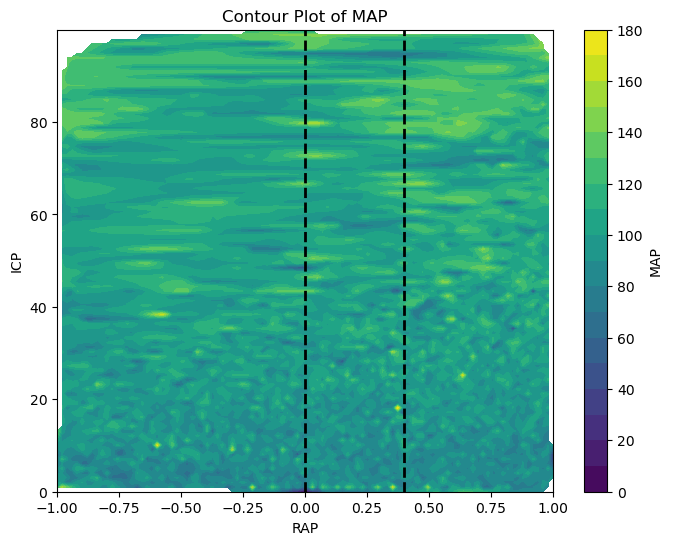

Execution time: 58.15 seconds


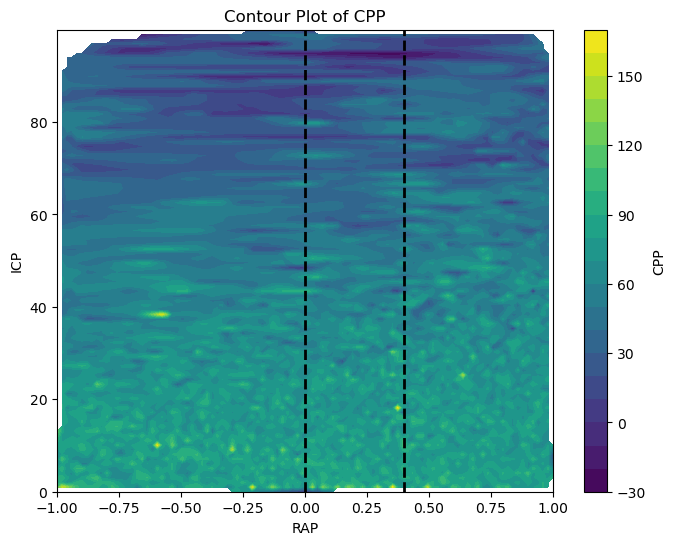

Execution time: 61.51 seconds


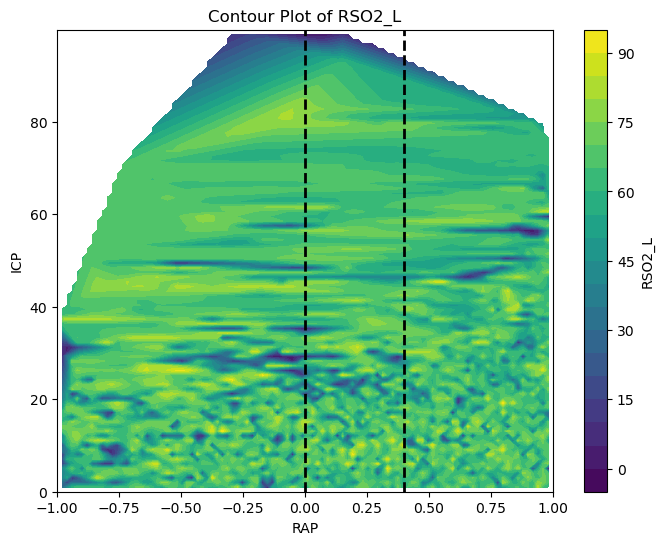

Execution time: 17.4 seconds


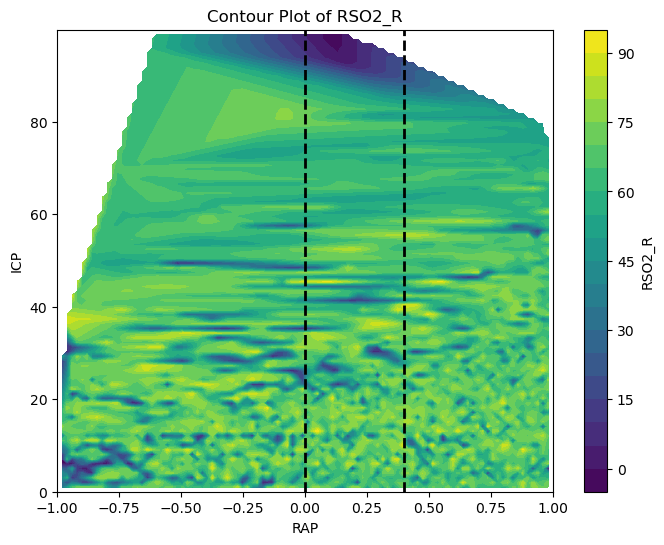

Execution time: 17.26 seconds


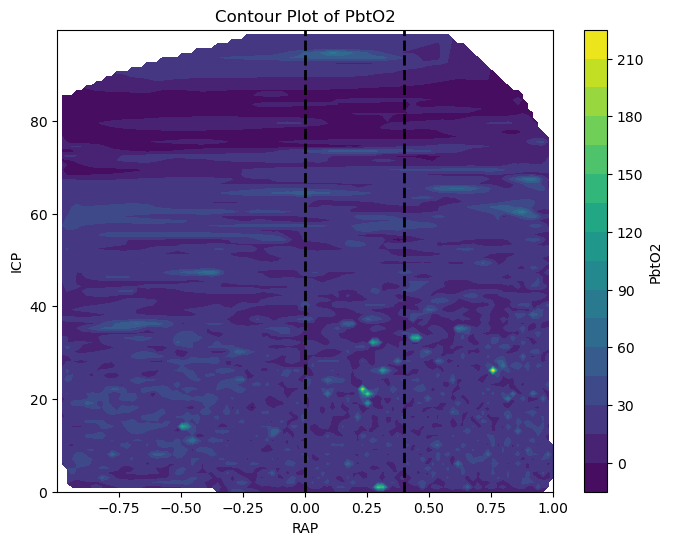

Execution time: 16.98 seconds


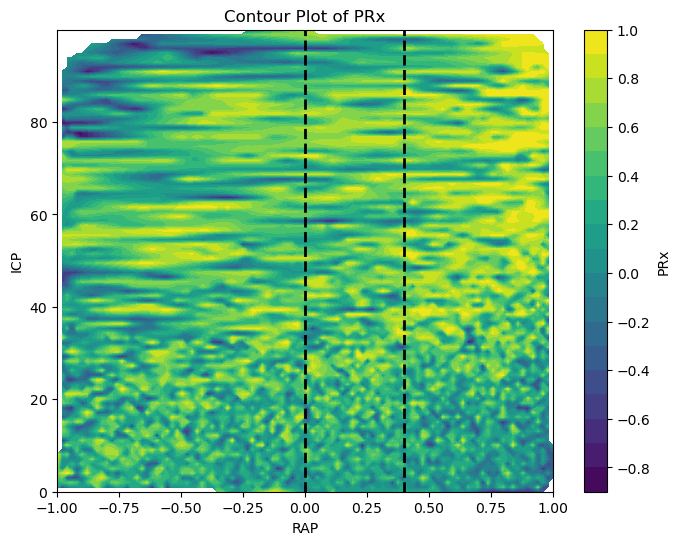

Execution time: 60.41 seconds


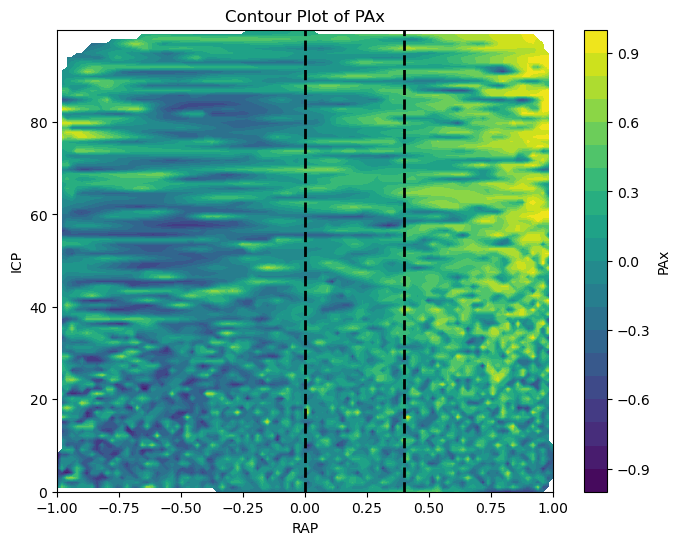

Execution time: 60.38 seconds


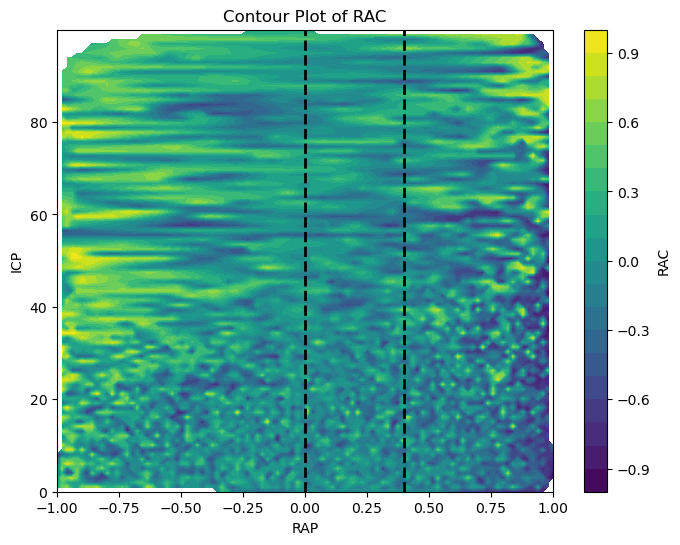

Execution time: 60.91 seconds


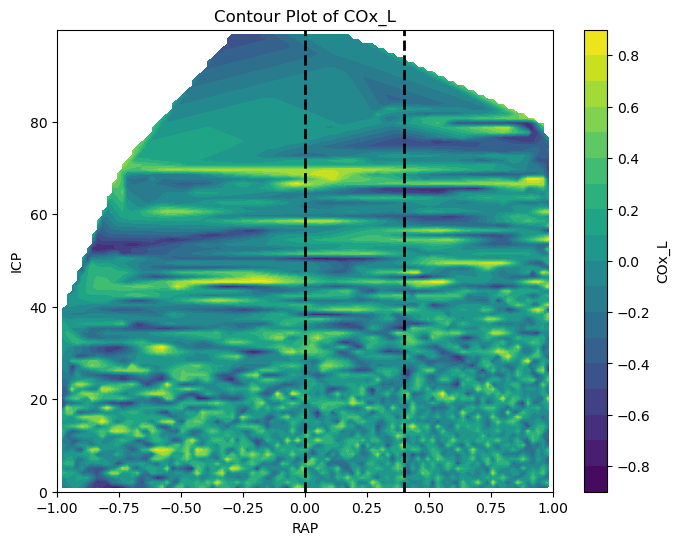

Execution time: 16.7 seconds


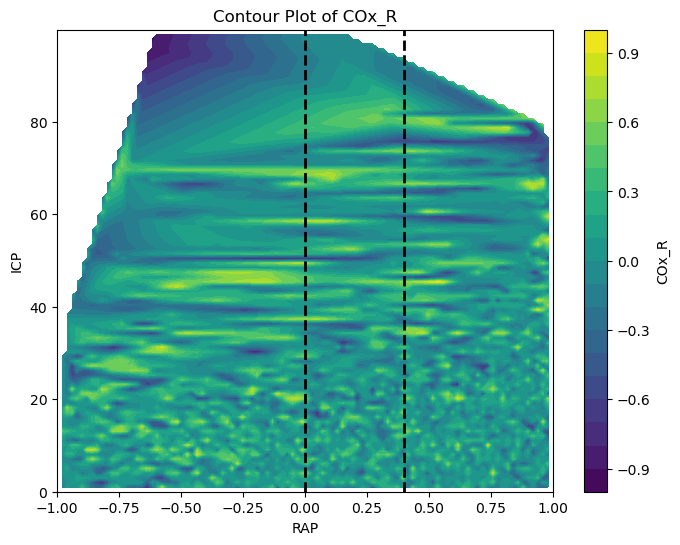

Execution time: 16.68 seconds


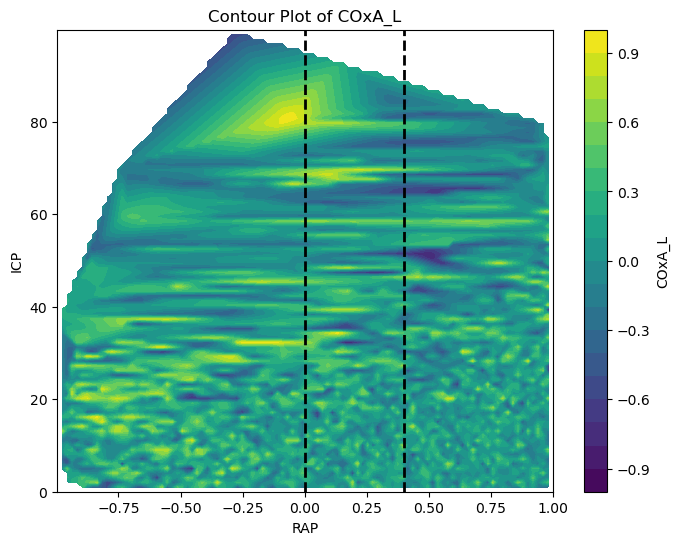

Execution time: 14.09 seconds


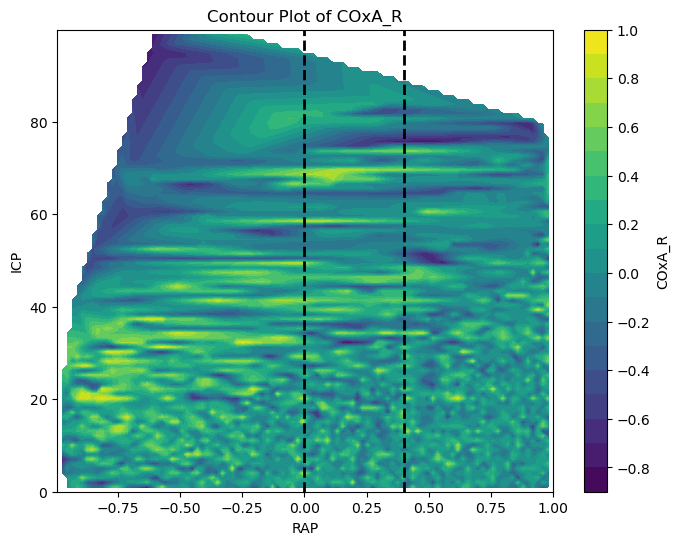

Execution time: 14.56 seconds


In [90]:
# For all the parameters

breakpoints = [0, 0.4]

for index, parameter in enumerate(df_all.columns):
    if index == 0 or index == 1:           # excluding RAP and ICP 
        pass
    else:
        contour_plot_across_full_spectrum(breakpoints, parameter)

# Median Physiology Measures

In [166]:
# Splitting data into three segments

breakpoints = [0, 0.4]

segment1 = df_all[df_all['RAP'] < breakpoints[0]]
segment2 = df_all[(df_all['RAP'] >= breakpoints[0]) & (df_all['RAP'] <= breakpoints[1])]
segment3 = df_all[df_all['RAP'] > breakpoints[1]]

segments = [segment1, segment2, segment3]

labels = ['RAP < 0', '0 ≤ RAP ≤ 0.4', 'RAP > 0.4']

In [15]:
# Median value of each physiology measure
# Defining the dataframe
num_rows = len(labels)
columns = df_all.columns.to_list()
columns.insert(0, 'Labels')
columns.remove('DateTime')

df_median = pd.DataFrame(index=range(num_rows), columns=columns)
abs(max_lags).quantile(0.75)
# Insert median values
for index, segment in enumerate(segments):
    df_median.loc[index] = segment.median().round(3)

df_median['Labels'] = labels
df_median = df_median.set_index("Labels")
df_median.T

Labels,RAP < 0,0 ≤ RAP ≤ 0.4,RAP > 0.4
RAP,-0.234,0.239,0.873
ICP,12.03,12.06,13.71
AMP,0.913,1.081,1.93
MAP,90.06,89.66,89.46
CPP,76.69,76.63,75.07
PRx,0.271,0.233,0.047
PAx,-0.147,-0.016,-0.03
RAC,-0.06,-0.103,-0.485
RSO2_L,62.23,63.635,65.0
RSO2_R,64.5,65.99,67.79


In [173]:
# Median with IQR
def median_iqr(df_parameter):
    median = round(df_parameter.median(), 3)
    q3 = round(df_parameter.quantile(0.75), 3)
    q1 = round(df_parameter.quantile(0.25), 3)
    return str(median) + '(' + str(q1) + '\u2014' + str(q3) + ')'

In [174]:
# Median with IQR
parameter_list = ['DateTime', 'RAP', 'ICP', 'AMP', 'MAP', 'CPP', 'PRx', 'PAx', 'RAC', \
                          'RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R', 'PbtO2']
parameter_list_modified = ['RAP', 'ICP', 'AMP', 'MAP', 'CPP', 'PRx', 'PAx', 'RAC', \
                          'RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R', 'PbtO2']
NIRS_measures_list = ['RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R']

df_median = pd.DataFrame(index=labels, columns=parameter_list_modified)

for segment_no, segment in enumerate(segments):
    print("Segment in progress: ", labels[segment_no])
    for parameter_index, parameter in enumerate(parameter_list_modified):
        #print("Parameter in progress: ", parameter)
        if parameter in NIRS_measures_list:
            segment_modified = cleaning_NIRS_measures_parameters_v2(segment, parameter)
        else:
            segment_modified = segment
        
        df_parameter = segment_modified[parameter]
        df_median.at[labels[segment_no], parameter] = median_iqr(df_parameter)
    
    print("\n")
    
df_median.T

Segment in progress:  RAP < 0


Segment in progress:  0 ≤ RAP ≤ 0.4


Segment in progress:  RAP > 0.4




,RAP < 0,0 ≤ RAP ≤ 0.4,RAP > 0.4
RAP,-0.234(-0.458—-0.1),0.239(0.134—0.326),0.873(0.722—0.949)
ICP,12.03(7.7—17.3),12.06(7.891—16.75),13.71(9.697—18.14)
AMP,0.913(0.362—1.822),1.081(0.506—2.119),1.93(1.174—3.052)
MAP,90.06(79.64—100.1),89.66(80.11—98.9),89.46(81.44—97.85)
CPP,76.69(66.38—87.2),76.63(67.04—86.9),75.07(67.58—83.53)
PRx,0.271(-0.078—0.638),0.233(-0.064—0.548),0.047(-0.238—0.36)
PAx,-0.147(-0.423—0.107),-0.015(-0.25—0.2),-0.03(-0.314—0.272)
RAC,-0.06(-0.364—0.214),-0.103(-0.336—0.126),-0.485(-0.739—-0.131)
RSO2_L,69.29(62.67—76.485),69.03(62.54—76.39),68.02(62.08—74.94)
RSO2_R,71.01(64.325—78.32),71.96(64.53—78.16),71.29(64.57—77.71)


In [51]:
# Median value of each physiology measure
# Defining the dataframe
columns = df_all.columns.to_list()
columns.remove('DateTime')
df_median = pd.DataFrame(index=labels, columns=columns)

NIRS_measures_list = ['RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R']

# Insert median values
for segment_no, segment in enumerate(segments):
    for column_no, parameter in enumerate(columns):
        if parameter in NIRS_measures_list:
            df_pair = segment[['DateTime', parameter]]
            df_pair = df_pair[~df_pair['DateTime'].isin(filtered_timestamps)]
            df_pair = df_pair.loc[df_pair[parameter] != 0]
            df_median.at[labels[segment_no], parameter] = round(df_pair[parameter].median(), 3)
        else:
            df_median.at[labels[segment_no], parameter] = round(segment[parameter].median(), 3) 

df_median.T

,RAP < 0,0 ≤ RAP ≤ 0.4,RAP > 0.4
RAP,-0.234,0.239,0.873
ICP,12.03,12.06,13.71
AMP,0.913,1.081,1.93
MAP,90.06,89.66,89.46
CPP,76.69,76.63,75.07
PRx,0.271,0.233,0.047
PAx,-0.147,-0.015,-0.03
RAC,-0.06,-0.103,-0.485
RSO2_L,69.29,69.03,68.02
RSO2_R,71.01,71.96,71.29


## Jonckheere-Terpstra testing

In [175]:
save_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Data\Segment_csv\RAP_independent"

for index, segment in enumerate(segments):
    file_name = "segment" + str(index+1) + ".csv"
    segment.to_csv(os.path.join(save_directory, file_name), index=False)

In [95]:
# The rest is conducted in R

## Kruskal-Wallis testing

In [146]:
def read_personalized_data(file, parameter_list, resolution):
    
    df_individual= pd.read_csv(os.path.join(csv_file_directory, file))
    df_individual_cleaned = df_individual.reindex(columns = parameter_list)
    #df_individual_cleaned = df_individual_cleaned.dropna(axis=1, how='all')
    filter_condition = (df_individual_cleaned['ICP'] > 100) | (df_individual_cleaned['ICP'] < 0) | \
                           (df_individual_cleaned['MAP'] > 200) | (df_individual_cleaned['MAP'] < 0) | \
                           (df_individual_cleaned['AMP'] > 40)
    df_individual_cleaned = df_individual_cleaned[~filter_condition]
    
 # Converting resolution of the data if necessary
    if resolution == 'M':
        pass
    else:   
        df_individual_cleaned = convert_parameter_resolution(df_individual_cleaned, resolution)
        
    return df_individual_cleaned

In [150]:
def median_from_each_patient():
    
    parameter_list = ['DateTime', 'RAP', 'ICP', 'AMP', 'MAP', 'CPP', 'PRx', 'PAx', 'RAC', \
                          'RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R', 'PbtO2']
    parameter_list_modified = ['RAP', 'ICP', 'AMP', 'MAP', 'CPP', 'PRx', 'PAx', 'RAC', \
                              'RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R', 'PbtO2']
    NIRS_measures_list = ['RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R']

    
    df_all_median = pd.DataFrame()
    resolution = 'M'
    files = os.listdir(csv_file_directory)

    for file in files:
        df_median = pd.DataFrame(index=[0], columns=parameter_list)
        df_individual_cleaned = read_personalized_data(file, parameter_list, resolution)
        for parameter_index, parameter in enumerate(parameter_list):
            if parameter in NIRS_measures_list:
                df_individual_cleaned_modified = cleaning_NIRS_measures_parameters_v2(df_individual_cleaned, parameter)
            else:
                df_individual_cleaned_modified = df_individual_cleaned

            df_median.at[0, parameter] = df_individual_cleaned_modified[parameter].median()

        df_all_median = pd.concat([df_all_median, df_median], axis=0, ignore_index=True)
        
    return df_all_median

In [151]:
df_all_median = median_from_each_patient()

In [157]:
# Splitting data into three segments

breakpoints = [0, 0.4]

segment1 = df_all_median[df_all_median['RAP'] < breakpoints[0]]
segment2 = df_all_median[(df_all_median['RAP'] >= breakpoints[0]) & (df_all_median['RAP'] <= breakpoints[1])]
segment3 = df_all_median[df_all_median['RAP'] > breakpoints[1]]

segments = [segment1, segment2, segment3]

labels = ['RAP < 0', '0 ≤ RAP ≤ 0.4', 'RAP > 0.4']

In [160]:
segment3.shape

(348, 16)

In [165]:
# With median from each patient

parameter_list = ['DateTime', 'RAP', 'ICP', 'AMP', 'MAP', 'CPP', 'PRx', 'PAx', 'RAC', \
                          'RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R', 'PbtO2']
parameter_list_modified = ['RAP', 'ICP', 'AMP', 'MAP', 'CPP', 'PRx', 'PAx', 'RAC', \
                          'RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R', 'PbtO2']
NIRS_measures_list = ['RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R']

df_comparison = pd.DataFrame(index=range(2), columns=parameter_list_modified)

for parameter in parameter_list_modified:
    
    stat, p_value = kruskal(segment1[parameter].dropna(), segment2[parameter].dropna(), segment3[parameter].dropna())
    df_comparison.at[0, parameter] = stat
    df_comparison.at[1, parameter] = p_value

df_comparison = df_comparison.applymap(lambda x: "{:.3f}".format(x) if x >= 0.001 else "{:.2e}".format(x))
df_comparison.T

,0,1
RAP,85.265,3.05e-19
ICP,7.718,0.021
AMP,38.704,3.94e-09
MAP,9.710,0.008
CPP,0.899,0.638
PRx,6.711,0.035
PAx,3.387,0.184
RAC,18.416,1.00e-04
RSO2_L,4.741,0.093
RSO2_R,3.767,0.152


In [57]:
columns = df_all.columns.to_list()
columns.remove('DateTime')

df_comparison = pd.DataFrame(index=range(2), columns=columns)

for parameter in columns:
    if parameter in NIRS_measures_list:
        group_1 = segments[0][['DateTime', parameter]]
        group_1 = group_1[~group_1['DateTime'].isin(filtered_timestamps)]
        group_1 = group_1.loc[group_1[parameter] != 0]

        group_2 = segments[1][['DateTime', parameter]]
        group_2 = group_2[~group_2['DateTime'].isin(filtered_timestamps)]
        group_2 = group_2.loc[group_2[parameter] != 0]

        group_3 = segments[2][['DateTime', parameter]]
        group_3 = group_3[~group_3['DateTime'].isin(filtered_timestamps)]
        group_3 = group_3.loc[group_3[parameter] != 0]
        
    else:
        group_1 = segments[0][['DateTime', parameter]]
        group_2 = segments[1][['DateTime', parameter]]
        group_3 = segments[2][['DateTime', parameter]]
            
    stat, p_value = kruskal(group_1[parameter].dropna(), group_2[parameter].dropna(), group_3[parameter].dropna())
    df_comparison.at[0, parameter] = stat
    df_comparison.at[1, parameter] = p_value

df_comparison = df_comparison.applymap(lambda x: "{:.2e}".format(x))
df_comparison.T

,0,1
RAP,1.43e+06,0.00e+00
ICP,2.40e+04,0.00e+00
AMP,2.03e+05,0.00e+00
MAP,5.63e+01,5.98e-13
CPP,3.25e+03,0.00e+00
PRx,6.95e+04,0.00e+00
PAx,1.78e+04,0.00e+00
RAC,2.48e+05,0.00e+00
RSO2_L,9.30e+02,1.23e-202
RSO2_R,1.95e+02,5.61e-43


# Reverse with Other Physiological Thresholds

## Median

In [65]:
def median_with_other_physiologic_thresholds(segments):
    # Median value of each physiology measure
    # Defining the dataframe
    columns = df_all.columns.to_list()
    columns.remove('DateTime')
    df_median = pd.DataFrame(index=range(len(segments)), columns=columns)

    NIRS_measures_list = ['RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R']

    # Insert median values
    for segment_no, segment in enumerate(segments):
        for column_no, parameter in enumerate(columns):
            if parameter in NIRS_measures_list:
                df_pair = segment[['DateTime', parameter]]
                df_pair = df_pair[~df_pair['DateTime'].isin(filtered_timestamps)]
                df_pair = df_pair.loc[df_pair[parameter] != 0]
                df_median.at[segment_no, parameter] = round(df_pair[parameter].median(), 3)
            else:
                df_median.at[segment_no, parameter] = round(segment[parameter].median(), 3) 

    return df_median.T

In [175]:
# Median with IQR
def median_with_iqr_with_other_physiologic_thresholds(segments):
    
    parameter_list = ['DateTime', 'RAP', 'ICP', 'AMP', 'MAP', 'CPP', 'PRx', 'PAx', 'RAC', \
                          'RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R', 'PbtO2']
    parameter_list_modified = ['RAP', 'ICP', 'AMP', 'MAP', 'CPP', 'PRx', 'PAx', 'RAC', \
                              'RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R', 'PbtO2']
    NIRS_measures_list = ['RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R']

    df_median = pd.DataFrame(index=range(len(segments)), columns=parameter_list_modified)

    for segment_no, segment in enumerate(segments):
        print("Segment in progress: ", segment_no)
        for parameter_index, parameter in enumerate(parameter_list_modified):
            #print("Parameter in progress: ", parameter)
            if parameter in NIRS_measures_list:
                segment_modified = cleaning_NIRS_measures_parameters_v2(segment, parameter)
            else:
                segment_modified = segment

            df_parameter = segment_modified[parameter]
            df_median.at[segment_no, parameter] = median_iqr(df_parameter)
            
    return df_median.T

## ICP

In [176]:
# Calculating the segments, threshold 20
independent_param = "ICP"
breakpoints = [20]
all_data = df_all

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] >= breakpoints[0]]

segments = [segment1, segment2]

In [177]:
df_median = median_with_iqr_with_other_physiologic_thresholds(segments)
print("Median based on threshold", breakpoints[0])
df_median

Segment in progress:  0
Segment in progress:  1
Median based on threshold 20


,0,1
RAP,0.812(0.525—0.933),0.853(0.594—0.95)
ICP,12.11(8.437—15.49),23.64(21.5—27.58)
AMP,1.589(0.917—2.537),3.28(2.013—5.198)
MAP,88.44(80.33—96.63),95.45(86.85—104.9)
CPP,76.21(68.64—84.86),70.27(61.28—79.47)
PRx,0.059(-0.224—0.366),0.209(-0.147—0.616)
PAx,-0.056(-0.327—0.223),0.071(-0.243—0.398)
RAC,-0.4(-0.688—-0.051),-0.457(-0.768—-0.006)
RSO2_L,68.32(62.4—75.0),67.82(59.95—75.0)
RSO2_R,71.44(64.75—77.91),70.99(63.23—77.31)


In [178]:
# Calculating the segments, threshold 22.5
independent_param = "ICP"
breakpoints = [22.5]
all_data = df_all

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] >= breakpoints[0]]

segments = [segment1, segment2]

In [179]:
df_median = median_with_iqr_with_other_physiologic_thresholds(segments)
print("Median based on threshold", breakpoints[0])
df_median

Segment in progress:  0
Segment in progress:  1
Median based on threshold 22.5


,0,1
RAP,0.816(0.532—0.935),0.845(0.579—0.948)
ICP,12.57(8.785—16.37),26.25(24.01—30.89)
AMP,1.649(0.95—2.648),3.747(2.277—6.015)
MAP,88.8(80.67—97.07),96.64(87.64—106.3)
CPP,75.96(68.35—84.63),68.71(58.74—78.3)
PRx,0.063(-0.222—0.373),0.269(-0.115—0.698)
PAx,-0.052(-0.324—0.229),0.114(-0.209—0.451)
RAC,-0.405(-0.695—-0.053),-0.433(-0.764—0.046)
RSO2_L,68.33(62.33—75.0),66.99(58.99—74.99)
RSO2_R,71.5(64.73—77.91),69.75(62.41—76.99)


## CPP

In [180]:
# Calculating the segments, threshold below 60 and above 70
independent_param = "CPP"
breakpoints = [60, 70]
all_data = df_all

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]

segments = [segment1, segment2]

In [181]:
df_median = median_with_iqr_with_other_physiologic_thresholds(segments)
print("Median based on threshold", breakpoints[0])
df_median

Segment in progress:  0
Segment in progress:  1
Median based on threshold 60


,0,1
RAP,0.719(0.406—0.904),0.823(0.543—0.938)
ICP,18.41(13.84—24.94),12.64(8.718—16.87)
AMP,3.248(1.859—4.811),1.632(0.956—2.61)
MAP,72.09(66.85—78.49),94.35(88.23—101.9)
CPP,54.46(48.67—57.86),80.69(75.16—88.2)
PRx,0.466(-0.016—0.878),0.041(-0.236—0.339)
PAx,0.098(-0.272—0.437),-0.053(-0.32—0.223)
RAC,-0.26(-0.705—0.175),-0.413(-0.695—-0.068)
RSO2_L,70.0(62.76—77.98),67.91(62.15—74.0)
RSO2_R,73.75(64.41—79.0),70.99(64.75—77.25)


## rSO2

In [182]:
independent_param = "RSO2_L"
breakpoints = [60, 70, 80, 90]
all_data = df_all

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] < breakpoints[1]]
segment3 = all_data[all_data[independent_param] < breakpoints[2]]
segment4 = all_data[all_data[independent_param] < breakpoints[3]]

segments = [segment1, segment2, segment3, segment4]

In [183]:
df_median = median_with_iqr_with_other_physiologic_thresholds(segments)
print("Median based on threshold", breakpoints[0])
df_median

Segment in progress:  0
Segment in progress:  1
Segment in progress:  2
Segment in progress:  3
Median based on threshold 60


,0,1,2,3
RAP,0.816(0.506—0.936),0.842(0.557—0.944),0.842(0.563—0.944),0.837(0.558—0.943)
ICP,11.11(6.944—15.59),11.13(7.15—15.51),11.15(7.268—15.45),11.23(7.348—15.49)
AMP,1.67(0.812—3.028),1.791(0.959—3.088),1.865(1.023—3.066),1.892(1.034—3.101)
MAP,90.1(82.97—96.56),89.25(81.29—96.43),88.65(80.36—96.47),88.18(79.87—96.17)
CPP,77.76(70.27—85.59),76.94(69.23—84.95),75.96(68.34—84.25),75.48(67.98—83.84)
PRx,0.033(-0.243—0.366),0.026(-0.251—0.342),0.036(-0.245—0.354),0.046(-0.238—0.369)
PAx,-0.034(-0.307—0.27),-0.039(-0.311—0.26),-0.046(-0.323—0.253),-0.043(-0.322—0.258)
RAC,-0.359(-0.68—0.026),-0.387(-0.684—-0.01),-0.403(-0.695—-0.025),-0.395(-0.692—-0.017)
RSO2_L,54.89(49.31—57.96),63.29(58.11—66.91),67.99(62.0—72.13),69.08(62.94—74.5)
RSO2_R,60.61(54.21—66.99),65.99(60.87—71.03),70.72(63.99—77.8),71.91(64.58—78.91)


In [184]:
independent_param = "RSO2_R"
breakpoints = [60, 70, 80, 90]
all_data = df_all

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] < breakpoints[1]]
segment3 = all_data[all_data[independent_param] < breakpoints[2]]
segment4 = all_data[all_data[independent_param] < breakpoints[3]]

segments = [segment1, segment2, segment3, segment4]

In [185]:
df_median = median_with_iqr_with_other_physiologic_thresholds(segments)
print("Median based on threshold", breakpoints[0])
df_median

Segment in progress:  0
Segment in progress:  1
Segment in progress:  2
Segment in progress:  3
Median based on threshold 60


,0,1,2,3
RAP,0.795(0.471—0.932),0.834(0.534—0.944),0.839(0.556—0.943),0.833(0.55—0.941)
ICP,10.69(6.332—14.53),10.86(6.889—15.01),11.14(7.277—15.42),11.19(7.366—15.4)
AMP,1.543(0.7—2.928),1.792(0.918—3.111),1.838(1.024—3.102),1.86(1.028—3.081)
MAP,90.18(82.81—96.29),88.99(80.83—96.03),88.72(80.4—96.58),88.07(79.64—96.14)
CPP,78.44(70.97—86.09),76.93(69.22—84.95),75.79(68.29—84.12),75.36(67.88—83.72)
PRx,0.051(-0.228—0.393),0.038(-0.239—0.361),0.041(-0.241—0.359),0.047(-0.236—0.368)
PAx,-0.033(-0.31—0.278),-0.035(-0.305—0.264),-0.038(-0.314—0.26),-0.044(-0.322—0.255)
RAC,-0.345(-0.686—0.044),-0.381(-0.684—0.0),-0.389(-0.687—-0.01),-0.391(-0.688—-0.014)
RSO2_L,57.0(50.135—63.89),63.98(58.07—67.99),67.99(62.19—71.99),69.43(63.07—74.72)
RSO2_R,55.36(50.46—58.07),63.81(58.99—66.99),70.26(63.97—76.16),72.0(65.0—78.83)


## PbtO2

In [186]:
independent_param = "PbtO2"
breakpoints = [15, 20]
all_data = df_all

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] < breakpoints[1]]

segments = [segment1, segment2]

In [187]:
df_median = median_with_iqr_with_other_physiologic_thresholds(segments)
print("Median based on threshold", breakpoints[0], breakpoints[1])
df_median

Segment in progress:  0
Segment in progress:  1
Median based on threshold 15 20


,0,1
RAP,0.774(0.494—0.926),0.767(0.485—0.92)
ICP,15.01(9.615—20.39),14.66(9.765—19.36)
AMP,2.486(1.403—4.18),2.255(1.232—3.961)
MAP,87.91(80.09—96.71),88.93(80.45—97.4)
CPP,73.15(64.01—82.01),74.13(64.67—83.4)
PRx,0.187(-0.124—0.543),0.172(-0.156—0.566)
PAx,0.065(-0.225—0.359),0.034(-0.253—0.326)
RAC,-0.289(-0.615—0.096),-0.314(-0.637—0.061)
RSO2_L,67.55(62.59—73.63),68.39(63.48—75.0)
RSO2_R,69.99(63.97—74.99),70.39(63.99—76.07)


## PRx

In [188]:
independent_param = "PRx"
breakpoints = [0, 0.25, 0.35]
all_data = df_all

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]
segment3 = all_data[all_data[independent_param] > breakpoints[2]]

segments = [segment1, segment2, segment3]

In [189]:
df_median = median_with_iqr_with_other_physiologic_thresholds(segments)
print("Median based on threshold", breakpoints[0])
df_median

Segment in progress:  0
Segment in progress:  1
Segment in progress:  2
Median based on threshold 0


,0,1,2
RAP,0.761(0.455—0.913),0.721(0.4—0.895),0.701(0.377—0.886)
ICP,13.87(9.519—18.6),14.39(9.832—19.35),14.73(10.06—19.79)
AMP,1.881(1.017—3.197),2.03(1.057—3.515),2.132(1.093—3.706)
MAP,89.0(80.39—97.79),88.47(79.47—97.66),88.1(78.94—97.6)
CPP,74.32(66.13—83.48),73.22(64.43—82.93),72.55(63.34—82.58)
PRx,0.35(0.164—0.605),0.528(0.375—0.74),0.606(0.464—0.793)
PAx,0.169(-0.046—0.405),0.296(0.05—0.512),0.347(0.078—0.558)
RAC,-0.21(-0.522—0.114),-0.095(-0.429—0.23),-0.043(-0.39—0.285)
RSO2_L,69.0(62.83—76.0),69.91(63.24—76.99),70.0(63.65—77.09)
RSO2_R,71.91(64.63—78.0),71.99(64.65—78.11),72.07(64.59—78.4)


## PAx

In [190]:
independent_param = "PAx"
breakpoints = [0, 0.25]
all_data = df_all

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]

segments = [segment1, segment2]

In [191]:
df_median = median_with_iqr_with_other_physiologic_thresholds(segments)
print("Median based on threshold", breakpoints[0])
df_median

Segment in progress:  0
Segment in progress:  1
Median based on threshold 0


,0,1
RAP,0.798(0.543—0.925),0.804(0.587—0.924)
ICP,14.07(9.656—18.87),14.61(9.875—19.77)
AMP,1.963(1.051—3.365),2.184(1.149—3.766)
MAP,89.63(81.08—98.33),89.41(80.62—98.36)
CPP,74.79(66.48—84.09),74.0(65.21—83.74)
PRx,0.339(0.123—0.605),0.505(0.297—0.741)
PAx,0.275(0.128—0.477),0.457(0.343—0.615)
RAC,-0.031(-0.365—0.228),0.177(-0.189—0.409)
RSO2_L,68.17(61.99—75.0),68.54(61.99—75.16)
RSO2_R,71.08(64.26—77.25),71.12(64.14—77.15)


## RAC

In [192]:
independent_param = "RAC"
breakpoints = [0]
all_data = df_all

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] < breakpoints[0]]

segments = [segment1, segment2]

In [193]:
df_median = median_with_iqr_with_other_physiologic_thresholds(segments)
print("Median based on threshold", breakpoints[0])
df_median

Segment in progress:  0
Segment in progress:  1
Median based on threshold 0


,0,1
RAP,0.608(0.278—0.817),0.865(0.639—0.95)
ICP,13.06(8.315—18.31),13.58(9.615—17.96)
AMP,1.535(0.752—3.211),1.833(1.106—2.876)
MAP,88.82(79.47—98.24),89.66(81.66—98.01)
CPP,74.97(65.33—85.79),75.36(67.98—83.69)
PRx,0.455(0.15—0.745),-0.008(-0.273—0.273)
PAx,0.402(0.23—0.593),-0.152(-0.388—0.067)
RAC,0.247(0.109—0.449),-0.546(-0.76—-0.298)
RSO2_L,68.76(61.99—75.99),68.19(62.28—74.99)
RSO2_R,71.63(64.4—77.65),71.39(64.75—77.99)


## COx

In [194]:
independent_param = "COx_L"
breakpoints = [0, 0.20]
all_data = df_all

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]

segments = [segment1, segment2]

In [195]:
df_median = median_with_iqr_with_other_physiologic_thresholds(segments)
print("Median based on threshold", breakpoints[0])
df_median

Segment in progress:  0
Segment in progress:  1
Median based on threshold 0


,0,1
RAP,0.822(0.547—0.934),0.807(0.513—0.93)
ICP,10.95(7.162—15.28),10.92(7.116—15.46)
AMP,1.864(1.08—3.023),1.851(1.065—3.052)
MAP,85.98(77.83—95.0),86.43(78.07—95.63)
CPP,74.35(66.95—83.25),74.78(66.89—83.83)
PRx,0.092(-0.196—0.406),0.098(-0.225—0.443)
PAx,-0.022(-0.313—0.277),-0.035(-0.358—0.292)
RAC,-0.353(-0.646—0.009),-0.345(-0.652—0.034)
RSO2_L,68.21(61.99—75.56),67.99(61.61—75.15)
RSO2_R,71.07(64.22—77.9),70.99(64.15—77.55)


In [196]:
independent_param = "COx_R"
breakpoints = [0, 0.20]
all_data = df_all

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]

segments = [segment1, segment2]

In [197]:
df_median = median_with_iqr_with_other_physiologic_thresholds(segments)
print("Median based on threshold", breakpoints[0])
df_median

Segment in progress:  0
Segment in progress:  1
Median based on threshold 0


,0,1
RAP,0.821(0.54—0.933),0.807(0.505—0.93)
ICP,10.95(7.227—15.17),10.9(7.162—15.26)
AMP,1.85(1.095—2.976),1.832(1.079—2.972)
MAP,85.76(77.8—94.82),86.14(78.01—95.35)
CPP,74.11(66.97—82.87),74.52(66.99—83.45)
PRx,0.083(-0.206—0.397),0.089(-0.235—0.433)
PAx,-0.035(-0.324—0.262),-0.05(-0.369—0.27)
RAC,-0.361(-0.65—-0.005),-0.358(-0.657—0.01)
RSO2_L,68.54(62.16—75.87),68.07(61.99—75.56)
RSO2_R,71.37(64.74—78.0),70.99(64.4—77.81)


## COx-a

In [198]:
independent_param = "COxA_L"
breakpoints = [0, 0.20]
all_data = df_all

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]

segments = [segment1, segment2]

In [199]:
df_median = median_with_iqr_with_other_physiologic_thresholds(segments)
print("Median based on threshold", breakpoints[0])
df_median

Segment in progress:  0
Segment in progress:  1
Median based on threshold 0


,0,1
RAP,0.849(0.579—0.946),0.837(0.547—0.944)
ICP,10.86(6.941—15.29),10.86(6.94—15.38)
AMP,1.925(1.081—3.138),1.928(1.076—3.172)
MAP,85.61(78.1—94.66),86.04(78.31—95.32)
CPP,73.91(67.09—82.46),74.27(67.08—83.17)
PRx,0.077(-0.201—0.379),0.09(-0.216—0.418)
PAx,-0.015(-0.296—0.272),-0.02(-0.326—0.288)
RAC,-0.376(-0.654—-0.022),-0.369(-0.653—-0.003)
RSO2_L,66.99(60.83—73.54),66.825(60.58—73.51)
RSO2_R,69.08(63.07—75.99),69.06(63.24—75.99)


In [200]:
independent_param = "COxA_R"
breakpoints = [0, 0.20]
all_data = df_all

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]

segments = [segment1, segment2]

In [201]:
df_median = median_with_iqr_with_other_physiologic_thresholds(segments)
print("Median based on threshold", breakpoints[0])
df_median

Segment in progress:  0
Segment in progress:  1
Median based on threshold 0


,0,1
RAP,0.847(0.573—0.946),0.836(0.539—0.944)
ICP,10.75(6.923—15.08),10.68(6.867—15.07)
AMP,1.888(1.099—3.078),1.865(1.09—3.063)
MAP,85.29(77.92—94.27),85.53(78.01—94.71)
CPP,73.73(67.11—82.08),73.96(67.11—82.59)
PRx,0.067(-0.208—0.367),0.078(-0.227—0.405)
PAx,-0.028(-0.306—0.257),-0.038(-0.34—0.264)
RAC,-0.383(-0.655—-0.035),-0.38(-0.656—-0.022)
RSO2_L,66.99(60.99—73.53),66.99(60.91—73.58)
RSO2_R,69.48(63.4—75.99),69.08(63.31—75.83)


## Jonckheere-Terpstra testing

## rSO2

In [178]:
independent_param = "RSO2_L"
breakpoints = [60, 70, 80, 90]
all_data = df_all

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] < breakpoints[1]]
segment3 = all_data[all_data[independent_param] < breakpoints[2]]
segment4 = all_data[all_data[independent_param] < breakpoints[3]]

segments = [segment1, segment2, segment3, segment4]

save_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Segment_csv\Other_variables_independent"

for index, segment in enumerate(segments):
    file_name = independent_param + "_segment" + str(index+1) + ".csv"
    segment.to_csv(os.path.join(save_directory, file_name), index=False)

In [112]:
# The Rest is done in R

## Kruskal-Wallis testing

In [195]:
def kruskal_wallis_testing_result(segments):
        
    columns = df_all.columns.to_list()
    columns.remove('DateTime')

    df_comparison = pd.DataFrame(index=range(2), columns=columns)
    
    for parameter in columns:
        groups = []
        if parameter in NIRS_measures_list:
            for i in range(len(segments)):
                group = segments[i][['DateTime', parameter]]
                group = group[~group['DateTime'].isin(filtered_timestamps)]
                group = group.loc[group[parameter] != 0]
                groups.append(group[parameter].dropna())

        else:
            for i in range(len(segments)):
                group = segments[i][['DateTime', parameter]]
                groups.append(group[parameter].dropna())

        stat, p_value = kruskal(*groups)
        df_comparison.at[0, parameter] = stat
        df_comparison.at[1, parameter] = p_value

    df_comparison = df_comparison.applymap(lambda x: "{:.2e}".format(x))
            
    return df_comparison.T

In [209]:
# With median from each patient
def kruskal_wallis_testing_result_v2(segments):
    
    parameter_list = ['DateTime', 'RAP', 'ICP', 'AMP', 'MAP', 'CPP', 'PRx', 'PAx', 'RAC', \
                              'RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R', 'PbtO2']
    parameter_list_modified = ['RAP', 'ICP', 'AMP', 'MAP', 'CPP', 'PRx', 'PAx', 'RAC', \
                              'RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R', 'PbtO2']
    NIRS_measures_list = ['RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R']

    df_comparison = pd.DataFrame(index=range(2), columns=parameter_list_modified)
    
    for parameter in parameter_list_modified:
        
        segments_cleaned = [segment[parameter].dropna() for segment in segments]

        stat, p_value = kruskal(*segments_cleaned)
        df_comparison.at[0, parameter] = stat
        df_comparison.at[1, parameter] = p_value

    df_comparison = df_comparison.applymap(lambda x: "{:.3f}".format(x) if x >= 0.001 else "{:.2e}".format(x))
    return df_comparison.T

In [210]:
independent_param = "RSO2_L"
breakpoints = [60, 70, 80, 90]
all_data = df_all_median

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] < breakpoints[1]]
segment3 = all_data[all_data[independent_param] < breakpoints[2]]
segment4 = all_data[all_data[independent_param] < breakpoints[3]]

segments = [segment1, segment2, segment3, segment4]

df_comparison = kruskal_wallis_testing_result_v2(segments)
df_comparison

,0,1
RAP,1.045,0.790
ICP,0.118,0.990
AMP,2.105,0.551
MAP,0.678,0.878
CPP,0.779,0.854
PRx,1.339,0.720
PAx,1.030,0.794
RAC,0.027,0.999
RSO2_L,69.380,5.79e-15
RSO2_R,18.792,3.02e-04


In [211]:
independent_param = "RSO2_R"
breakpoints = [60, 70, 80, 90]
all_data = df_all_median

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] < breakpoints[1]]
segment3 = all_data[all_data[independent_param] < breakpoints[2]]
segment4 = all_data[all_data[independent_param] < breakpoints[3]]

segments = [segment1, segment2, segment3, segment4]

df_comparison = kruskal_wallis_testing_result_v2(segments)
df_comparison

,0,1
RAP,1.154,0.764
ICP,1.576,0.665
AMP,1.058,0.787
MAP,1.198,0.753
CPP,1.107,0.775
PRx,1.457,0.692
PAx,0.847,0.838
RAC,0.259,0.968
RSO2_L,25.173,1.42e-05
RSO2_R,67.640,1.37e-14


In [198]:
# The Rest is done in R

## PRx

In [212]:
independent_param = "PRx"
breakpoints = [0, 0.25, 0.35]
all_data = df_all_median

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]
segment3 = all_data[all_data[independent_param] > breakpoints[2]]

segments = [segment1, segment2, segment3]

df_comparison = kruskal_wallis_testing_result_v2(segments)
df_comparison

,0,1
RAP,6.137,0.046
ICP,4.041,0.133
AMP,4.970,0.083
MAP,1.591,0.451
CPP,8.902,0.012
PRx,149.561,3.34e-33
PAx,54.591,1.40e-12
RAC,54.252,1.66e-12
RSO2_L,0.654,0.721
RSO2_R,0.479,0.787


In [183]:
# The Rest is done in R

## Mann_Whitney_U_Test

In [124]:
def mann_whitney_U_test_result(segments):
    
    df_comparison = pd.DataFrame(index=range(2), columns=segments[0].columns)

    for parameter in segments[0].columns:
        stat, p_value = mannwhitneyu(segments[0][parameter].dropna(), segments[1][parameter].dropna())
        df_comparison.at[0, parameter] = stat
        df_comparison.at[1, parameter] = p_value
        
    df_comparison = df_comparison.applymap(lambda x: "{:.2e}".format(x))
    
    return df_comparison

In [255]:
def mann_whitney_U_test_result_v2(segments):
    
    parameter_list = ['DateTime', 'RAP', 'ICP', 'AMP', 'MAP', 'CPP', 'PRx', 'PAx', 'RAC', \
                              'RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R', 'PbtO2']
    parameter_list_modified = ['RAP', 'ICP', 'AMP', 'MAP', 'CPP', 'PRx', 'PAx', 'RAC', \
                              'RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R', 'PbtO2']
    NIRS_measures_list = ['RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R']

    df_comparison = pd.DataFrame(index=range(2), columns=parameter_list_modified)
    
    for parameter in parameter_list_modified:
        
        #segments_cleaned = [segment[parameter].dropna() for segment in segments]
        
        x = pd.to_numeric(segments[0][parameter], errors='coerce').dropna()
        y = pd.to_numeric(segments[1][parameter], errors='coerce').dropna()

        stat, p_value = mannwhitneyu(x, y)
        df_comparison.at[0, parameter] = stat
        df_comparison.at[1, parameter] = p_value

    df_comparison = df_comparison.applymap(lambda x: "{:.3f}".format(x) if x >= 0.001 else "{:.2e}".format(x))
    return df_comparison.T

In [174]:
def mann_whitney_U_test_result(segments):
        
    columns = df_all.columns.to_list()
    columns.remove('DateTime')

    df_comparison = pd.DataFrame(index=range(2), columns=columns)
    
    
    for parameter in columns:
        groups = []
        if parameter in NIRS_measures_list:
            for i in range(len(segments)):
                group = segments[i][['DateTime', parameter]]
                group = group[~group['DateTime'].isin(filtered_timestamps)]
                group = group.loc[group[parameter] != 0]
                groups.append(group[parameter].dropna())

        else:
            for i in range(len(segments)):
                group = segments[i][['DateTime', parameter]]
                groups.append(group[parameter].dropna())
        
        stat, p_value= mannwhitneyu(groups[0], groups[1])
        #print(stat)
        df_comparison.at[0, parameter] = stat
        df_comparison.at[1, parameter] = p_value

    df_comparison = df_comparison.applymap(lambda x: "{:.2e}".format(x))
            
    return df_comparison.T

In [139]:
columns = df_all.columns.to_list()
columns.remove('DateTime')
df_comparison = pd.DataFrame(index=range(2), columns=columns)
    
for parameter in columns:
    groups = []
    if parameter in NIRS_measures_list:
        for i in range(len(segments)):
            group = segments[i][['DateTime', parameter]]
            group = group[~group['DateTime'].isin(filtered_timestamps)]
            group = group.loc[group[parameter] != 0]
            groups.append(group[parameter].dropna())

    else:
        for i in range(len(segments)):
            group = segments[i][['DateTime', parameter]]
            groups.append(group[parameter].dropna())

    stat, p_value = mannwhitneyu(groups[0], groups[1])

In [129]:
NIRS_measures_list

['RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R']

## ICP

In [253]:
# Calculating the segments, threshold 20
independent_param = "ICP"
breakpoints = [20]
all_data = df_all_median

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] >= breakpoints[0]]

segments = [segment1, segment2]

In [256]:
df_comparison = mann_whitney_U_test_result_v2(segments)
df_comparison

,0,1
RAP,4877.000,0.535
ICP,0.00e+00,9.83e-20
AMP,2736.500,1.44e-05
MAP,2655.000,7.47e-06
CPP,6412.500,0.041
PRx,3129.000,2.56e-04
PAx,3318.000,8.73e-04
RAC,3975.000,0.029
RSO2_L,364.000,0.281
RSO2_R,377.000,0.639


In [257]:
# Calculating the segments, threshold 22.5
independent_param = "ICP"
breakpoints = [22.5]
all_data = df_all_median

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] >= breakpoints[0]]

segments = [segment1, segment2]

In [258]:
df_comparison = mann_whitney_U_test_result_v2(segments)
df_comparison

,0,1
RAP,2876.500,0.725
ICP,0.00e+00,5.23e-11
AMP,1265.500,4.30e-04
MAP,1641.500,0.009
CPP,4015.000,0.002
PRx,883.000,8.97e-06
PAx,890.000,9.69e-06
RAC,1097.000,8.64e-05
RSO2_L,219.000,0.174
RSO2_R,254.000,0.473


## CPP

In [260]:
# Calculating the segments, threshold below 60 and above 70
independent_param = "CPP"
breakpoints = [60, 70]
all_data = df_all_median

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]

segments = [segment1, segment2]

In [261]:
df_comparison = mann_whitney_U_test_result_v2(segments)
df_comparison

,0,1
RAP,1318.500,0.087
ICP,3252.000,2.39e-06
AMP,2473.500,0.033
MAP,661.500,9.86e-05
CPP,0.00e+00,1.10e-09
PRx,3132.000,1.57e-05
PAx,2654.000,0.006
RAC,2643.000,0.007
RSO2_L,225.500,0.617
RSO2_R,214.000,0.676


## PbtO2

In [262]:
independent_param = "PbtO2"
breakpoints = [15, 20]
all_data = df_all_median

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] < breakpoints[1]]

segments = [segment1, segment2]

In [263]:
df_comparison = mann_whitney_U_test_result_v2(segments)
df_comparison

,0,1
RAP,924.500,0.784
ICP,895.000,0.989
AMP,906.000,0.912
MAP,878.000,0.898
CPP,853.000,0.727
PRx,870.000,0.842
PAx,837.000,0.624
RAC,835.000,0.611
RSO2_L,173.000,0.941
RSO2_R,198.500,0.945


## PAx

In [264]:
independent_param = "PAx"
breakpoints = [0, 0.25]
all_data = df_all_median

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]

segments = [segment1, segment2]

In [265]:
df_comparison = mann_whitney_U_test_result_v2(segments)
df_comparison

,0,1
RAP,4318.500,0.537
ICP,3457.500,0.107
AMP,3149.500,0.016
MAP,4359.000,0.470
CPP,4923.500,0.029
PRx,2131.500,4.46e-07
PAx,1152.000,3.29e-14
RAC,1715.000,8.94e-10
RSO2_L,664.000,0.327
RSO2_R,608.000,0.921


## RAC

In [266]:
independent_param = "RAC"
breakpoints = [0]
all_data = df_all_median

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] < breakpoints[0]]

segments = [segment1, segment2]

In [267]:
df_comparison = mann_whitney_U_test_result_v2(segments)
df_comparison

,0,1
RAP,4650.500,6.99e-08
ICP,9137.000,0.501
AMP,8196.500,0.550
MAP,7128.000,0.041
CPP,6286.000,0.001
PRx,14776.000,1.08e-16
PAx,16360.000,1.67e-25
RAC,17278.000,1.64e-31
RSO2_L,1324.000,0.808
RSO2_R,1379.500,0.805


## COx

In [268]:
independent_param = "COx_L"
breakpoints = [0, 0.20]
all_data = df_all_median

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]

segments = [segment1, segment2]

In [269]:
df_comparison = mann_whitney_U_test_result_v2(segments)
df_comparison

,0,1
RAP,259.500,0.951
ICP,152.000,0.085
AMP,156.000,0.096
MAP,145.000,0.067
CPP,308.000,0.501
PRx,192.000,0.269
PAx,171.000,0.153
RAC,178.000,0.186
RSO2_L,272.500,0.902
RSO2_R,219.500,0.873


In [270]:
independent_param = "COx_R"
breakpoints = [0, 0.20]
all_data = df_all_median

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]

segments = [segment1, segment2]

In [271]:
df_comparison = mann_whitney_U_test_result_v2(segments)
df_comparison

,0,1
RAP,519.000,0.393
ICP,419.000,0.767
AMP,323.000,0.158
MAP,406.000,0.655
CPP,499.000,0.534
PRx,205.000,0.005
PAx,272.000,0.045
RAC,255.000,0.028
RSO2_L,440.500,0.856
RSO2_R,534.500,0.301


## COx-a

In [272]:
independent_param = "COxA_L"
breakpoints = [0, 0.20]
all_data = df_all_median

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]

segments = [segment1, segment2]

In [273]:
df_comparison = mann_whitney_U_test_result_v2(segments)
df_comparison

,0,1
RAP,417.500,0.873
ICP,424.500,0.813
AMP,268.500,0.142
MAP,359.500,0.640
CPP,379.500,0.804
PRx,432.500,0.745
PAx,419.500,0.856
RAC,354.500,0.601
RSO2_L,354.000,0.597
RSO2_R,264.000,0.469


In [274]:
independent_param = "COxA_R"
breakpoints = [0, 0.20]
all_data = df_all_median

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]

segments = [segment1, segment2]

In [275]:
df_comparison = mann_whitney_U_test_result_v2(segments)
df_comparison

,0,1
RAP,807.500,0.379
ICP,672.500,0.808
AMP,521.500,0.132
MAP,747.500,0.706
CPP,892.500,0.112
PRx,319.500,0.001
PAx,445.500,0.032
RAC,361.500,0.004
RSO2_L,658.500,0.883
RSO2_R,736.500,0.776


## %Time with RAP Above Thresholds

In [151]:
def time_above_threshold(segments):
    
    # Defining an empty dataframe to save the %time result
    num_rows = len(segments)
    columns = ['0 ≤ RAP ≤ 0.4 (%)','RAP > 0.4 (%)', 'RAP < 0 (%)']
    df_percentage_time = pd.DataFrame(index=range(num_rows), columns=columns)
    
    for segment_index, segment in enumerate(segments):
        
        # Calculating total time
        df_RAP = segment['RAP'].dropna()
        total_time = df_RAP.shape[0]
        
        # Separating the RAP states at each segment
        RAP_state_1 = df_RAP[(df_RAP >= 0) & (df_RAP <= 0.4)]
        RAP_state_2 = df_RAP[df_RAP > 0.4]
        RAP_state_3 = df_RAP[df_RAP < 0]
        
        RAP_states = [RAP_state_1, RAP_state_2, RAP_state_3]
        
        # Calculating the time spent for different states at each segment
        for state_index, RAP_state in enumerate(RAP_states):
            time_spent_state = RAP_state.shape[0]
            percentage_time_with_RAP_above_threshold = (time_spent_state/total_time) * 100
            
            # Insert percentage time values
            df_percentage_time.iloc[segment_index, state_index] = round(percentage_time_with_RAP_above_threshold, 3)
        
    return df_percentage_time

In [ ]:
def time_above_threshold_v2(segments, parameter):
    
    # Defining an empty dataframe to save the %time result
    num_rows = len(segments)
    #columns = ['0 ≤ RAP ≤ 0.4 (%)','RAP > 0.4 (%)', 'RAP < 0 (%)']
    df_percentage_time = pd.DataFrame(index=range(len(segments)), columns=range(len(segments)))
    
    for segment_index, segment in enumerate(segments):
        
        # Calculating total time
        df_parameter = segment[parameter].dropna()
        total_time = df_RAP.shape[0]
        
        # Separating the RAP states at each segment
        RAP_state_1 = df_RAP[(df_RAP >= 0) & (df_RAP <= 0.4)]
        RAP_state_2 = df_RAP[df_RAP > 0.4]
        RAP_state_3 = df_RAP[df_RAP < 0]
        
        RAP_states = [RAP_state_1, RAP_state_2, RAP_state_3]
        
        # Calculating the time spent for different states at each segment
        for state_index, RAP_state in enumerate(RAP_states):
            time_spent_state = RAP_state.shape[0]
            percentage_time_with_RAP_above_threshold = (time_spent_state/total_time) * 100
            
            # Insert percentage time values
            df_percentage_time.iloc[segment_index, state_index] = round(percentage_time_with_RAP_above_threshold, 3)
        
    return df_percentage_time

In [278]:
# Splitting data into three segments

breakpoints = [0, 0.4]
all_data = df_all_median

segment1 = all_data[all_data['RAP'] < breakpoints[0]]
segment2 = all_data[(all_data['RAP'] >= breakpoints[0]) & (all_data['RAP'] <= breakpoints[1])]
segment3 = all_data[all_data['RAP'] > breakpoints[1]]

RAP_segments = [segment1, segment2, segment3]

In [281]:
df_percentage_time = pd.DataFrame(index=range(len(RAP_segments)), columns=range(len(segments)))

for RAP_segment_no, RAP_segment in enumerate(RAP_segments):
    
    independent_param = "ICP"
    breakpoints = [20]
    all_data = RAP_segment
    total_time = RAP_segment.shape[0]

    segment1 = all_data[all_data[independent_param] < breakpoints[0]]
    segment2 = all_data[all_data[independent_param] >= breakpoints[0]]

    segments = [segment1, segment2]
    
    for segment_index, segment in enumerate(segments):
        time_spent_state = segment.shape[0]
        percentage_time_above_threshold = (time_spent_state/total_time) * 100
        #Insert percentage time values
        df_percentage_time.at[RAP_segment_no, segment_index] = round(percentage_time_above_threshold, 3)
        
df_percentage_time

,0,1
0,83.333,16.667
1,96.0,4.0
2,91.954,8.046


In [152]:
# Calculating the segments, threshold 20

independent_param = "ICP"
breakpoints = [20]
all_data = df_all

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] >= breakpoints[0]]

segments = [segment1, segment2]

df_percentage_time = time_above_threshold(segments=segments)
df_percentage_time

,0 ≤ RAP ≤ 0.4 (%),RAP > 0.4 (%),RAP < 0 (%)
0,12.014,81.236,6.751
1,9.53,84.13,6.339


In [158]:
# Calculating the segments, threshold 22.5

independent_param = "ICP"
breakpoints = [22.5]
all_data = df_all

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] >= breakpoints[0]]

segments = [segment1, segment2]

df_percentage_time = time_above_threshold(segments=segments)
df_percentage_time

,0 ≤ RAP ≤ 0.4 (%),RAP > 0.4 (%),RAP < 0 (%)
0,11.793,81.528,6.679
1,9.895,83.409,6.696


In [159]:
# Calculating the segments, threshold below 60, above 70

independent_param = "CPP"
breakpoints = [60, 70]
all_data = df_all

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]

segments = [segment1, segment2]

df_percentage_time = time_above_threshold(segments=segments)
df_percentage_time

,0 ≤ RAP ≤ 0.4 (%),RAP > 0.4 (%),RAP < 0 (%)
0,14.754,75.387,9.859
1,11.523,81.96,6.518


In [160]:
independent_param = "RSO2_L"
breakpoints = [60, 70, 80, 90]
all_data = df_all

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] < breakpoints[1]]
segment3 = all_data[all_data[independent_param] < breakpoints[2]]
segment4 = all_data[all_data[independent_param] < breakpoints[3]]

segments = [segment1, segment2, segment3, segment4]

df_percentage_time = time_above_threshold(segments=segments)
df_percentage_time

,0 ≤ RAP ≤ 0.4 (%),RAP > 0.4 (%),RAP < 0 (%)
0,12.413,80.178,7.409
1,11.27,82.357,6.373
2,11.153,82.67,6.177
3,11.296,82.53,6.174


In [161]:
independent_param = "RSO2_R"
breakpoints = [60, 70, 80, 90]
all_data = df_all

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] < breakpoints[1]]
segment3 = all_data[all_data[independent_param] < breakpoints[2]]
segment4 = all_data[all_data[independent_param] < breakpoints[3]]

segments = [segment1, segment2, segment3, segment4]

df_percentage_time = time_above_threshold(segments=segments)
df_percentage_time

,0 ≤ RAP ≤ 0.4 (%),RAP > 0.4 (%),RAP < 0 (%)
0,13.38,78.475,8.144
1,11.807,81.178,7.015
2,11.315,82.371,6.314
3,11.45,82.183,6.367


In [162]:
independent_param = "PbtO2"
breakpoints = [15, 20]
all_data = df_all

segment1 = all_data[all_data[independent_param] < breakpoints[0]]
segment2 = all_data[all_data[independent_param] < breakpoints[1]]

segments = [segment1, segment2]

df_percentage_time = time_above_threshold(segments=segments)
df_percentage_time

,0 ≤ RAP ≤ 0.4 (%),RAP > 0.4 (%),RAP < 0 (%)
0,13.443,80.628,5.929
1,13.743,80.196,6.061


In [163]:
independent_param = "PRx"
breakpoints = [0, 0.25, 0.35]
all_data = df_all

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]
segment3 = all_data[all_data[independent_param] > breakpoints[2]]

segments = [segment1, segment2, segment3]

df_percentage_time = time_above_threshold(segments=segments)
df_percentage_time

,0 ≤ RAP ≤ 0.4 (%),RAP > 0.4 (%),RAP < 0 (%)
0,14.094,77.899,8.007
1,15.568,75.02,9.412
2,16.126,73.672,10.202


In [164]:
independent_param = "PAx"
breakpoints = [0, 0.25]
all_data = df_all

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]

segments = [segment1, segment2]

df_percentage_time = time_above_threshold(segments=segments)
df_percentage_time

,0 ≤ RAP ≤ 0.4 (%),RAP > 0.4 (%),RAP < 0 (%)
0,11.888,83.181,4.931
1,9.286,86.736,3.977


In [165]:
independent_param = "RAC"
breakpoints = [0]
all_data = df_all

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] < breakpoints[0]]

segments = [segment1, segment2]

df_percentage_time = time_above_threshold(segments=segments)
df_percentage_time

,0 ≤ RAP ≤ 0.4 (%),RAP > 0.4 (%),RAP < 0 (%)
0,19.534,67.527,12.94
1,9.171,86.119,4.71


In [166]:
independent_param = "COx_L"
breakpoints = [0, 0.20]
all_data = df_all

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]

segments = [segment1, segment2]

df_percentage_time = time_above_threshold(segments=segments)
df_percentage_time

,0 ≤ RAP ≤ 0.4 (%),RAP > 0.4 (%),RAP < 0 (%)
0,11.689,82.225,6.086
1,12.356,80.669,6.975


In [167]:
independent_param = "COx_R"
breakpoints = [0, 0.20]
all_data = df_all

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]

segments = [segment1, segment2]

df_percentage_time = time_above_threshold(segments=segments)
df_percentage_time

,0 ≤ RAP ≤ 0.4 (%),RAP > 0.4 (%),RAP < 0 (%)
0,11.807,81.859,6.335
1,12.589,80.122,7.288


In [168]:
independent_param = "COxA_L"
breakpoints = [0, 0.20]
all_data = df_all

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]

segments = [segment1, segment2]

df_percentage_time = time_above_threshold(segments=segments)
df_percentage_time

,0 ≤ RAP ≤ 0.4 (%),RAP > 0.4 (%),RAP < 0 (%)
0,10.746,83.354,5.9
1,11.357,81.815,6.828


In [169]:
independent_param = "COxA_R"
breakpoints = [0, 0.20]
all_data = df_all

segment1 = all_data[all_data[independent_param] > breakpoints[0]]
segment2 = all_data[all_data[independent_param] > breakpoints[1]]

segments = [segment1, segment2]

df_percentage_time = time_above_threshold(segments=segments)
df_percentage_time

,0 ≤ RAP ≤ 0.4 (%),RAP > 0.4 (%),RAP < 0 (%)
0,10.896,83.107,5.997
1,11.603,81.387,7.01


## Reverse %time spent

In [282]:
# Splitting data into three segments

breakpoints = [0, 0.4]
all_data = df_all_median

segment1 = all_data[all_data['RAP'] < breakpoints[0]]
segment2 = all_data[(all_data['RAP'] >= breakpoints[0]) & (all_data['RAP'] <= breakpoints[1])]
segment3 = all_data[all_data['RAP'] > breakpoints[1]]

RAP_segments = [segment1, segment2, segment3]

In [283]:
df_percentage_time = pd.DataFrame(index=range(len(RAP_segments)), columns=range(len(segments)))

for RAP_segment_no, RAP_segment in enumerate(RAP_segments):
    
    independent_param = "ICP"
    breakpoints = [20]
    all_data = RAP_segment
    total_time = RAP_segment.shape[0]
    
    if RAP_segment_no == 0:
        print("Parameter in progress: ", independent_param)

    segment1 = all_data[all_data[independent_param] < breakpoints[0]]
    segment2 = all_data[all_data[independent_param] >= breakpoints[0]]

    segments = [segment1, segment2]
    
    for segment_index, segment in enumerate(segments):
        time_spent_state = segment.shape[0]
        percentage_time_above_threshold = (time_spent_state/total_time) * 100
        #Insert percentage time values
        df_percentage_time.at[RAP_segment_no, segment_index] = round(percentage_time_above_threshold, 3)
        
df_percentage_time

Parameter in progress:  ICP


,0,1
0,83.333,16.667
1,96.0,4.0
2,91.954,8.046


In [286]:
df_percentage_time = pd.DataFrame(index=range(len(RAP_segments)), columns=range(len(segments)))

for RAP_segment_no, RAP_segment in enumerate(RAP_segments):
    
    total_time = RAP_segment.shape[0]
    
    independent_param = "ICP"
    breakpoints = [22.5]
    all_data = RAP_segment
    segment1 = all_data[all_data[independent_param] < breakpoints[0]]
    segment2 = all_data[all_data[independent_param] >= breakpoints[0]]
    segments = [segment1, segment2]
    
    if RAP_segment_no == 0:
        print("Parameter in progress: ", independent_param)
    
    for segment_index, segment in enumerate(segments):
        time_spent_state = segment.shape[0]
        percentage_time_above_threshold = (time_spent_state/total_time) * 100
        #Insert percentage time values
        df_percentage_time.at[RAP_segment_no, segment_index] = round(percentage_time_above_threshold, 3)
        
df_percentage_time

Parameter in progress:  ICP


,0,1
0,83.333,16.667
1,96.0,4.0
2,96.264,3.736


In [293]:
for RAP_segment_no, RAP_segment in enumerate(RAP_segments):
    
    total_time = RAP_segment.shape[0]
    
    independent_param = "CPP"
    breakpoints = [60, 70]
    all_data = RAP_segment
    segment1 = all_data[all_data[independent_param] < breakpoints[0]]
    segment2 = all_data[all_data[independent_param] > breakpoints[1]]
    segments = [segment1, segment2]
    
    if RAP_segment_no == 0:
        print("Parameter in progress: ", independent_param)
        df_percentage_time = pd.DataFrame(index=range(len(RAP_segments)), columns=range(len(segments)))
    
    for segment_index, segment in enumerate(segments):
        time_spent_state = segment.shape[0]
        percentage_time_above_threshold = (time_spent_state/total_time) * 100
        #Insert percentage time values
        df_percentage_time.at[RAP_segment_no, segment_index] = round(percentage_time_above_threshold, 3)
        
df_percentage_time

Parameter in progress:  CPP


,0,1
0,16.667,66.667
1,8.0,64.0
2,2.874,75.287


In [294]:
for RAP_segment_no, RAP_segment in enumerate(RAP_segments):
    
    total_time = RAP_segment.shape[0]
    
    independent_param = "PRx"
    breakpoints = [0, 0.25, 0.35]
    all_data = RAP_segment

    segment1 = all_data[all_data[independent_param] > breakpoints[0]]
    segment2 = all_data[all_data[independent_param] > breakpoints[1]]
    segment3 = all_data[all_data[independent_param] > breakpoints[2]]

    segments = [segment1, segment2, segment3]
    
    if RAP_segment_no == 0:
        print("Parameter in progress: ", independent_param)
        df_percentage_time = pd.DataFrame(index=range(len(RAP_segments)), columns=range(len(segments)))
    
    for segment_index, segment in enumerate(segments):
        time_spent_state = segment.shape[0]
        percentage_time_above_threshold = (time_spent_state/total_time) * 100
        #Insert percentage time values
        df_percentage_time.at[RAP_segment_no, segment_index] = round(percentage_time_above_threshold, 3)
        
df_percentage_time

Parameter in progress:  PRx


,0,1,2
0,100.0,33.333,33.333
1,84.0,40.0,36.0
2,70.69,25.287,14.943


In [295]:
for RAP_segment_no, RAP_segment in enumerate(RAP_segments):
    
    total_time = RAP_segment.shape[0]
    
    independent_param = "PAx"
    breakpoints = [0, 0.25]
    all_data = RAP_segment

    segment1 = all_data[all_data[independent_param] > breakpoints[0]]
    segment2 = all_data[all_data[independent_param] > breakpoints[1]]

    segments = [segment1, segment2]
    
    if RAP_segment_no == 0:
        print("Parameter in progress: ", independent_param)
        df_percentage_time = pd.DataFrame(index=range(len(RAP_segments)), columns=range(len(segments)))
    
    for segment_index, segment in enumerate(segments):
        time_spent_state = segment.shape[0]
        percentage_time_above_threshold = (time_spent_state/total_time) * 100
        #Insert percentage time values
        df_percentage_time.at[RAP_segment_no, segment_index] = round(percentage_time_above_threshold, 3)
        
df_percentage_time

Parameter in progress:  PAx


,0,1
0,0.0,0.0
1,32.0,8.0
2,46.552,13.218


In [296]:
for RAP_segment_no, RAP_segment in enumerate(RAP_segments):
    
    total_time = RAP_segment.shape[0]
    
    independent_param = "RAC"
    breakpoints = [0]
    all_data = RAP_segment

    segment1 = all_data[all_data[independent_param] > breakpoints[0]]
    segment2 = all_data[all_data[independent_param] < breakpoints[0]]

    segments = [segment1, segment2]
    
    if RAP_segment_no == 0:
        print("Parameter in progress: ", independent_param)
        df_percentage_time = pd.DataFrame(index=range(len(RAP_segments)), columns=range(len(segments)))
    
    for segment_index, segment in enumerate(segments):
        time_spent_state = segment.shape[0]
        percentage_time_above_threshold = (time_spent_state/total_time) * 100
        #Insert percentage time values
        df_percentage_time.at[RAP_segment_no, segment_index] = round(percentage_time_above_threshold, 3)
        
df_percentage_time

Parameter in progress:  RAC


,0,1
0,0.0,100.0
1,24.0,76.0
2,13.506,86.494


In [297]:
for RAP_segment_no, RAP_segment in enumerate(RAP_segments):
    
    total_time = RAP_segment.shape[0]
    
    independent_param = "RSO2_L"
    breakpoints = [60, 70, 80, 90]
    all_data = RAP_segment

    segment1 = all_data[all_data[independent_param] < breakpoints[0]]
    segment2 = all_data[all_data[independent_param] < breakpoints[1]]
    segment3 = all_data[all_data[independent_param] < breakpoints[2]]
    segment4 = all_data[all_data[independent_param] < breakpoints[3]]

    segments = [segment1, segment2, segment3, segment4]
    
    if RAP_segment_no == 0:
        print("Parameter in progress: ", independent_param)
        df_percentage_time = pd.DataFrame(index=range(len(RAP_segments)), columns=range(len(segments)))
    
    for segment_index, segment in enumerate(segments):
        time_spent_state = segment.shape[0]
        percentage_time_above_threshold = (time_spent_state/total_time) * 100
        #Insert percentage time values
        df_percentage_time.at[RAP_segment_no, segment_index] = round(percentage_time_above_threshold, 3)
        
df_percentage_time

Parameter in progress:  RSO2_L


,0,1,2,3
0,0.0,0.0,0.0,16.667
1,8.0,16.0,44.0,44.0
2,5.747,21.264,32.759,36.494


In [298]:
for RAP_segment_no, RAP_segment in enumerate(RAP_segments):
    
    total_time = RAP_segment.shape[0]
    
    independent_param = "RSO2_R"
    breakpoints = [60, 70, 80, 90]
    all_data = RAP_segment

    segment1 = all_data[all_data[independent_param] < breakpoints[0]]
    segment2 = all_data[all_data[independent_param] < breakpoints[1]]
    segment3 = all_data[all_data[independent_param] < breakpoints[2]]
    segment4 = all_data[all_data[independent_param] < breakpoints[3]]

    segments = [segment1, segment2, segment3, segment4]
    
    if RAP_segment_no == 0:
        print("Parameter in progress: ", independent_param)
        df_percentage_time = pd.DataFrame(index=range(len(RAP_segments)), columns=range(len(segments)))
    
    for segment_index, segment in enumerate(segments):
        time_spent_state = segment.shape[0]
        percentage_time_above_threshold = (time_spent_state/total_time) * 100
        #Insert percentage time values
        df_percentage_time.at[RAP_segment_no, segment_index] = round(percentage_time_above_threshold, 3)
        
df_percentage_time

Parameter in progress:  RSO2_R


,0,1,2,3
0,0.0,0.0,0.0,0.0
1,4.0,16.0,28.0,48.0
2,3.448,16.954,33.046,35.632


In [301]:
for RAP_segment_no, RAP_segment in enumerate(RAP_segments):
    
    total_time = RAP_segment.shape[0]
    
    independent_param = "COx_L"
    breakpoints = [0, 0.20]
    all_data = RAP_segment

    segment1 = all_data[all_data[independent_param] > breakpoints[0]]
    segment2 = all_data[all_data[independent_param] > breakpoints[1]]

    segments = [segment1, segment2]
    
    if RAP_segment_no == 0:
        print("Parameter in progress: ", independent_param)
        df_percentage_time = pd.DataFrame(index=range(len(RAP_segments)), columns=range(len(segments)))
    
    for segment_index, segment in enumerate(segments):
        time_spent_state = segment.shape[0]
        percentage_time_above_threshold = (time_spent_state/total_time) * 100
        #Insert percentage time values
        df_percentage_time.at[RAP_segment_no, segment_index] = round(percentage_time_above_threshold, 3)
        
df_percentage_time

Parameter in progress:  COx_L


,0,1
0,0.0,0.0
1,40.0,4.0
2,22.414,1.437


In [302]:
for RAP_segment_no, RAP_segment in enumerate(RAP_segments):
    
    total_time = RAP_segment.shape[0]
    
    independent_param = "COx_R"
    breakpoints = [0, 0.20]
    all_data = RAP_segment

    segment1 = all_data[all_data[independent_param] > breakpoints[0]]
    segment2 = all_data[all_data[independent_param] > breakpoints[1]]

    segments = [segment1, segment2]
    
    if RAP_segment_no == 0:
        print("Parameter in progress: ", independent_param)
        df_percentage_time = pd.DataFrame(index=range(len(RAP_segments)), columns=range(len(segments)))
    
    for segment_index, segment in enumerate(segments):
        time_spent_state = segment.shape[0]
        percentage_time_above_threshold = (time_spent_state/total_time) * 100
        #Insert percentage time values
        df_percentage_time.at[RAP_segment_no, segment_index] = round(percentage_time_above_threshold, 3)
        
df_percentage_time

Parameter in progress:  COx_R


,0,1
0,0.0,0.0
1,32.0,8.0
2,23.276,2.299


In [303]:
for RAP_segment_no, RAP_segment in enumerate(RAP_segments):
    
    total_time = RAP_segment.shape[0]
    
    independent_param = "COxA_L"
    breakpoints = [0, 0.20]
    all_data = RAP_segment

    segment1 = all_data[all_data[independent_param] > breakpoints[0]]
    segment2 = all_data[all_data[independent_param] > breakpoints[1]]

    segments = [segment1, segment2]
    
    if RAP_segment_no == 0:
        print("Parameter in progress: ", independent_param)
        df_percentage_time = pd.DataFrame(index=range(len(RAP_segments)), columns=range(len(segments)))
    
    for segment_index, segment in enumerate(segments):
        time_spent_state = segment.shape[0]
        percentage_time_above_threshold = (time_spent_state/total_time) * 100
        #Insert percentage time values
        df_percentage_time.at[RAP_segment_no, segment_index] = round(percentage_time_above_threshold, 3)
        
df_percentage_time

Parameter in progress:  COxA_L


,0,1
0,16.667,0.0
1,36.0,4.0
2,30.172,1.724


In [304]:
for RAP_segment_no, RAP_segment in enumerate(RAP_segments):
    
    total_time = RAP_segment.shape[0]
    
    independent_param = "COxA_R"
    breakpoints = [0, 0.20]
    all_data = RAP_segment

    segment1 = all_data[all_data[independent_param] > breakpoints[0]]
    segment2 = all_data[all_data[independent_param] > breakpoints[1]]

    segments = [segment1, segment2]
    
    if RAP_segment_no == 0:
        print("Parameter in progress: ", independent_param)
        df_percentage_time = pd.DataFrame(index=range(len(RAP_segments)), columns=range(len(segments)))
    
    for segment_index, segment in enumerate(segments):
        time_spent_state = segment.shape[0]
        percentage_time_above_threshold = (time_spent_state/total_time) * 100
        #Insert percentage time values
        df_percentage_time.at[RAP_segment_no, segment_index] = round(percentage_time_above_threshold, 3)
        
df_percentage_time

Parameter in progress:  COxA_R


,0,1
0,16.667,0.0
1,32.0,8.0
2,28.448,3.161


In [305]:
for RAP_segment_no, RAP_segment in enumerate(RAP_segments):
    
    total_time = RAP_segment.shape[0]
    
    independent_param = "PbtO2"
    breakpoints = [15, 20]
    all_data = RAP_segment

    segment1 = all_data[all_data[independent_param] < breakpoints[0]]
    segment2 = all_data[all_data[independent_param] < breakpoints[1]]

    segments = [segment1, segment2]
    
    if RAP_segment_no == 0:
        print("Parameter in progress: ", independent_param)
        df_percentage_time = pd.DataFrame(index=range(len(RAP_segments)), columns=range(len(segments)))
    
    for segment_index, segment in enumerate(segments):
        time_spent_state = segment.shape[0]
        percentage_time_above_threshold = (time_spent_state/total_time) * 100
        #Insert percentage time values
        df_percentage_time.at[RAP_segment_no, segment_index] = round(percentage_time_above_threshold, 3)
        
df_percentage_time

Parameter in progress:  PbtO2


,0,1
0,16.667,16.667
1,4.0,4.0
2,10.345,12.931
